## Calculate Generation Suitability Analysis

### Overview

This notebook calculates the total generation capability in a specified state under various combinations of land exclusion policies for both solar PV and onshore wind. Total generation is compared to target generation under the net zero scenario. For information on the specific data layers included in the composite layers for DAC areas, Important Farmland, and Natural Area layers, see the `prepare_raster_data.ipynb` notebook.

### Data Requirements

This notebook relies on the data prepared in the prepare_raster_data.ipynb and prepare_gcam_data.ipynb notebooks in this repository. Those notebooks have been pre-run for convenience and the data files referenced in this notebook are found in the data/input_data folder.

In [2]:
import os
import glob

import yaml
import rasterio
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.plot import show

## File Paths

In [9]:
# set year of analysis
year = 2050

# data dir
data_dir = os.path.join(os.path.dirname(os.getcwd()), 'data', 'input_data')

# output data dir
output_dir = os.path.join(os.path.dirname(os.getcwd()), 'data', 'output_data')

# gcam generation by technology file
gcam_gen_path = os.path.join(data_dir, 'processed_generation_data', f'gcam_generation_state_tech_{year}.csv')

# state raster path
state_raster_path = os.path.join(data_dir, 'state_raster', 'state_raster_land.tif')

# west raster data dir
west_raster_dir = os.path.join(data_dir, 'west_raster_data')

# rasters with land area extent
land_area_raster_dir = os.path.join(west_raster_dir, 'land_area')

# dac exclusion raster path
dac_raster_path = os.path.join(land_area_raster_dir, 'gridcerf_usceq_cejst_exclude_all_dacs.tif')

# farmland exclusion raster path
farm_raster_path = os.path.join(land_area_raster_dir, 'gridcerf_usda_combined_important_farmland.tif')

# environment rasters
env_1_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_1.tif')
env_1_1km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_1_1buff.tif')
env_1_5km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_1_5buff.tif')
env_1_10km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_1_10buff.tif')
 
env_2_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_2.tif')
env_2_1km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_2_1buff.tif')
env_2_5km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_2_5buff.tif')
env_2_10km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_2_10buff.tif')
                          
env_3_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_3.tif')
env_3_1km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_3_1buff.tif')
env_3_5km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_3_5buff.tif')
env_3_10km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_3_10buff.tif')
                          
# wind resource potential layer with baseline exclusions
wind_120m_potential_path = os.path.join(land_area_raster_dir,'wind_120m_hubheight_2050_rcp85_potential_base_exclusions.tif')

# solar resource potential layer with baseline exclusions
solar_potential_path = os.path.join(land_area_raster_dir,'solar_pv_2050_rcp85_potential_base_exclusions.tif')

## Collect Net Zero GCAM-USA Wind and Solar Generation in 2050

#### Create dictionary of wind generation goals under net zero

In [4]:
gcam_df = pd.read_csv(gcam_gen_path)
gcam_df_wind = gcam_df[gcam_df['tech_type'] == 'Wind'].copy()
gcam_df_wind = gcam_df_wind[gcam_df_wind['scenario'] == 'net_zero_ira_ccs_climate']
gcam_df_wind = gcam_df_wind[['region_name', 'scenario','value']]
gcam_wind_dict = gcam_df_wind.set_index('region_name').to_dict('index')
gcam_wind_dict

{'arizona': {'scenario': 'net_zero_ira_ccs_climate', 'value': 27752747.22},
 'california': {'scenario': 'net_zero_ira_ccs_climate', 'value': 121274529.17},
 'colorado': {'scenario': 'net_zero_ira_ccs_climate', 'value': 70774379.44},
 'idaho': {'scenario': 'net_zero_ira_ccs_climate', 'value': 12609890.47},
 'montana': {'scenario': 'net_zero_ira_ccs_climate', 'value': 131012816.11},
 'new_mexico': {'scenario': 'net_zero_ira_ccs_climate', 'value': 47690850.0},
 'nevada': {'scenario': 'net_zero_ira_ccs_climate', 'value': 9780478.69},
 'oregon': {'scenario': 'net_zero_ira_ccs_climate', 'value': 26721766.89},
 'utah': {'scenario': 'net_zero_ira_ccs_climate', 'value': 32885691.94},
 'washington': {'scenario': 'net_zero_ira_ccs_climate', 'value': 24931334.08},
 'wyoming': {'scenario': 'net_zero_ira_ccs_climate', 'value': 102556313.33}}

#### Create dictionary of solar generation goals under net zero

In [6]:
gcam_df_solar = gcam_df[gcam_df['tech_type'] == 'Solar PV'].copy()
gcam_df_solar = gcam_df_solar[gcam_df_solar['scenario'] == 'net_zero_ira_ccs_climate']
gcam_df_solar = gcam_df_solar[['region_name', 'scenario','value']]
gcam_solar_dict = gcam_df_solar.set_index('region_name').to_dict('index')
gcam_solar_dict

{'arizona': {'scenario': 'net_zero_ira_ccs_climate', 'value': 48699201.22},
 'california': {'scenario': 'net_zero_ira_ccs_climate', 'value': 115502531.67},
 'colorado': {'scenario': 'net_zero_ira_ccs_climate', 'value': 49239752.44},
 'idaho': {'scenario': 'net_zero_ira_ccs_climate', 'value': 1905583.04},
 'montana': {'scenario': 'net_zero_ira_ccs_climate', 'value': 16717511.25},
 'new_mexico': {'scenario': 'net_zero_ira_ccs_climate', 'value': 24131511.31},
 'nevada': {'scenario': 'net_zero_ira_ccs_climate', 'value': 42333837.25},
 'oregon': {'scenario': 'net_zero_ira_ccs_climate', 'value': 8841840.58},
 'utah': {'scenario': 'net_zero_ira_ccs_climate', 'value': 116274044.56},
 'washington': {'scenario': 'net_zero_ira_ccs_climate', 'value': 6986026.67},
 'wyoming': {'scenario': 'net_zero_ira_ccs_climate', 'value': 21468980.61}}

## Scenario Settings

In [17]:
exclusion_combos_wind_120m = {'baseline': [wind_120m_potential_path],
                    'dac': [dac_raster_path], 
                    'farmland': [farm_raster_path],
                    'env_1': [env_1_path],
                    'env_1_1km': [env_1_1km_path],
                    'env_1_5km': [env_1_5km_path],
                    'env_1_10km': [env_1_10km_path],

                    'env_2':  [env_2_path],
                    'env_2_1km': [env_2_1km_path],
                    'env_2_5km': [env_2_5km_path],
                    'env_2_10km': [env_2_10km_path],
                    
                    'env_3': [env_3_path],
                    'env_3_1km': [env_3_1km_path],
                    'env_3_5km': [env_3_5km_path],
                    'env_3_10km': [env_3_10km_path],

                    # combinations
                    'dac_farm_env1': [dac_raster_path, farm_raster_path, env_1_path], 
                    'dac_farm_env2':[dac_raster_path, farm_raster_path, env_2_path], 
                    'dac_farm_env3':[dac_raster_path, farm_raster_path, env_3_path],
                   
                    'dac_farm_env1_1km': [dac_raster_path, farm_raster_path, env_1_1km_path], 
                    'dac_farm_env2_1km':[dac_raster_path, farm_raster_path, env_2_1km_path], 
                    'dac_farm_env3_1km':[dac_raster_path, farm_raster_path, env_3_1km_path],
                   
                    'dac_farm_env1_5km': [dac_raster_path, farm_raster_path, env_1_5km_path], 
                    'dac_farm_env2_5km':[dac_raster_path, farm_raster_path, env_2_5km_path], 
                    'dac_farm_env3_5km':[dac_raster_path, farm_raster_path, env_3_5km_path],

                    'dac_farm_env1_10km': [dac_raster_path, farm_raster_path, env_1_10km_path], 
                    'dac_farm_env2_10km':[dac_raster_path, farm_raster_path, env_2_10km_path], 
                    'dac_farm_env3_10km':[dac_raster_path, farm_raster_path, env_3_10km_path]
                   }

# state ID number and name
state_settings_dict={
                    'arizona': {'id_no': 4},
                    'california': {'id_no': 6},
                    'colorado':{'id_no': 8},
                    'idaho':{'id_no': 16},
                    'montana':{'id_no': 30},
                    'new_mexico':{'id_no': 35},
                    'nevada':{'id_no': 32},
                    'oregon':{'id_no':41},
                    'utah':{'id_no': 49},
                    'washington':{'id_no': 53},
                    'wyoming':{'id_no': 56}}

# https://jgcri.github.io/gcam-doc/v6.0/gcam-usa.html
gcam_trading_regions = {
                     'arizona': 'SW Grid',
                     'california': 'CA Grid',
                     'colorado': 'SW Grid',
                     'idaho': 'NW Grid',
                     'montana': 'NW Grid',
                     'new_mexico': 'SW Grid',
                     'nevada': 'NW Grid',
                     'oregon': 'NW Grid',
                     'utah': 'NW Grid',
                     'washington': 'NW Grid',
                     'wyoming': 'SW Grid'}


# prepare output dictionary to store analysis values
output_dict={
                    'arizona': {},
                    'california': {},
                    'colorado':{},
                    'idaho':{},
                    'montana':{},
                    'new_mexico':{},
                    'nevada':{},
                    'oregon':{},
                    'utah':{},
                    'washington':{},
                    'wyoming':{}
                }

# power density ranges
power_density_wind = [6, 12, 18]
power_density_solar = [15, 30, 45]

for state in output_dict:
    output_dict[state].update({'Wind_120m':{}, 'Solar PV': {}})
    for i in output_dict[state]:
        if i in ['Wind_120m']:
            for d in power_density_wind:
                output_dict[state][i].update({d:{}})
                for j in exclusion_combos_wind_120m:
                    output_dict[state][i][d].update({j:{'total_generation':[],'target_generation':[]}})
        else:
            for s in power_density_solar:
                output_dict[state][i].update({s:{}})
                for j in exclusion_combos_wind_120m:
                    output_dict[state][i][s].update({j:{'total_generation':[],'target_generation':[]}})

hours_per_year = 8760

### Read in Prepared CONUS State ID Raster Data

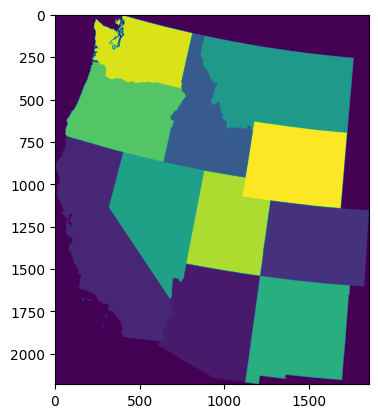

<Axes: >

In [10]:
# open state raster file
conus_array = rasterio.open(state_raster_path).read(1)
show(conus_array)

## Wind Analysis

### Calculate Wind Generation Availability by Scenario 

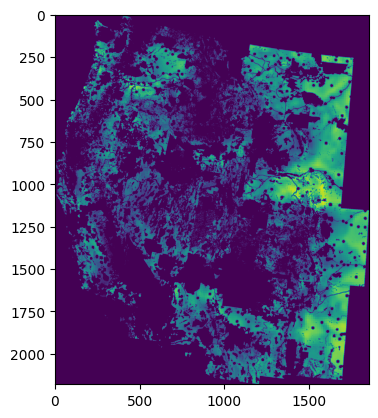

Analyzing Wind_120m for 6 MW Power Density...
baseline


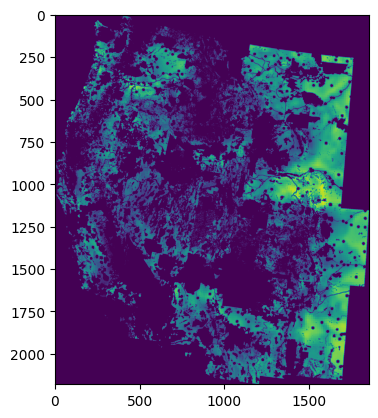

arizona total_generation: 1483581268 needed_generation: 27752747 difference: 1455828520.8185742
california total_generation: 1292447312 needed_generation: 121274529 difference: 1171172783.573286
colorado total_generation: 2628339292 needed_generation: 70774379 difference: 2557564912.921572
idaho total_generation: 669492136 needed_generation: 12609890 difference: 656882246.3918164
montana total_generation: 3521482405 needed_generation: 131012816 difference: 3390469589.2259374
new_mexico total_generation: 3727956489 needed_generation: 47690850 difference: 3680265639.5463867
nevada total_generation: 1150136800 needed_generation: 9780478 difference: 1140356321.353701
oregon total_generation: 1607990545 needed_generation: 26721766 difference: 1581268778.4821923
utah total_generation: 422765172 needed_generation: 32885691 difference: 389879480.1900049
washington total_generation: 1143802009 needed_generation: 24931334 difference: 1118870675.336504
wyoming total_generation: 3491416521 needed_

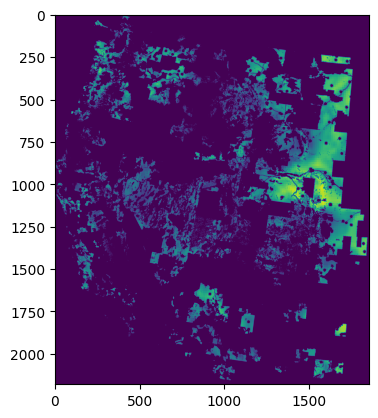

arizona total_generation: 678534617 needed_generation: 27752747 difference: 650781870.432832
california total_generation: 537202802 needed_generation: 121274529 difference: 415928273.093916
colorado total_generation: 1353657861 needed_generation: 70774379 difference: 1282883482.3283105
idaho total_generation: 313601901 needed_generation: 12609890 difference: 300992011.05111814
montana total_generation: 1964582128 needed_generation: 131012816 difference: 1833569312.7269142
new_mexico total_generation: 393482420 needed_generation: 47690850 difference: 345791570.96777344
nevada total_generation: 860628180 needed_generation: 9780478 difference: 850847701.6923242
oregon total_generation: 533739846 needed_generation: 26721766 difference: 507018079.49964845
utah total_generation: 325903929 needed_generation: 32885691 difference: 293018237.4877344
washington total_generation: 648266865 needed_generation: 24931334 difference: 623335531.5099658
wyoming total_generation: 3021748589 needed_generat

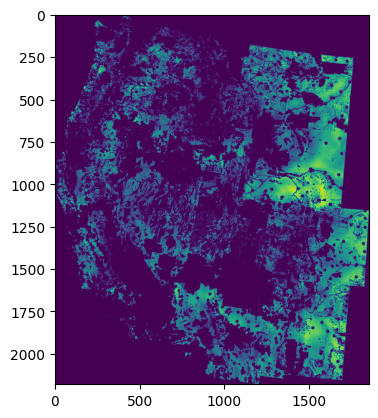

arizona total_generation: 1472422287 needed_generation: 27752747 difference: 1444669540.0766308
california total_generation: 1169100398 needed_generation: 121274529 difference: 1047825869.1404248
colorado total_generation: 2389226651 needed_generation: 70774379 difference: 2318452272.3651757
idaho total_generation: 655829909 needed_generation: 12609890 difference: 643220019.4076855
montana total_generation: 2952204148 needed_generation: 131012816 difference: 2821191332.723618
new_mexico total_generation: 3275030117 needed_generation: 47690850 difference: 3227339267.786865
nevada total_generation: 1149887716 needed_generation: 9780478 difference: 1140107238.1740136
oregon total_generation: 1012963092 needed_generation: 26721766 difference: 986241326.0154566
utah total_generation: 391933021 needed_generation: 32885691 difference: 359047329.3919092
washington total_generation: 612006679 needed_generation: 24931334 difference: 587075345.0146044
wyoming total_generation: 3468950627 needed_g

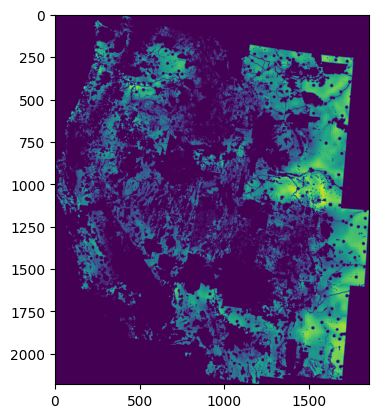

arizona total_generation: 1475175173 needed_generation: 27752747 difference: 1447422426.6452343
california total_generation: 1263601803 needed_generation: 121274529 difference: 1142327273.8607616
colorado total_generation: 2621749180 needed_generation: 70774379 difference: 2550974801.2449365
idaho total_generation: 657995482 needed_generation: 12609890 difference: 645385592.2343457
montana total_generation: 3506888635 needed_generation: 131012816 difference: 3375875819.070664
new_mexico total_generation: 3717323470 needed_generation: 47690850 difference: 3669632620.45459
nevada total_generation: 1105798066 needed_generation: 9780478 difference: 1096017587.9550195
oregon total_generation: 1601743519 needed_generation: 26721766 difference: 1575021752.2639306
utah total_generation: 422357094 needed_generation: 32885691 difference: 389471402.6517969
washington total_generation: 1115787473 needed_generation: 24931334 difference: 1090856139.0506153
wyoming total_generation: 3468189860 needed

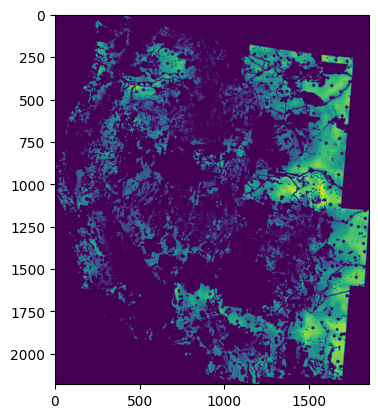

arizona total_generation: 1291385039 needed_generation: 27752747 difference: 1263632292.1647656
california total_generation: 1014670146 needed_generation: 121274529 difference: 893395617.5792676
colorado total_generation: 2400923721 needed_generation: 70774379 difference: 2330149342.224673
idaho total_generation: 541117605 needed_generation: 12609890 difference: 528507715.03500485
montana total_generation: 3170819402 needed_generation: 131012816 difference: 3039806586.3011327
new_mexico total_generation: 3267310396 needed_generation: 47690850 difference: 3219619546.102295
nevada total_generation: 832087406 needed_generation: 9780478 difference: 822306928.0910058
oregon total_generation: 1305194327 needed_generation: 26721766 difference: 1278472560.182937
utah total_generation: 325872727 needed_generation: 32885691 difference: 292987035.95001465
washington total_generation: 959731406 needed_generation: 24931334 difference: 934800072.1608447
wyoming total_generation: 3210401896 needed_ge

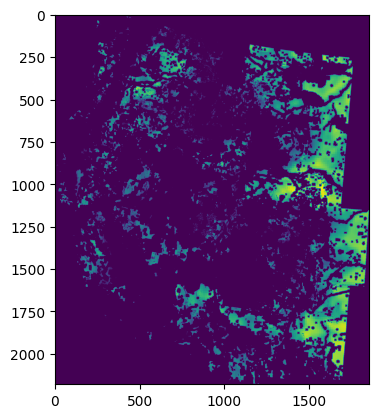

arizona total_generation: 758881548 needed_generation: 27752747 difference: 731128801.6625683
california total_generation: 366767587 needed_generation: 121274529 difference: 245493058.33274657
colorado total_generation: 1706918799 needed_generation: 70774379 difference: 1636144420.120669
idaho total_generation: 214757507 needed_generation: 12609890 difference: 202147616.93234375
montana total_generation: 2054231354 needed_generation: 131012816 difference: 1923218538.2483985
new_mexico total_generation: 2084801557 needed_generation: 47690850 difference: 2037110707.034912
nevada total_generation: 360240225 needed_generation: 9780478 difference: 350459746.7780176
oregon total_generation: 564403243 needed_generation: 26721766 difference: 537681476.9240259
utah total_generation: 131023631 needed_generation: 32885691 difference: 98137939.31585938
washington total_generation: 466738539 needed_generation: 24931334 difference: 441807205.9076709
wyoming total_generation: 2198108529 needed_genera

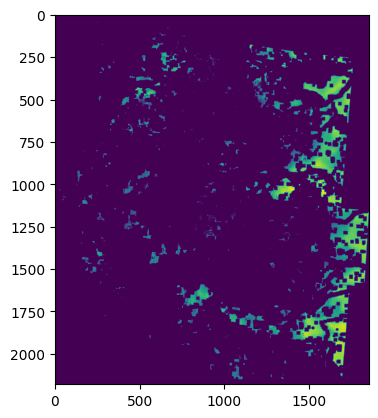

arizona total_generation: 395669956 needed_generation: 27752747 difference: 367917208.95773435
california total_generation: 84928133 needed_generation: 121274529 difference: -36346395.187211916
colorado total_generation: 1038144559 needed_generation: 70774379 difference: 967370180.0160546
idaho total_generation: 42180842 needed_generation: 12609890 difference: 29570951.73605469
montana total_generation: 1055001292 needed_generation: 131012816 difference: 923988476.3416601
new_mexico total_generation: 1237071850 needed_generation: 47690850 difference: 1189381000.1872559
nevada total_generation: 152522142 needed_generation: 9780478 difference: 142741663.8292871
oregon total_generation: 188638044 needed_generation: 26721766 difference: 161916277.85853517
utah total_generation: 31900575 needed_generation: 32885691 difference: -985116.1270117201
washington total_generation: 148156619 needed_generation: 24931334 difference: 123225285.64827149
wyoming total_generation: 1240810107 needed_gener

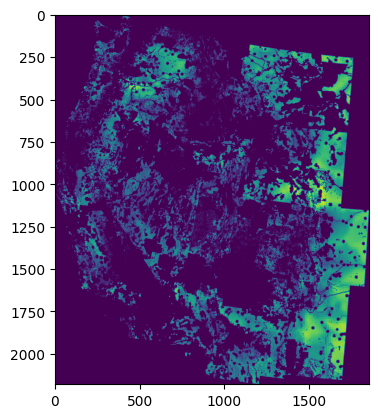

arizona total_generation: 1125430748 needed_generation: 27752747 difference: 1097678001.5426953
california total_generation: 1036779671 needed_generation: 121274529 difference: 915505142.2085401
colorado total_generation: 2525900871 needed_generation: 70774379 difference: 2455126492.42499
idaho total_generation: 513172161 needed_generation: 12609890 difference: 500562271.1679394
montana total_generation: 2115873754 needed_generation: 131012816 difference: 1984860938.7364357
new_mexico total_generation: 3660584534 needed_generation: 47690850 difference: 3612893684.18042
nevada total_generation: 1006766423 needed_generation: 9780478 difference: 996985945.1210351
oregon total_generation: 1140438794 needed_generation: 26721766 difference: 1113717027.7844384
utah total_generation: 387614734 needed_generation: 32885691 difference: 354729043.02728516
washington total_generation: 962811280 needed_generation: 24931334 difference: 937879946.3921679
wyoming total_generation: 2344702618 needed_gen

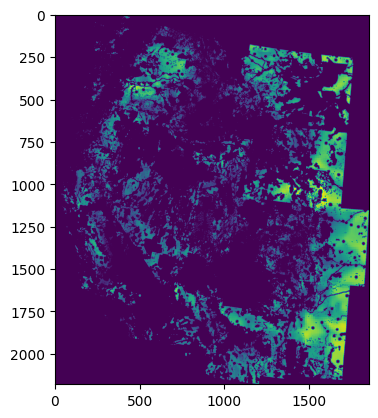

arizona total_generation: 862771093 needed_generation: 27752747 difference: 835018346.3363965
california total_generation: 696669861 needed_generation: 121274529 difference: 575395332.3657666
colorado total_generation: 2283968235 needed_generation: 70774379 difference: 2213193856.4916406
idaho total_generation: 380462084 needed_generation: 12609890 difference: 367852194.46627927
montana total_generation: 1764064576 needed_generation: 131012816 difference: 1633051760.3420265
new_mexico total_generation: 3167448741 needed_generation: 47690850 difference: 3119757891.300293
nevada total_generation: 736641879 needed_generation: 9780478 difference: 726861400.9127831
oregon total_generation: 798705915 needed_generation: 26721766 difference: 771984148.3504175
utah total_generation: 256872358 needed_generation: 32885691 difference: 223986666.98004395
washington total_generation: 736097711 needed_generation: 24931334 difference: 711166377.4838427
wyoming total_generation: 1990619545 needed_gener

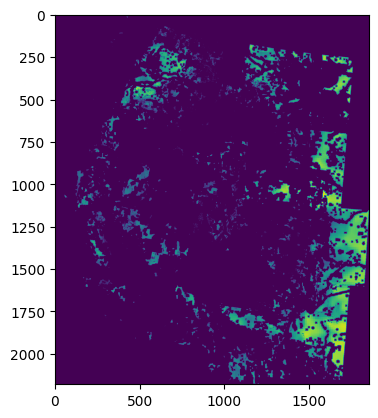

arizona total_generation: 390449088 needed_generation: 27752747 difference: 362696340.84298825
california total_generation: 216779254 needed_generation: 121274529 difference: 95504725.58213623
colorado total_generation: 1600977794 needed_generation: 70774379 difference: 1530203415.362246
idaho total_generation: 96591146 needed_generation: 12609890 difference: 83981256.06161621
montana total_generation: 814147617 needed_generation: 131012816 difference: 683134801.011582
new_mexico total_generation: 1998295180 needed_generation: 47690850 difference: 1950604330.4311523
nevada total_generation: 302631214 needed_generation: 9780478 difference: 292850735.6583887
oregon total_generation: 362608305 needed_generation: 26721766 difference: 335886538.7215723
utah total_generation: 81724959 needed_generation: 32885691 difference: 48839267.62176758
washington total_generation: 394609904 needed_generation: 24931334 difference: 369678570.3629932
wyoming total_generation: 1033878792 needed_generation:

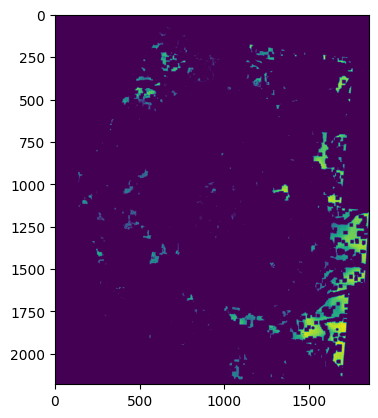

arizona total_generation: 154923237 needed_generation: 27752747 difference: 127170490.07589844
california total_generation: 50111176 needed_generation: 121274529 difference: -71163353.07026856
colorado total_generation: 967875010 needed_generation: 70774379 difference: 897100631.2218652
idaho total_generation: 14584167 needed_generation: 12609890 difference: 1974277.4264843743
montana total_generation: 246004963 needed_generation: 131012816 difference: 114992147.16734375
new_mexico total_generation: 1206794611 needed_generation: 47690850 difference: 1159103761.6948242
nevada total_generation: 128063440 needed_generation: 9780478 difference: 118282962.21649414
oregon total_generation: 134008940 needed_generation: 26721766 difference: 107287173.3468164
utah total_generation: 13612691 needed_generation: 32885691 difference: -19273000.804257814
washington total_generation: 131699155 needed_generation: 24931334 difference: 106767821.69758789
wyoming total_generation: 436999906 needed_genera

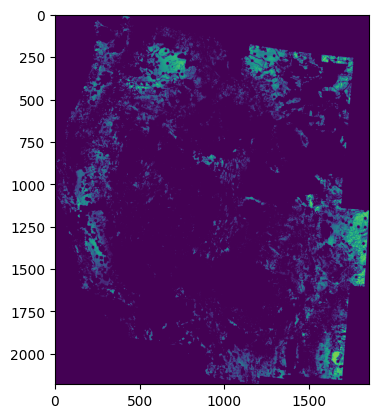

arizona total_generation: 220186095 needed_generation: 27752747 difference: 192433348.69845703
california total_generation: 762612806 needed_generation: 121274529 difference: 641338277.352461
colorado total_generation: 1355437031 needed_generation: 70774379 difference: 1284662652.5416894
idaho total_generation: 221865873 needed_generation: 12609890 difference: 209255983.20382813
montana total_generation: 1137135075 needed_generation: 131012816 difference: 1006122259.2327734
new_mexico total_generation: 939800197 needed_generation: 47690850 difference: 892109347.0187988
nevada total_generation: 52908057 needed_generation: 9780478 difference: 43127578.90655762
oregon total_generation: 572703347 needed_generation: 26721766 difference: 545981580.2257837
utah total_generation: 95107040 needed_generation: 32885691 difference: 62221348.41803223
washington total_generation: 763245241 needed_generation: 24931334 difference: 738313907.3918017
wyoming total_generation: 227221441 needed_generation

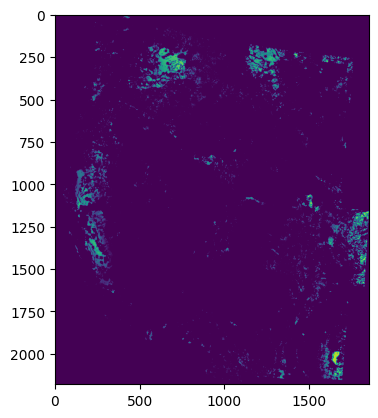

arizona total_generation: 22726990 needed_generation: 27752747 difference: -5025757.098662108
california total_generation: 431253750 needed_generation: 121274529 difference: 309979221.73692137
colorado total_generation: 415085526 needed_generation: 70774379 difference: 344311147.1649805
idaho total_generation: 73384320 needed_generation: 12609890 difference: 60774430.27707031
montana total_generation: 388045592 needed_generation: 131012816 difference: 257032776.81126463
new_mexico total_generation: 242474210 needed_generation: 47690850 difference: 194783360.60742188
nevada total_generation: 4102211 needed_generation: 9780478 difference: -5678266.928037109
oregon total_generation: 87669447 needed_generation: 26721766 difference: 60947680.83033691
utah total_generation: 20843136 needed_generation: 32885691 difference: -12042555.15411133
washington total_generation: 393889468 needed_generation: 24931334 difference: 368958134.626543
wyoming total_generation: 46130010 needed_generation: 102

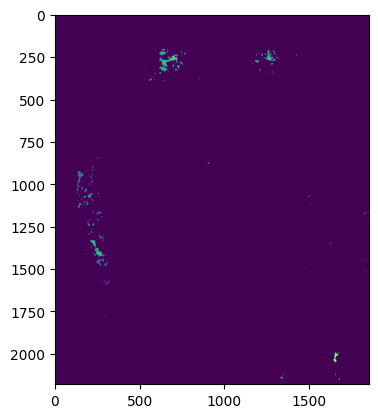

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 108208875 needed_generation: 121274529 difference: -13065653.714067385
colorado total_generation: 2523960 needed_generation: 70774379 difference: -68250419.24957031
idaho total_generation: 1537018 needed_generation: 12609890 difference: -11072871.56716797
montana total_generation: 41543888 needed_generation: 131012816 difference: -89468927.53333984
new_mexico total_generation: 24349152 needed_generation: 47690850 difference: -23341697.575195312
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 157384 needed_generation: 26721766 difference: -26564382.16734375
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 99690051 needed_generation: 24931334 difference: 74758717.32393067
wyoming total_generation: 907020 needed_generation: 102556313 difference: -101649292.8846875
env_3

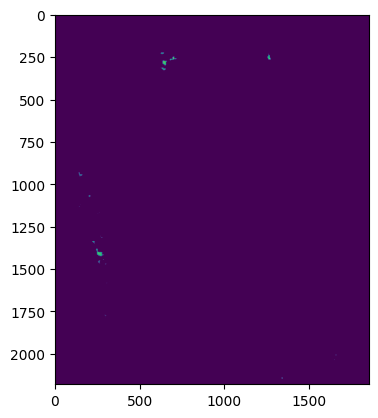

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 20017153 needed_generation: 121274529 difference: -101257375.40376465
colorado total_generation: 0 needed_generation: 70774379 difference: -70774379.44
idaho total_generation: 0 needed_generation: 12609890 difference: -12609890.47
montana total_generation: 5669766 needed_generation: 131012816 difference: -125343049.87123047
new_mexico total_generation: 648002 needed_generation: 47690850 difference: -47042847.52001953
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 0 needed_generation: 26721766 difference: -26721766.89
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 18618590 needed_generation: 24931334 difference: -6312743.786054686
wyoming total_generation: 0 needed_generation: 102556313 difference: -102556313.33
dac_farm_env1


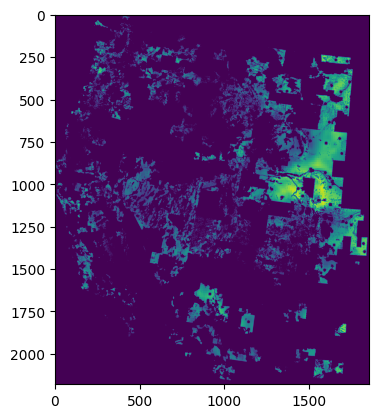

arizona total_generation: 673758422 needed_generation: 27752747 difference: 646005675.1574414
california total_generation: 499549921 needed_generation: 121274529 difference: 378275392.1794873
colorado total_generation: 1227365596 needed_generation: 70774379 difference: 1156591216.8600488
idaho total_generation: 298016517 needed_generation: 12609890 difference: 285406626.8028271
montana total_generation: 1698919355 needed_generation: 131012816 difference: 1567906539.8526466
new_mexico total_generation: 336154392 needed_generation: 47690850 difference: 288463542.8342285
nevada total_generation: 831833391 needed_generation: 9780478 difference: 822052913.2496972
oregon total_generation: 287456166 needed_generation: 26721766 difference: 260734399.36488283
utah total_generation: 300156674 needed_generation: 32885691 difference: 267270982.11151367
washington total_generation: 358768906 needed_generation: 24931334 difference: 333837572.21309084
wyoming total_generation: 2985485262 needed_gener

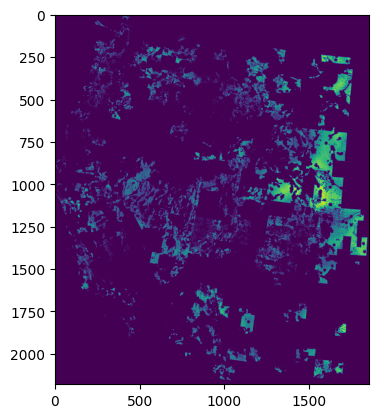

arizona total_generation: 495943735 needed_generation: 27752747 difference: 468190987.899873
california total_generation: 394628173 needed_generation: 121274529 difference: 273353644.5753613
colorado total_generation: 1182863191 needed_generation: 70774379 difference: 1112088812.40021
idaho total_generation: 233697767 needed_generation: 12609890 difference: 221087877.12899902
montana total_generation: 1008222468 needed_generation: 131012816 difference: 877209652.5858008
new_mexico total_generation: 332921713 needed_generation: 47690850 difference: 285230863.0371094
nevada total_generation: 747355195 needed_generation: 9780478 difference: 737574716.402041
oregon total_generation: 206486277 needed_generation: 26721766 difference: 179764511.0130762
utah total_generation: 279845104 needed_generation: 32885691 difference: 246959412.81708008
washington total_generation: 291478718 needed_generation: 24931334 difference: 266547384.59224123
wyoming total_generation: 2009486702 needed_generation

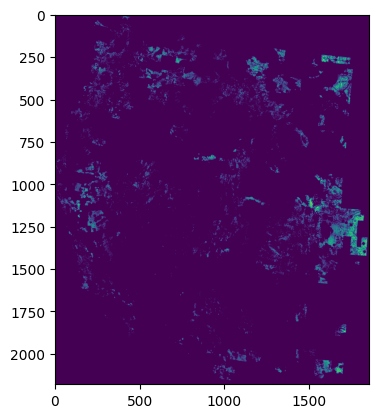

arizona total_generation: 67954856 needed_generation: 27752747 difference: 40202108.79123047
california total_generation: 281556904 needed_generation: 121274529 difference: 160282375.82035643
colorado total_generation: 682082413 needed_generation: 70774379 difference: 611308033.8827538
idaho total_generation: 101249266 needed_generation: 12609890 difference: 88639375.95529297
montana total_generation: 504874465 needed_generation: 131012816 difference: 373861649.6943213
new_mexico total_generation: 141556983 needed_generation: 47690850 difference: 93866133.99023438
nevada total_generation: 44619846 needed_generation: 9780478 difference: 34839367.798891604
oregon total_generation: 126608416 needed_generation: 26721766 difference: 99886649.6400293
utah total_generation: 71547964 needed_generation: 32885691 difference: 38662272.264467776
washington total_generation: 210276366 needed_generation: 24931334 difference: 185345031.95808595
wyoming total_generation: 209807517 needed_generation: 1

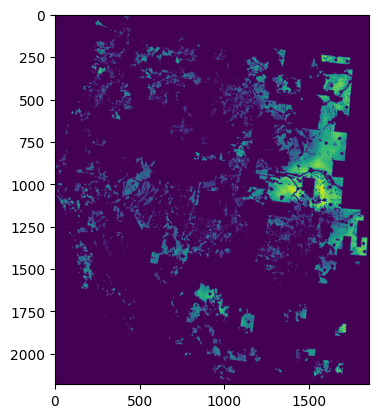

arizona total_generation: 590222126 needed_generation: 27752747 difference: 562469378.8556836
california total_generation: 399915630 needed_generation: 121274529 difference: 278641101.45823485
colorado total_generation: 1107517555 needed_generation: 70774379 difference: 1036743176.3844628
idaho total_generation: 243833588 needed_generation: 12609890 difference: 231223698.2685254
montana total_generation: 1539316980 needed_generation: 131012816 difference: 1408304164.4499366
new_mexico total_generation: 276644089 needed_generation: 47690850 difference: 228953239.7841797
nevada total_generation: 618935986 needed_generation: 9780478 difference: 609155508.2992578
oregon total_generation: 225335866 needed_generation: 26721766 difference: 198614099.7704004
utah total_generation: 233910559 needed_generation: 32885691 difference: 201024867.90570313
washington total_generation: 298400581 needed_generation: 24931334 difference: 273469247.7971973
wyoming total_generation: 2772071999 needed_genera

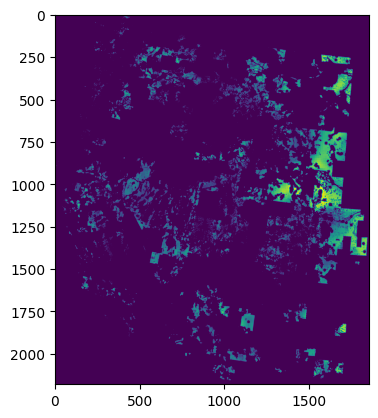

arizona total_generation: 355255786 needed_generation: 27752747 difference: 327503039.50631833
california total_generation: 244570028 needed_generation: 121274529 difference: 123295499.21897705
colorado total_generation: 1039598166 needed_generation: 70774379 difference: 968823787.4070458
idaho total_generation: 170237237 needed_generation: 12609890 difference: 157627346.78073242
montana total_generation: 842681536 needed_generation: 131012816 difference: 711668720.4061133
new_mexico total_generation: 269678770 needed_generation: 47690850 difference: 221987920.3557129
nevada total_generation: 539912517 needed_generation: 9780478 difference: 530132038.6146875
oregon total_generation: 114425900 needed_generation: 26721766 difference: 87704133.80970703
utah total_generation: 191073779 needed_generation: 32885691 difference: 158188087.24847656
washington total_generation: 197029115 needed_generation: 24931334 difference: 172097781.62556642
wyoming total_generation: 1706877088 needed_genera

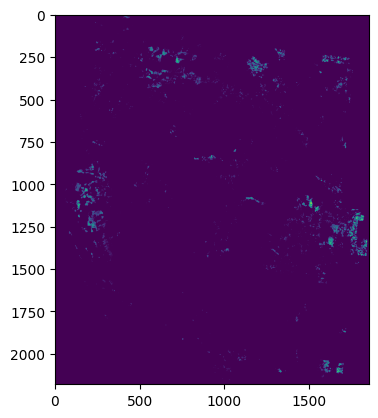

arizona total_generation: 6401166 needed_generation: 27752747 difference: -21351580.605498046
california total_generation: 145183609 needed_generation: 121274529 difference: 23909080.40946777
colorado total_generation: 210534381 needed_generation: 70774379 difference: 139760002.1459375
idaho total_generation: 33071629 needed_generation: 12609890 difference: 20461739.332124025
montana total_generation: 119779870 needed_generation: 131012816 difference: -11232945.545546874
new_mexico total_generation: 46903288 needed_generation: 47690850 difference: -787561.74609375
nevada total_generation: 3862721 needed_generation: 9780478 difference: -5917756.8189062495
oregon total_generation: 18437344 needed_generation: 26721766 difference: -8284422.666855469
utah total_generation: 16802575 needed_generation: 32885691 difference: -16083116.579160158
washington total_generation: 81892199 needed_generation: 24931334 difference: 56960865.38533203
wyoming total_generation: 39298138 needed_generation: 10

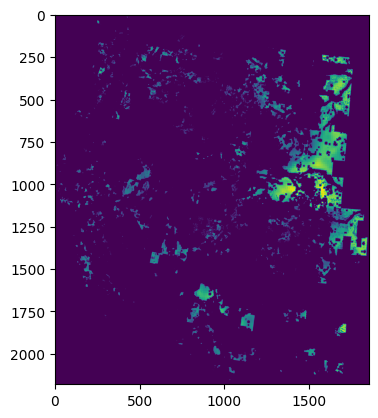

arizona total_generation: 367869940 needed_generation: 27752747 difference: 340117193.7055371
california total_generation: 133432989 needed_generation: 121274529 difference: 12158460.712019041
colorado total_generation: 748961193 needed_generation: 70774379 difference: 678186814.3689599
idaho total_generation: 88075415 needed_generation: 12609890 difference: 75465525.0041211
montana total_generation: 1019640965 needed_generation: 131012816 difference: 888628149.582749
new_mexico total_generation: 146617501 needed_generation: 47690850 difference: 98926651.99291992
nevada total_generation: 265953360 needed_generation: 9780478 difference: 256172881.64911133
oregon total_generation: 80655192 needed_generation: 26721766 difference: 53933425.49818359
utah total_generation: 95923240 needed_generation: 32885691 difference: 63037548.99725586
washington total_generation: 114630712 needed_generation: 24931334 difference: 89699378.80671875
wyoming total_generation: 1933221328 needed_generation: 10

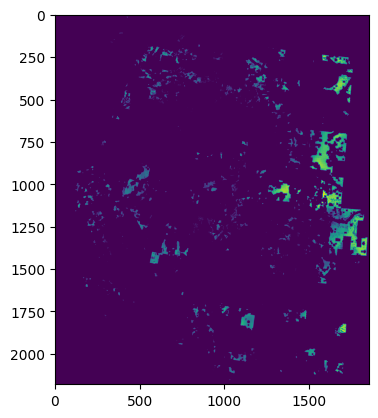

arizona total_generation: 156059013 needed_generation: 27752747 difference: 128306265.83126953
california total_generation: 64201587 needed_generation: 121274529 difference: -57072941.21107666
colorado total_generation: 688350752 needed_generation: 70774379 difference: 617576373.1135888
idaho total_generation: 41441570 needed_generation: 12609890 difference: 28831680.172578126
montana total_generation: 411525791 needed_generation: 131012816 difference: 280512975.0832373
new_mexico total_generation: 140662638 needed_generation: 47690850 difference: 92971788.0805664
nevada total_generation: 217803566 needed_generation: 9780478 difference: 208023088.0888086
oregon total_generation: 47299361 needed_generation: 26721766 difference: 20577594.69251953
utah total_generation: 62620599 needed_generation: 32885691 difference: 29734907.67450195
washington total_generation: 82703237 needed_generation: 24931334 difference: 57771903.3406543
wyoming total_generation: 885507074 needed_generation: 10255

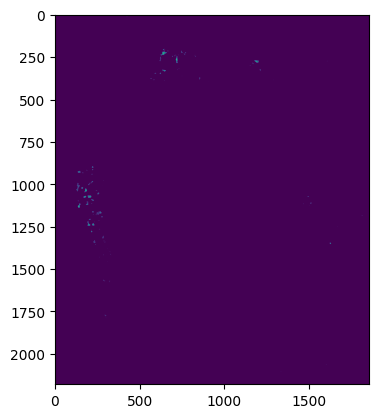

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 28606998 needed_generation: 121274529 difference: -92667530.81807129
colorado total_generation: 551793 needed_generation: 70774379 difference: -70222586.36089844
idaho total_generation: 456228 needed_generation: 12609890 difference: -12153661.953642579
montana total_generation: 3278396 needed_generation: 131012816 difference: -127734419.485
new_mexico total_generation: 45629 needed_generation: 47690850 difference: -47645220.985839844
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 0 needed_generation: 26721766 difference: -26721766.89
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 12990684 needed_generation: 24931334 difference: -11940650.003828123
wyoming total_generation: 484224 needed_generation: 102556313 difference: -102072089.27726562
dac_farm_env1_10km


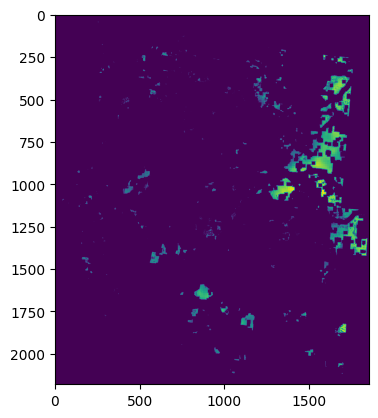

arizona total_generation: 218014376 needed_generation: 27752747 difference: 190261628.93698242
california total_generation: 22255591 needed_generation: 121274529 difference: -99018937.78865235
colorado total_generation: 455149532 needed_generation: 70774379 difference: 384375152.8059717
idaho total_generation: 11342020 needed_generation: 12609890 difference: -1267870.1245410163
montana total_generation: 549759940 needed_generation: 131012816 difference: 418747123.98350585
new_mexico total_generation: 83118951 needed_generation: 47690850 difference: 35428101.91845703
nevada total_generation: 114342155 needed_generation: 9780478 difference: 104561676.32416016
oregon total_generation: 18817750 needed_generation: 26721766 difference: -7904016.457382813
utah total_generation: 24576610 needed_generation: 32885691 difference: -8309081.429013673
washington total_generation: 23620638 needed_generation: 24931334 difference: -1310695.14323242
wyoming total_generation: 1141114568 needed_generation

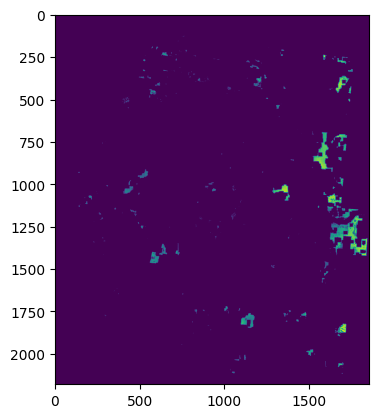

arizona total_generation: 68890496 needed_generation: 27752747 difference: 41137749.16549805
california total_generation: 8351863 needed_generation: 121274529 difference: -112922666.01973145
colorado total_generation: 422557937 needed_generation: 70774379 difference: 351783557.92865235
idaho total_generation: 3861556 needed_generation: 12609890 difference: -8748334.277617188
montana total_generation: 136960811 needed_generation: 131012816 difference: 5947995.198593751
new_mexico total_generation: 81669518 needed_generation: 47690850 difference: 33978668.80371094
nevada total_generation: 91642700 needed_generation: 9780478 difference: 81862222.27044922
oregon total_generation: 14692056 needed_generation: 26721766 difference: -12029710.079941407
utah total_generation: 10611737 needed_generation: 32885691 difference: -22273954.563291017
washington total_generation: 16671094 needed_generation: 24931334 difference: -8260239.447431639
wyoming total_generation: 390692993 needed_generation: 10

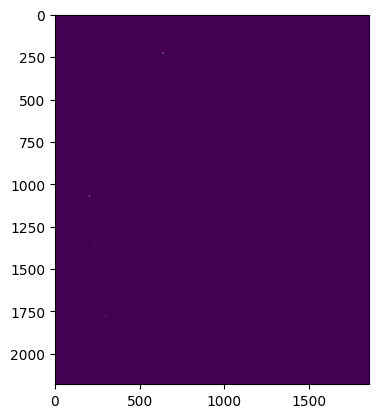

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 1292424 needed_generation: 121274529 difference: -119982104.61921875
colorado total_generation: 0 needed_generation: 70774379 difference: -70774379.44
idaho total_generation: 0 needed_generation: 12609890 difference: -12609890.47
montana total_generation: 0 needed_generation: 131012816 difference: -131012816.11
new_mexico total_generation: 0 needed_generation: 47690850 difference: -47690850.0
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 0 needed_generation: 26721766 difference: -26721766.89
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 771409 needed_generation: 24931334 difference: -24159924.86564453
wyoming total_generation: 0 needed_generation: 102556313 difference: -102556313.33
Analyzing Wind_120m for 12 MW Power Density...
baseline


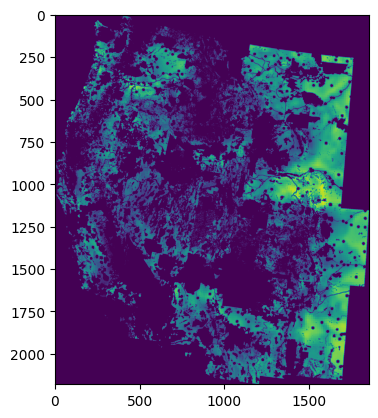

arizona total_generation: 2967162536 needed_generation: 27752747 difference: 2939409788.8571486
california total_generation: 2584894625 needed_generation: 121274529 difference: 2463620096.316572
colorado total_generation: 5256678584 needed_generation: 70774379 difference: 5185904205.283145
idaho total_generation: 1338984273 needed_generation: 12609890 difference: 1326374383.2536328
montana total_generation: 7042964810 needed_generation: 131012816 difference: 6911951994.561875
new_mexico total_generation: 7455912979 needed_generation: 47690850 difference: 7408222129.092773
nevada total_generation: 2300273600 needed_generation: 9780478 difference: 2290493121.3974023
oregon total_generation: 3215981090 needed_generation: 26721766 difference: 3189259323.854385
utah total_generation: 845530344 needed_generation: 32885691 difference: 812644652.3200097
washington total_generation: 2287604018 needed_generation: 24931334 difference: 2262672684.753008
wyoming total_generation: 6982833042 needed_

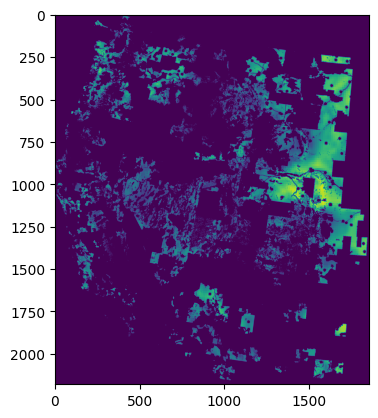

arizona total_generation: 1357069235 needed_generation: 27752747 difference: 1329316488.085664
california total_generation: 1074405604 needed_generation: 121274529 difference: 953131075.3578321
colorado total_generation: 2707315723 needed_generation: 70774379 difference: 2636541344.096621
idaho total_generation: 627203803 needed_generation: 12609890 difference: 614593912.5722363
montana total_generation: 3929164257 needed_generation: 131012816 difference: 3798151441.563828
new_mexico total_generation: 786964841 needed_generation: 47690850 difference: 739273991.9355469
nevada total_generation: 1721256360 needed_generation: 9780478 difference: 1711475882.0746484
oregon total_generation: 1067479692 needed_generation: 26721766 difference: 1040757925.8892969
utah total_generation: 651807858 needed_generation: 32885691 difference: 618922166.9154687
washington total_generation: 1296533731 needed_generation: 24931334 difference: 1271602397.0999317
wyoming total_generation: 6043497178 needed_ge

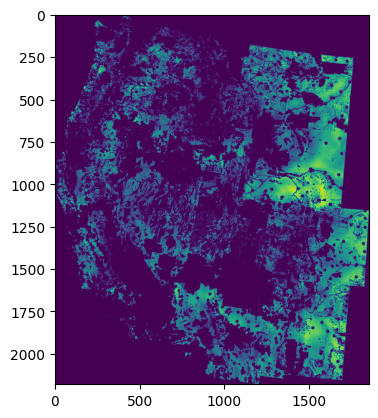

arizona total_generation: 2944844574 needed_generation: 27752747 difference: 2917091827.373262
california total_generation: 2338200796 needed_generation: 121274529 difference: 2216926267.4508495
colorado total_generation: 4778453303 needed_generation: 70774379 difference: 4707678924.170352
idaho total_generation: 1311659819 needed_generation: 12609890 difference: 1299049929.285371
montana total_generation: 5904408297 needed_generation: 131012816 difference: 5773395481.557237
new_mexico total_generation: 6550060235 needed_generation: 47690850 difference: 6502369385.57373
nevada total_generation: 2299775433 needed_generation: 9780478 difference: 2289994955.0380273
oregon total_generation: 2025926185 needed_generation: 26721766 difference: 1999204418.920913
utah total_generation: 783866042 needed_generation: 32885691 difference: 750980350.7238183
washington total_generation: 1224013358 needed_generation: 24931334 difference: 1199082024.109209
wyoming total_generation: 6937901254 needed_ge

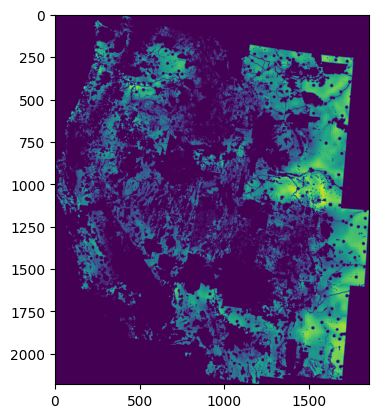

arizona total_generation: 2950350347 needed_generation: 27752747 difference: 2922597600.510469
california total_generation: 2527203606 needed_generation: 121274529 difference: 2405929076.8915234
colorado total_generation: 5243498361 needed_generation: 70774379 difference: 5172723981.929873
idaho total_generation: 1315990965 needed_generation: 12609890 difference: 1303381074.9386914
montana total_generation: 7013777270 needed_generation: 131012816 difference: 6882764454.251328
new_mexico total_generation: 7434646940 needed_generation: 47690850 difference: 7386956090.90918
nevada total_generation: 2211596133 needed_generation: 9780478 difference: 2201815654.600039
oregon total_generation: 3203487038 needed_generation: 26721766 difference: 3176765271.4178615
utah total_generation: 844714189 needed_generation: 32885691 difference: 811828497.2435937
washington total_generation: 2231574946 needed_generation: 24931334 difference: 2206643612.1812305
wyoming total_generation: 6936379721 needed_

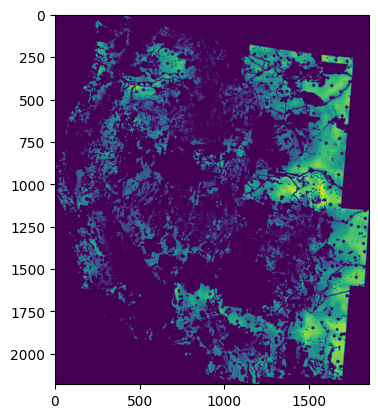

arizona total_generation: 2582770078 needed_generation: 27752747 difference: 2555017331.5495315
california total_generation: 2029340293 needed_generation: 121274529 difference: 1908065764.328535
colorado total_generation: 4801847443 needed_generation: 70774379 difference: 4731073063.889346
idaho total_generation: 1082235211 needed_generation: 12609890 difference: 1069625320.5400097
montana total_generation: 6341638804 needed_generation: 131012816 difference: 6210625988.712266
new_mexico total_generation: 6534620792 needed_generation: 47690850 difference: 6486929942.20459
nevada total_generation: 1664174813 needed_generation: 9780478 difference: 1654394334.8720117
oregon total_generation: 2610388654 needed_generation: 26721766 difference: 2583666887.255874
utah total_generation: 651745455 needed_generation: 32885691 difference: 618859763.8400292
washington total_generation: 1919462812 needed_generation: 24931334 difference: 1894531478.4016895
wyoming total_generation: 6420803792 needed_

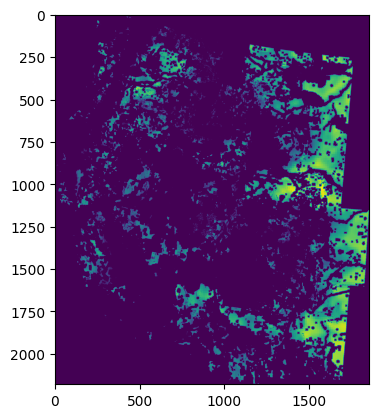

arizona total_generation: 1517763097 needed_generation: 27752747 difference: 1490010350.5451367
california total_generation: 733535175 needed_generation: 121274529 difference: 612260645.8354932
colorado total_generation: 3413837599 needed_generation: 70774379 difference: 3343063219.681338
idaho total_generation: 429515014 needed_generation: 12609890 difference: 416905124.3346875
montana total_generation: 4108462708 needed_generation: 131012816 difference: 3977449892.6067967
new_mexico total_generation: 4169603114 needed_generation: 47690850 difference: 4121912264.069824
nevada total_generation: 720480450 needed_generation: 9780478 difference: 710699972.2460351
oregon total_generation: 1128806487 needed_generation: 26721766 difference: 1102084720.7380517
utah total_generation: 262047262 needed_generation: 32885691 difference: 229161570.57171875
washington total_generation: 933477079 needed_generation: 24931334 difference: 908545745.8953418
wyoming total_generation: 4396217058 needed_gen

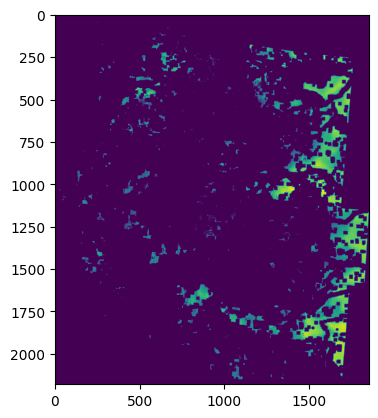

arizona total_generation: 791339912 needed_generation: 27752747 difference: 763587165.1354687
california total_generation: 169856267 needed_generation: 121274529 difference: 48581738.79557617
colorado total_generation: 2076289118 needed_generation: 70774379 difference: 2005514739.4721093
idaho total_generation: 84361684 needed_generation: 12609890 difference: 71751793.94210938
montana total_generation: 2110002584 needed_generation: 131012816 difference: 1978989768.7933204
new_mexico total_generation: 2474143700 needed_generation: 47690850 difference: 2426452850.3745117
nevada total_generation: 305044285 needed_generation: 9780478 difference: 295263806.3485742
oregon total_generation: 377276089 needed_generation: 26721766 difference: 350554322.6070703
utah total_generation: 63801151 needed_generation: 32885691 difference: 30915459.68597656
washington total_generation: 296313239 needed_generation: 24931334 difference: 271381905.376543
wyoming total_generation: 2481620214 needed_generatio

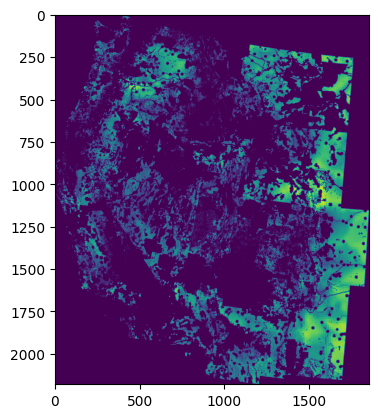

arizona total_generation: 2250861497 needed_generation: 27752747 difference: 2223108750.305391
california total_generation: 2073559342 needed_generation: 121274529 difference: 1952284813.58708
colorado total_generation: 5051801743 needed_generation: 70774379 difference: 4981027364.289981
idaho total_generation: 1026344323 needed_generation: 12609890 difference: 1013734432.8058789
montana total_generation: 4231747509 needed_generation: 131012816 difference: 4100734693.582871
new_mexico total_generation: 7321169068 needed_generation: 47690850 difference: 7273478218.36084
nevada total_generation: 2013532847 needed_generation: 9780478 difference: 2003752368.9320703
oregon total_generation: 2280877589 needed_generation: 26721766 difference: 2254155822.458877
utah total_generation: 775229469 needed_generation: 32885691 difference: 742343777.9945703
washington total_generation: 1925622560 needed_generation: 24931334 difference: 1900691226.864336
wyoming total_generation: 4689405236 needed_gen

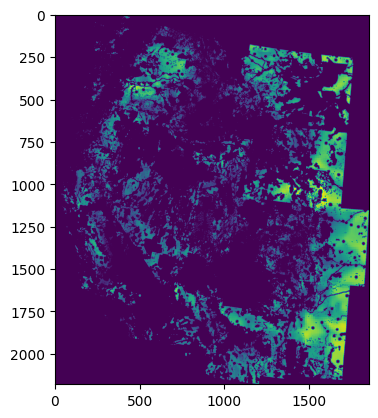

arizona total_generation: 1725542187 needed_generation: 27752747 difference: 1697789439.892793
california total_generation: 1393339723 needed_generation: 121274529 difference: 1272065193.9015331
colorado total_generation: 4567936471 needed_generation: 70774379 difference: 4497162092.423282
idaho total_generation: 760924169 needed_generation: 12609890 difference: 748314279.4025586
montana total_generation: 3528129152 needed_generation: 131012816 difference: 3397116336.7940526
new_mexico total_generation: 6334897482 needed_generation: 47690850 difference: 6287206632.600586
nevada total_generation: 1473283759 needed_generation: 9780478 difference: 1463503280.5155663
oregon total_generation: 1597411830 needed_generation: 26721766 difference: 1570690063.5908349
utah total_generation: 513744717 needed_generation: 32885691 difference: 480859025.9000879
washington total_generation: 1472195423 needed_generation: 24931334 difference: 1447264089.0476856
wyoming total_generation: 3981239091 needed

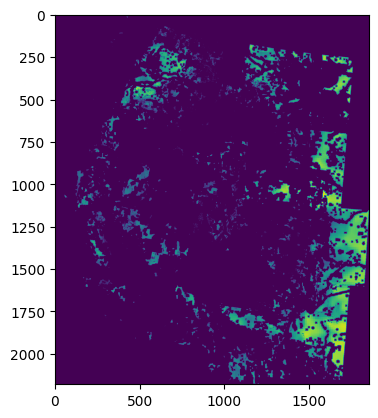

arizona total_generation: 780898176 needed_generation: 27752747 difference: 753145428.9059765
california total_generation: 433558509 needed_generation: 121274529 difference: 312283980.33427244
colorado total_generation: 3201955589 needed_generation: 70774379 difference: 3131181210.164492
idaho total_generation: 193182293 needed_generation: 12609890 difference: 180572402.59323242
montana total_generation: 1628295234 needed_generation: 131012816 difference: 1497282418.1331642
new_mexico total_generation: 3996590360 needed_generation: 47690850 difference: 3948899510.8623047
nevada total_generation: 605262428 needed_generation: 9780478 difference: 595481950.0067773
oregon total_generation: 725216611 needed_generation: 26721766 difference: 698494844.3331445
utah total_generation: 163449919 needed_generation: 32885691 difference: 130564227.18353516
washington total_generation: 789219808 needed_generation: 24931334 difference: 764288474.8059863
wyoming total_generation: 2067757584 needed_gene

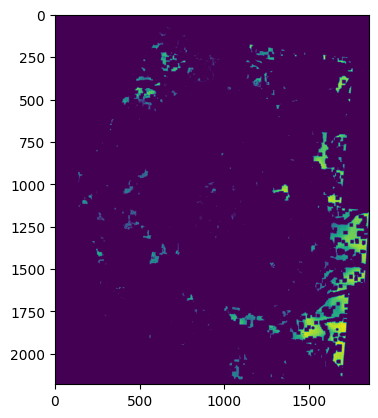

arizona total_generation: 309846474 needed_generation: 27752747 difference: 282093727.37179685
california total_generation: 100222352 needed_generation: 121274529 difference: -21052176.97053711
colorado total_generation: 1935750021 needed_generation: 70774379 difference: 1864975641.8837304
idaho total_generation: 29168335 needed_generation: 12609890 difference: 16558445.32296875
montana total_generation: 492009926 needed_generation: 131012816 difference: 360997110.4446875
new_mexico total_generation: 2413589223 needed_generation: 47690850 difference: 2365898373.3896484
nevada total_generation: 256126881 needed_generation: 9780478 difference: 246346403.12298828
oregon total_generation: 268017880 needed_generation: 26721766 difference: 241296113.58363283
utah total_generation: 27225382 needed_generation: 32885691 difference: -5660309.668515626
washington total_generation: 263398311 needed_generation: 24931334 difference: 238466977.4751758
wyoming total_generation: 873999813 needed_genera

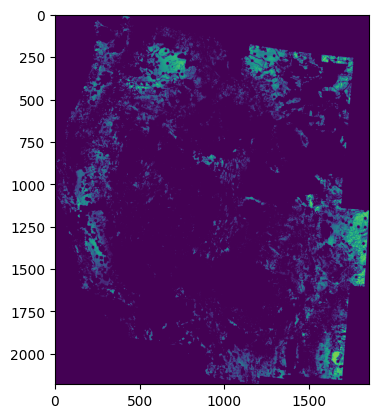

arizona total_generation: 440372191 needed_generation: 27752747 difference: 412619444.61691403
california total_generation: 1525225613 needed_generation: 121274529 difference: 1403951083.8749218
colorado total_generation: 2710874063 needed_generation: 70774379 difference: 2640099684.523379
idaho total_generation: 443731747 needed_generation: 12609890 difference: 431121856.8776562
montana total_generation: 2274270150 needed_generation: 131012816 difference: 2143257334.575547
new_mexico total_generation: 1879600394 needed_generation: 47690850 difference: 1831909544.0375977
nevada total_generation: 105816115 needed_generation: 9780478 difference: 96035636.50311524
oregon total_generation: 1145406694 needed_generation: 26721766 difference: 1118684927.3415673
utah total_generation: 190214080 needed_generation: 32885691 difference: 157328388.77606446
washington total_generation: 1526490482 needed_generation: 24931334 difference: 1501559148.8636036
wyoming total_generation: 454442883 needed_g

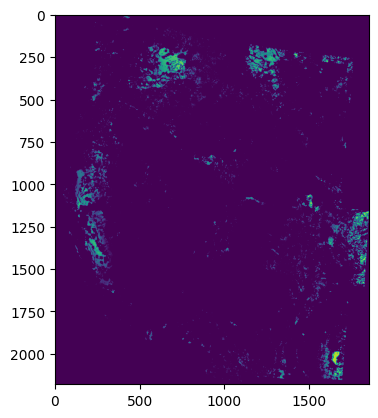

arizona total_generation: 45453980 needed_generation: 27752747 difference: 17701233.022675782
california total_generation: 862507501 needed_generation: 121274529 difference: 741232972.6438428
colorado total_generation: 830171053 needed_generation: 70774379 difference: 759396673.7699609
idaho total_generation: 146768641 needed_generation: 12609890 difference: 134158751.02414063
montana total_generation: 776091185 needed_generation: 131012816 difference: 645078369.7325293
new_mexico total_generation: 484948421 needed_generation: 47690850 difference: 437257571.21484375
nevada total_generation: 8204423 needed_generation: 9780478 difference: -1576055.1660742182
oregon total_generation: 175338895 needed_generation: 26721766 difference: 148617128.55067384
utah total_generation: 41686273 needed_generation: 32885691 difference: 8800581.631777342
washington total_generation: 787778937 needed_generation: 24931334 difference: 762847603.3330859
wyoming total_generation: 92260021 needed_generation: 

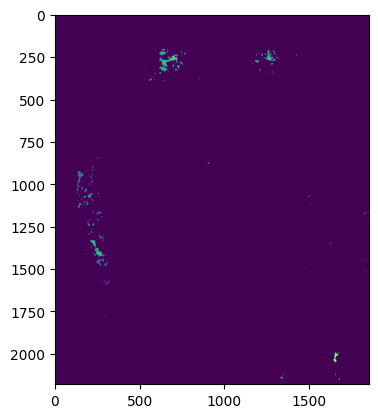

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 216417750 needed_generation: 121274529 difference: 95143221.74186523
colorado total_generation: 5047920 needed_generation: 70774379 difference: -65726459.05914062
idaho total_generation: 3074037 needed_generation: 12609890 difference: -9535852.664335938
montana total_generation: 83087777 needed_generation: 131012816 difference: -47925038.95667969
new_mexico total_generation: 48698304 needed_generation: 47690850 difference: 1007454.849609375
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 314769 needed_generation: 26721766 difference: -26406997.4446875
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 199380102 needed_generation: 24931334 difference: 174448768.72786134
wyoming total_generation: 1814040 needed_generation: 102556313 difference: -100742272.439375
env_3_10

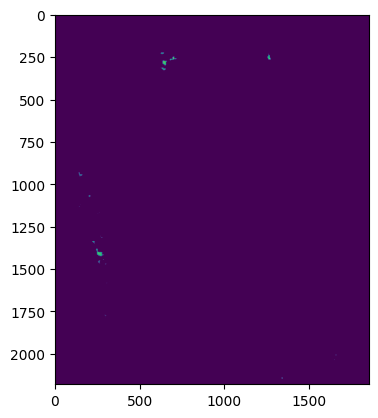

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 40034307 needed_generation: 121274529 difference: -81240221.6375293
colorado total_generation: 0 needed_generation: 70774379 difference: -70774379.44
idaho total_generation: 0 needed_generation: 12609890 difference: -12609890.47
montana total_generation: 11339532 needed_generation: 131012816 difference: -119673283.63246094
new_mexico total_generation: 1296004 needed_generation: 47690850 difference: -46394845.04003906
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 0 needed_generation: 26721766 difference: -26721766.89
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 37237180 needed_generation: 24931334 difference: 12305846.507890627
wyoming total_generation: 0 needed_generation: 102556313 difference: -102556313.33
dac_farm_env1


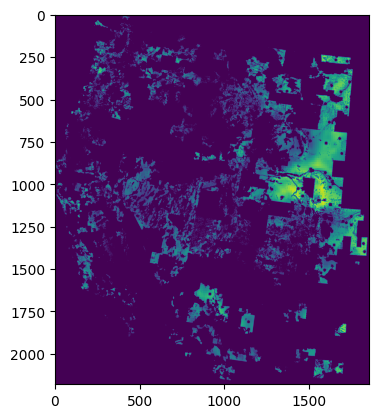

arizona total_generation: 1347516844 needed_generation: 27752747 difference: 1319764097.5348828
california total_generation: 999099842 needed_generation: 121274529 difference: 877825313.5289747
colorado total_generation: 2454731192 needed_generation: 70774379 difference: 2383956813.1600976
idaho total_generation: 596033034 needed_generation: 12609890 difference: 583423144.0756543
montana total_generation: 3397838711 needed_generation: 131012816 difference: 3266825895.815293
new_mexico total_generation: 672308785 needed_generation: 47690850 difference: 624617935.668457
nevada total_generation: 1663666783 needed_generation: 9780478 difference: 1653886305.1893945
oregon total_generation: 574912332 needed_generation: 26721766 difference: 548190565.6197656
utah total_generation: 600313348 needed_generation: 32885691 difference: 567427656.1630273
washington total_generation: 717537812 needed_generation: 24931334 difference: 692606478.5061816
wyoming total_generation: 5970970524 needed_genera

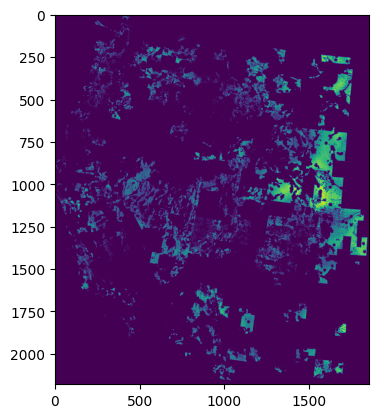

arizona total_generation: 991887470 needed_generation: 27752747 difference: 964134723.0197461
california total_generation: 789256347 needed_generation: 121274529 difference: 667981818.3207227
colorado total_generation: 2365726383 needed_generation: 70774379 difference: 2294952004.24042
idaho total_generation: 467395535 needed_generation: 12609890 difference: 454785644.727998
montana total_generation: 2016444937 needed_generation: 131012816 difference: 1885432121.2816017
new_mexico total_generation: 665843426 needed_generation: 47690850 difference: 618152576.0742188
nevada total_generation: 1494710390 needed_generation: 9780478 difference: 1484929911.494082
oregon total_generation: 412972555 needed_generation: 26721766 difference: 386250788.91615236
utah total_generation: 559690209 needed_generation: 32885691 difference: 526804517.57416016
washington total_generation: 582957437 needed_generation: 24931334 difference: 558026103.2644824
wyoming total_generation: 4018973404 needed_generati

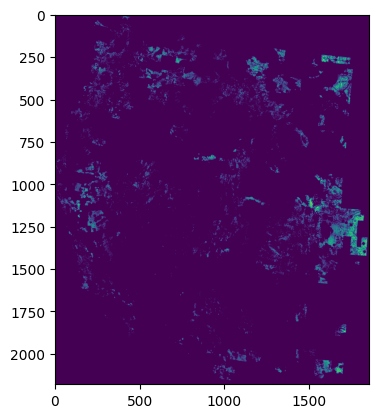

arizona total_generation: 135909712 needed_generation: 27752747 difference: 108156964.80246094
california total_generation: 563113809 needed_generation: 121274529 difference: 441839280.8107129
colorado total_generation: 1364164826 needed_generation: 70774379 difference: 1293390447.2055078
idaho total_generation: 202498532 needed_generation: 12609890 difference: 189888642.38058594
montana total_generation: 1009748931 needed_generation: 131012816 difference: 878736115.4986426
new_mexico total_generation: 283113967 needed_generation: 47690850 difference: 235423117.98046875
nevada total_generation: 89239692 needed_generation: 9780478 difference: 79459214.2877832
oregon total_generation: 253216833 needed_generation: 26721766 difference: 226495066.1700586
utah total_generation: 143095928 needed_generation: 32885691 difference: 110210236.46893555
washington total_generation: 420552732 needed_generation: 24931334 difference: 395621397.9961719
wyoming total_generation: 419615034 needed_generati

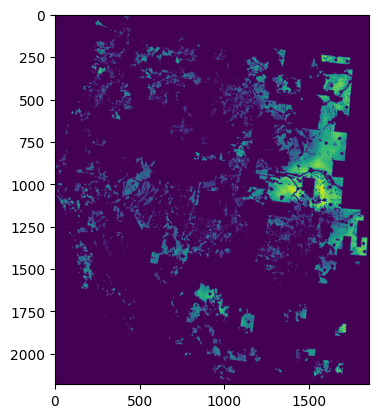

arizona total_generation: 1180444252 needed_generation: 27752747 difference: 1152691504.9313672
california total_generation: 799831261 needed_generation: 121274529 difference: 678556732.0864698
colorado total_generation: 2215035111 needed_generation: 70774379 difference: 2144260732.2089257
idaho total_generation: 487667177 needed_generation: 12609890 difference: 475057287.00705075
montana total_generation: 3078633961 needed_generation: 131012816 difference: 2947621145.009873
new_mexico total_generation: 553288179 needed_generation: 47690850 difference: 505597329.5683594
nevada total_generation: 1237871973 needed_generation: 9780478 difference: 1228091495.2885156
oregon total_generation: 450671733 needed_generation: 26721766 difference: 423949966.4308008
utah total_generation: 467821119 needed_generation: 32885691 difference: 434935427.75140625
washington total_generation: 596801163 needed_generation: 24931334 difference: 571869829.6743945
wyoming total_generation: 5544143999 needed_gen

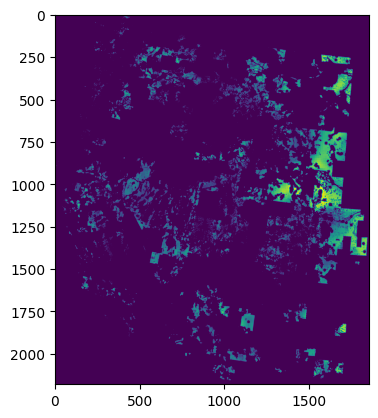

arizona total_generation: 710511573 needed_generation: 27752747 difference: 682758826.2326367
california total_generation: 489140056 needed_generation: 121274529 difference: 367865527.6079541
colorado total_generation: 2079196333 needed_generation: 70774379 difference: 2008421954.2540917
idaho total_generation: 340474474 needed_generation: 12609890 difference: 327864584.0314648
montana total_generation: 1685363073 needed_generation: 131012816 difference: 1554350256.9222267
new_mexico total_generation: 539357540 needed_generation: 47690850 difference: 491666690.7114258
nevada total_generation: 1079825034 needed_generation: 9780478 difference: 1070044555.919375
oregon total_generation: 228851801 needed_generation: 26721766 difference: 202130034.50941408
utah total_generation: 382147558 needed_generation: 32885691 difference: 349261866.4369531
washington total_generation: 394058231 needed_generation: 24931334 difference: 369126897.3311328
wyoming total_generation: 3413754176 needed_genera

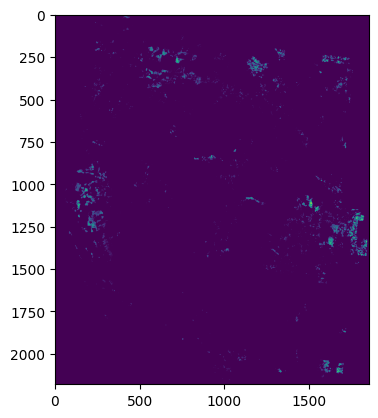

arizona total_generation: 12802333 needed_generation: 27752747 difference: -14950413.990996093
california total_generation: 290367219 needed_generation: 121274529 difference: 169092689.98893553
colorado total_generation: 421068763 needed_generation: 70774379 difference: 350294383.731875
idaho total_generation: 66143259 needed_generation: 12609890 difference: 53533369.13424805
montana total_generation: 239559741 needed_generation: 131012816 difference: 108546925.01890625
new_mexico total_generation: 93806576 needed_generation: 47690850 difference: 46115726.5078125
nevada total_generation: 7725443 needed_generation: 9780478 difference: -2055034.9478124995
oregon total_generation: 36874688 needed_generation: 26721766 difference: 10152921.556289062
utah total_generation: 33605150 needed_generation: 32885691 difference: 719458.7816796862
washington total_generation: 163784398 needed_generation: 24931334 difference: 138853064.85066408
wyoming total_generation: 78596277 needed_generation: 102

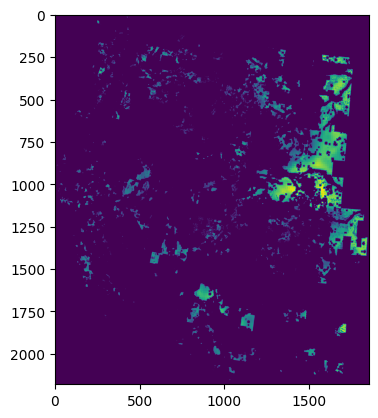

arizona total_generation: 735739881 needed_generation: 27752747 difference: 707987134.6310742
california total_generation: 266865979 needed_generation: 121274529 difference: 145591450.59403807
colorado total_generation: 1497922387 needed_generation: 70774379 difference: 1427148008.1779199
idaho total_generation: 176150830 needed_generation: 12609890 difference: 163540940.4782422
montana total_generation: 2039281931 needed_generation: 131012816 difference: 1908269115.2754982
new_mexico total_generation: 293235003 needed_generation: 47690850 difference: 245544153.98583984
nevada total_generation: 531906720 needed_generation: 9780478 difference: 522126241.98822266
oregon total_generation: 161310384 needed_generation: 26721766 difference: 134588617.8863672
utah total_generation: 191846481 needed_generation: 32885691 difference: 158960789.93451172
washington total_generation: 229261425 needed_generation: 24931334 difference: 204330091.69343752
wyoming total_generation: 3866442657 needed_gen

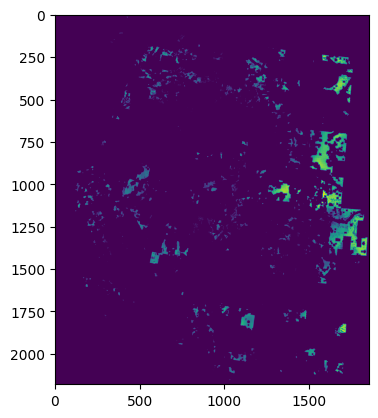

arizona total_generation: 312118026 needed_generation: 27752747 difference: 284365278.88253903
california total_generation: 128403175 needed_generation: 121274529 difference: 7128646.747846678
colorado total_generation: 1376701505 needed_generation: 70774379 difference: 1305927125.6671777
idaho total_generation: 82883141 needed_generation: 12609890 difference: 70273250.81515625
montana total_generation: 823051582 needed_generation: 131012816 difference: 692038766.2764746
new_mexico total_generation: 281325276 needed_generation: 47690850 difference: 233634426.1611328
nevada total_generation: 435607133 needed_generation: 9780478 difference: 425826654.8676172
oregon total_generation: 94598723 needed_generation: 26721766 difference: 67876956.27503906
utah total_generation: 125241199 needed_generation: 32885691 difference: 92355507.28900391
washington total_generation: 165406474 needed_generation: 24931334 difference: 140475140.7613086
wyoming total_generation: 1771014149 needed_generation:

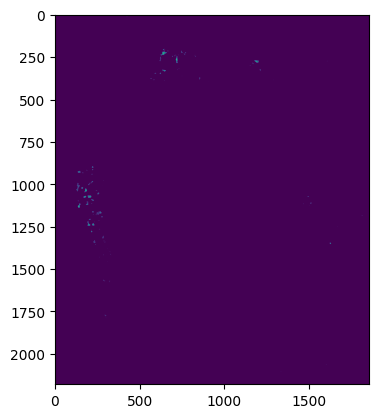

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 57213996 needed_generation: 121274529 difference: -64060532.46614258
colorado total_generation: 1103586 needed_generation: 70774379 difference: -69670793.28179687
idaho total_generation: 912457 needed_generation: 12609890 difference: -11697433.437285157
montana total_generation: 6556793 needed_generation: 131012816 difference: -124456022.86
new_mexico total_generation: 91258 needed_generation: 47690850 difference: -47599591.97167969
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 0 needed_generation: 26721766 difference: -26721766.89
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 25981368 needed_generation: 24931334 difference: 1050034.0723437518
wyoming total_generation: 968448 needed_generation: 102556313 difference: -101587865.22453125
dac_farm_env1_10km


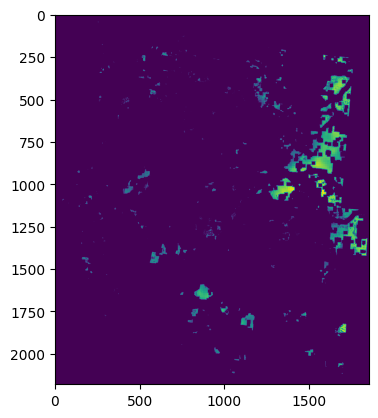

arizona total_generation: 436028752 needed_generation: 27752747 difference: 408276005.0939648
california total_generation: 44511182 needed_generation: 121274529 difference: -76763346.40730469
colorado total_generation: 910299064 needed_generation: 70774379 difference: 839524685.0519433
idaho total_generation: 22684040 needed_generation: 12609890 difference: 10074150.220917968
montana total_generation: 1099519880 needed_generation: 131012816 difference: 968507064.0770117
new_mexico total_generation: 166237903 needed_generation: 47690850 difference: 118547053.83691406
nevada total_generation: 228684310 needed_generation: 9780478 difference: 218903831.3383203
oregon total_generation: 37635500 needed_generation: 26721766 difference: 10913733.975234374
utah total_generation: 49153221 needed_generation: 32885691 difference: 16267529.081972655
washington total_generation: 47241277 needed_generation: 24931334 difference: 22309943.793535158
wyoming total_generation: 2282229137 needed_generation

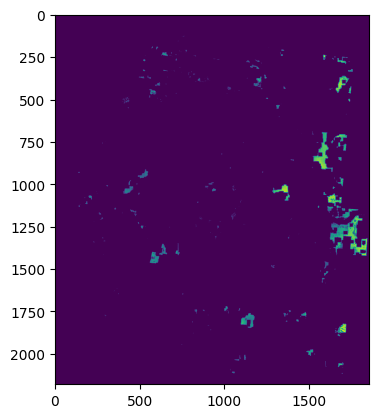

arizona total_generation: 137780992 needed_generation: 27752747 difference: 110028245.5509961
california total_generation: 16703726 needed_generation: 121274529 difference: -104570802.86946289
colorado total_generation: 845115874 needed_generation: 70774379 difference: 774341495.2973046
idaho total_generation: 7723112 needed_generation: 12609890 difference: -4886778.085234376
montana total_generation: 273921622 needed_generation: 131012816 difference: 142908806.5071875
new_mexico total_generation: 163339037 needed_generation: 47690850 difference: 115648187.60742188
nevada total_generation: 183285401 needed_generation: 9780478 difference: 173504923.23089844
oregon total_generation: 29384113 needed_generation: 26721766 difference: 2662346.730117187
utah total_generation: 21223474 needed_generation: 32885691 difference: -11662217.186582033
washington total_generation: 33342189 needed_generation: 24931334 difference: 8410855.18513672
wyoming total_generation: 781385986 needed_generation: 1

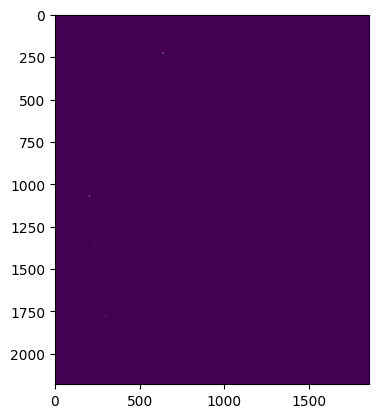

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 2584849 needed_generation: 121274529 difference: -118689680.0684375
colorado total_generation: 0 needed_generation: 70774379 difference: -70774379.44
idaho total_generation: 0 needed_generation: 12609890 difference: -12609890.47
montana total_generation: 0 needed_generation: 131012816 difference: -131012816.11
new_mexico total_generation: 0 needed_generation: 47690850 difference: -47690850.0
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 0 needed_generation: 26721766 difference: -26721766.89
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 1542818 needed_generation: 24931334 difference: -23388515.65128906
wyoming total_generation: 0 needed_generation: 102556313 difference: -102556313.33
Analyzing Wind_120m for 18 MW Power Density...
baseline


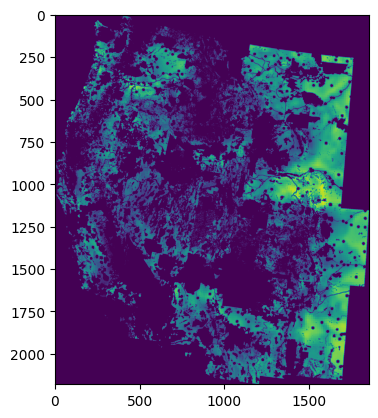

arizona total_generation: 4450743804 needed_generation: 27752747 difference: 4422991056.895722
california total_generation: 3877341938 needed_generation: 121274529 difference: 3756067409.0598583
colorado total_generation: 7885017877 needed_generation: 70774379 difference: 7814243497.644717
idaho total_generation: 2008476410 needed_generation: 12609890 difference: 1995866520.1154492
montana total_generation: 10564447216 needed_generation: 131012816 difference: 10433434399.897812
new_mexico total_generation: 11183869468 needed_generation: 47690850 difference: 11136178618.63916
nevada total_generation: 3450410400 needed_generation: 9780478 difference: 3440629921.4411035
oregon total_generation: 4823971636 needed_generation: 26721766 difference: 4797249869.226577
utah total_generation: 1268295516 needed_generation: 32885691 difference: 1235409824.4500146
washington total_generation: 3431406028 needed_generation: 24931334 difference: 3406474694.169512
wyoming total_generation: 10474249563 n

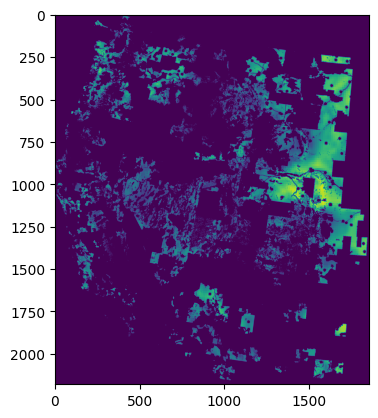

arizona total_generation: 2035603852 needed_generation: 27752747 difference: 2007851105.738496
california total_generation: 1611608406 needed_generation: 121274529 difference: 1490333877.621748
colorado total_generation: 4060973585 needed_generation: 70774379 difference: 3990199205.8649316
idaho total_generation: 940805704 needed_generation: 12609890 difference: 928195814.0933545
montana total_generation: 5893746386 needed_generation: 131012816 difference: 5762733570.400743
new_mexico total_generation: 1180447262 needed_generation: 47690850 difference: 1132756412.9033203
nevada total_generation: 2581884541 needed_generation: 9780478 difference: 2572104062.4569726
oregon total_generation: 1601219539 needed_generation: 26721766 difference: 1574497772.2789452
utah total_generation: 977711788 needed_generation: 32885691 difference: 944826096.3432031
washington total_generation: 1944800596 needed_generation: 24931334 difference: 1919869262.6898975
wyoming total_generation: 9065245768 needed

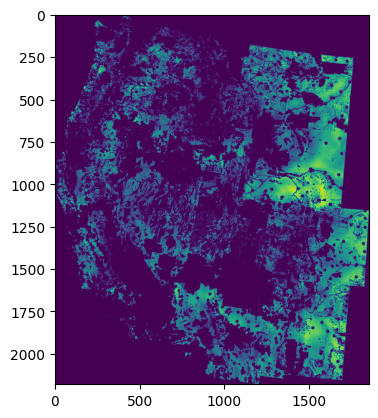

arizona total_generation: 4417266861 needed_generation: 27752747 difference: 4389514114.669892
california total_generation: 3507301194 needed_generation: 121274529 difference: 3386026665.7612743
colorado total_generation: 7167679955 needed_generation: 70774379 difference: 7096905575.975528
idaho total_generation: 1967489729 needed_generation: 12609890 difference: 1954879839.1630566
montana total_generation: 8856612446 needed_generation: 131012816 difference: 8725599630.390854
new_mexico total_generation: 9825090353 needed_generation: 47690850 difference: 9777399503.360596
nevada total_generation: 3449663150 needed_generation: 9780478 difference: 3439882671.902041
oregon total_generation: 3038889278 needed_generation: 26721766 difference: 3012167511.82637
utah total_generation: 1175799063 needed_generation: 32885691 difference: 1142913372.0557275
washington total_generation: 1836020037 needed_generation: 24931334 difference: 1811088703.2038136
wyoming total_generation: 10406851881 neede

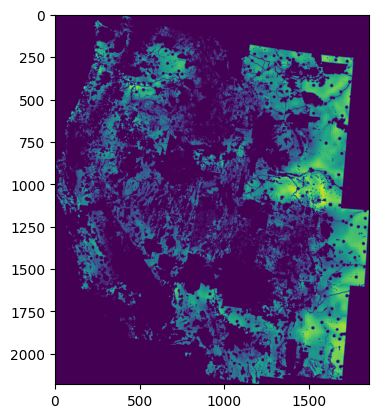

arizona total_generation: 4425525521 needed_generation: 27752747 difference: 4397772774.375703
california total_generation: 3790805409 needed_generation: 121274529 difference: 3669530879.922285
colorado total_generation: 7865247542 needed_generation: 70774379 difference: 7794473162.61481
idaho total_generation: 1973986448 needed_generation: 12609890 difference: 1961376557.643037
montana total_generation: 10520665905 needed_generation: 131012816 difference: 10389653089.431992
new_mexico total_generation: 11151970411 needed_generation: 47690850 difference: 11104279561.36377
nevada total_generation: 3317394199 needed_generation: 9780478 difference: 3307613721.2450585
oregon total_generation: 4805230557 needed_generation: 26721766 difference: 4778508790.571792
utah total_generation: 1267071283 needed_generation: 32885691 difference: 1234185591.8353906
washington total_generation: 3347362419 needed_generation: 24931334 difference: 3322431085.311846
wyoming total_generation: 10404569581 need

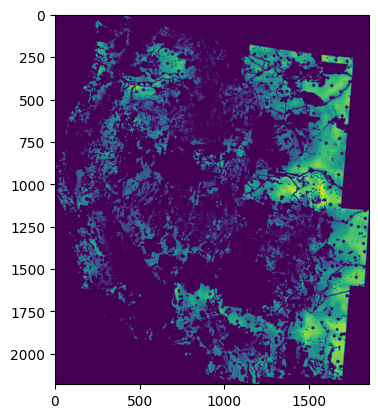

arizona total_generation: 3874155118 needed_generation: 27752747 difference: 3846402370.934297
california total_generation: 3044010440 needed_generation: 121274529 difference: 2922735911.0778027
colorado total_generation: 7202771164 needed_generation: 70774379 difference: 7131996785.554019
idaho total_generation: 1623352816 needed_generation: 12609890 difference: 1610742926.0450146
montana total_generation: 9512458207 needed_generation: 131012816 difference: 9381445391.123398
new_mexico total_generation: 9801931188 needed_generation: 47690850 difference: 9754240338.306885
nevada total_generation: 2496262220 needed_generation: 9780478 difference: 2486481741.6530175
oregon total_generation: 3915582981 needed_generation: 26721766 difference: 3888861214.328811
utah total_generation: 977618183 needed_generation: 32885691 difference: 944732491.7300439
washington total_generation: 2879194218 needed_generation: 24931334 difference: 2854262884.6425343
wyoming total_generation: 9631205688 needed

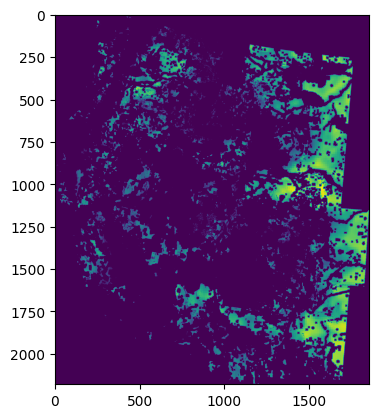

arizona total_generation: 2276644646 needed_generation: 27752747 difference: 2248891899.4277053
california total_generation: 1100302762 needed_generation: 121274529 difference: 979028233.3382398
colorado total_generation: 5120756398 needed_generation: 70774379 difference: 5049982019.242007
idaho total_generation: 644272522 needed_generation: 12609890 difference: 631662631.7370312
montana total_generation: 6162694063 needed_generation: 131012816 difference: 6031681246.965196
new_mexico total_generation: 6254404671 needed_generation: 47690850 difference: 6206713821.104736
nevada total_generation: 1080720676 needed_generation: 9780478 difference: 1070940197.7140527
oregon total_generation: 1693209731 needed_generation: 26721766 difference: 1666487964.5520775
utah total_generation: 393070893 needed_generation: 32885691 difference: 360185201.8275781
washington total_generation: 1400215619 needed_generation: 24931334 difference: 1375284285.8830128
wyoming total_generation: 6594325588 needed_

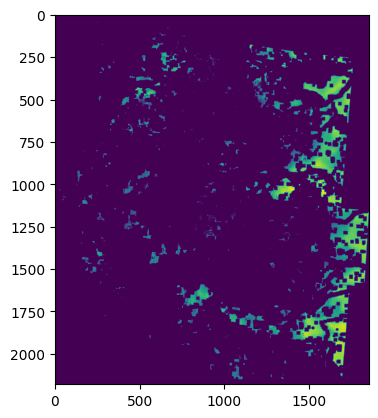

arizona total_generation: 1187009868 needed_generation: 27752747 difference: 1159257121.313203
california total_generation: 254784401 needed_generation: 121274529 difference: 133509872.77836426
colorado total_generation: 3114433678 needed_generation: 70774379 difference: 3043659298.928164
idaho total_generation: 126542526 needed_generation: 12609890 difference: 113932636.14816406
montana total_generation: 3165003877 needed_generation: 131012816 difference: 3033991061.2449803
new_mexico total_generation: 3711215550 needed_generation: 47690850 difference: 3663524700.5617676
nevada total_generation: 457566427 needed_generation: 9780478 difference: 447785948.86786133
oregon total_generation: 565914134 needed_generation: 26721766 difference: 539192367.3556055
utah total_generation: 95701727 needed_generation: 32885691 difference: 62816035.498964846
washington total_generation: 444469859 needed_generation: 24931334 difference: 419538525.10481447
wyoming total_generation: 3722430321 needed_ge

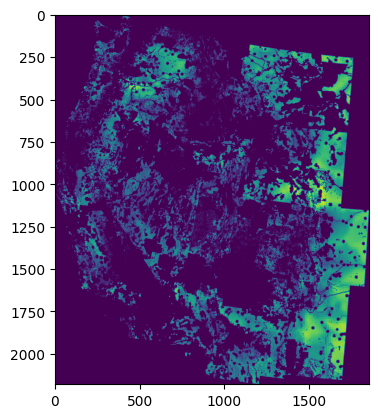

arizona total_generation: 3376292246 needed_generation: 27752747 difference: 3348539499.068086
california total_generation: 3110339014 needed_generation: 121274529 difference: 2989064484.96562
colorado total_generation: 7577702615 needed_generation: 70774379 difference: 7506928236.154971
idaho total_generation: 1539516484 needed_generation: 12609890 difference: 1526906594.4438183
montana total_generation: 6347621264 needed_generation: 131012816 difference: 6216608448.429307
new_mexico total_generation: 10981753602 needed_generation: 47690850 difference: 10934062752.54126
nevada total_generation: 3020299271 needed_generation: 9780478 difference: 3010518792.7431054
oregon total_generation: 3421316384 needed_generation: 26721766 difference: 3394594617.1333156
utah total_generation: 1162844204 needed_generation: 32885691 difference: 1129958512.9618554
washington total_generation: 2888433841 needed_generation: 24931334 difference: 2863502507.336504
wyoming total_generation: 7034107855 neede

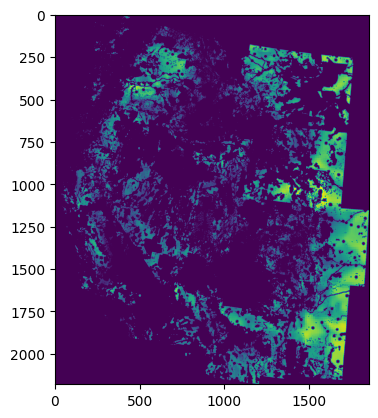

arizona total_generation: 2588313280 needed_generation: 27752747 difference: 2560560533.4491897
california total_generation: 2090009584 needed_generation: 121274529 difference: 1968735055.4372997
colorado total_generation: 6851904707 needed_generation: 70774379 difference: 6781130328.354922
idaho total_generation: 1141386254 needed_generation: 12609890 difference: 1128776364.3388379
montana total_generation: 5292193729 needed_generation: 131012816 difference: 5161180913.246079
new_mexico total_generation: 9502346223 needed_generation: 47690850 difference: 9454655373.900879
nevada total_generation: 2209925638 needed_generation: 9780478 difference: 2200145160.1183496
oregon total_generation: 2396117745 needed_generation: 26721766 difference: 2369395978.8312526
utah total_generation: 770617076 needed_generation: 32885691 difference: 737731384.8201318
washington total_generation: 2208293134 needed_generation: 24931334 difference: 2183361800.6115284
wyoming total_generation: 5971858637 need

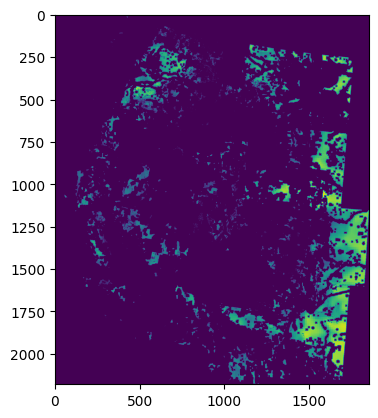

arizona total_generation: 1171347264 needed_generation: 27752747 difference: 1143594516.9689648
california total_generation: 650337764 needed_generation: 121274529 difference: 529063235.0864087
colorado total_generation: 4802933384 needed_generation: 70774379 difference: 4732159004.966739
idaho total_generation: 289773439 needed_generation: 12609890 difference: 277163549.1248486
montana total_generation: 2442442851 needed_generation: 131012816 difference: 2311430035.254746
new_mexico total_generation: 5994885541 needed_generation: 47690850 difference: 5947194691.293457
nevada total_generation: 907893643 needed_generation: 9780478 difference: 898113164.355166
oregon total_generation: 1087824916 needed_generation: 26721766 difference: 1061103149.9447168
utah total_generation: 245174878 needed_generation: 32885691 difference: 212289186.74530274
washington total_generation: 1183829713 needed_generation: 24931334 difference: 1158898379.2489796
wyoming total_generation: 3101636376 needed_gen

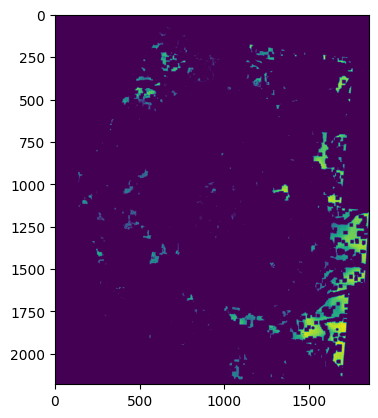

arizona total_generation: 464769711 needed_generation: 27752747 difference: 437016964.6676953
california total_generation: 150333528 needed_generation: 121274529 difference: 29058999.129194334
colorado total_generation: 2903625031 needed_generation: 70774379 difference: 2832850652.5455956
idaho total_generation: 43752503 needed_generation: 12609890 difference: 31142613.219453126
montana total_generation: 738014889 needed_generation: 131012816 difference: 607002073.7220312
new_mexico total_generation: 3620383835 needed_generation: 47690850 difference: 3572692985.0844727
nevada total_generation: 384190322 needed_generation: 9780478 difference: 374409844.0294824
oregon total_generation: 402026820 needed_generation: 26721766 difference: 375305053.82044923
utah total_generation: 40838073 needed_generation: 32885691 difference: 7952381.467226561
washington total_generation: 395097467 needed_generation: 24931334 difference: 370166133.2527637
wyoming total_generation: 1310999720 needed_generat

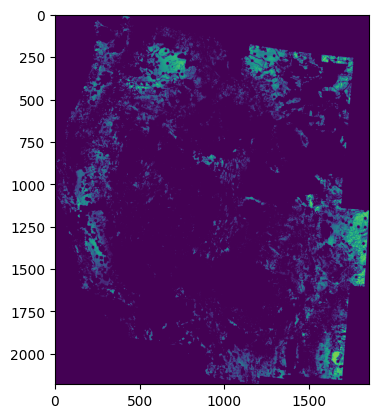

arizona total_generation: 660558287 needed_generation: 27752747 difference: 632805540.5353711
california total_generation: 2287838419 needed_generation: 121274529 difference: 2166563890.3973827
colorado total_generation: 4066311095 needed_generation: 70774379 difference: 3995536716.5050683
idaho total_generation: 665597621 needed_generation: 12609890 difference: 652987730.5514843
montana total_generation: 3411405226 needed_generation: 131012816 difference: 3280392409.91832
new_mexico total_generation: 2819400591 needed_generation: 47690850 difference: 2771709741.0563965
nevada total_generation: 158724172 needed_generation: 9780478 difference: 148943694.09967285
oregon total_generation: 1718110041 needed_generation: 26721766 difference: 1691388274.457351
utah total_generation: 285321121 needed_generation: 32885691 difference: 252435429.13409668
washington total_generation: 2289735724 needed_generation: 24931334 difference: 2264804390.3354053
wyoming total_generation: 681664325 needed_ge

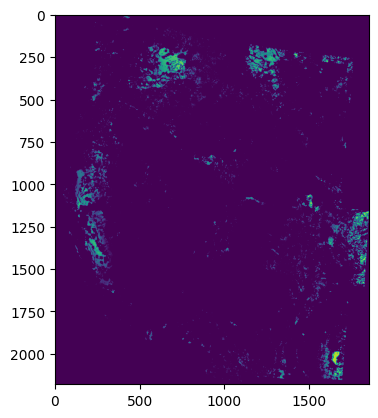

arizona total_generation: 68180970 needed_generation: 27752747 difference: 40428223.14401367
california total_generation: 1293761252 needed_generation: 121274529 difference: 1172486723.550764
colorado total_generation: 1245256579 needed_generation: 70774379 difference: 1174482200.3749413
idaho total_generation: 220152962 needed_generation: 12609890 difference: 207543071.77121094
montana total_generation: 1164136778 needed_generation: 131012816 difference: 1033123962.6537939
new_mexico total_generation: 727422631 needed_generation: 47690850 difference: 679731781.8222656
nevada total_generation: 12306635 needed_generation: 9780478 difference: 2526156.5958886724
oregon total_generation: 263008343 needed_generation: 26721766 difference: 236286576.27101076
utah total_generation: 62529410 needed_generation: 32885691 difference: 29643718.417666014
washington total_generation: 1181668406 needed_generation: 24931334 difference: 1156737072.039629
wyoming total_generation: 138390031 needed_genera

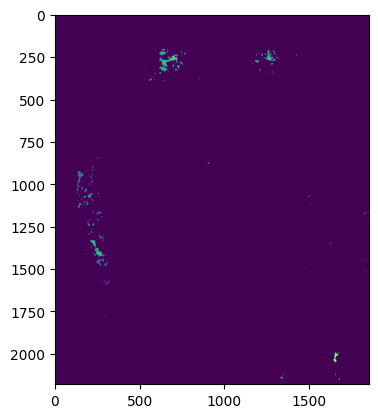

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 324626626 needed_generation: 121274529 difference: 203352097.19779783
colorado total_generation: 7571880 needed_generation: 70774379 difference: -63202498.868710935
idaho total_generation: 4611056 needed_generation: 12609890 difference: -7998833.761503907
montana total_generation: 124631665 needed_generation: 131012816 difference: -6381150.380019531
new_mexico total_generation: 73047457 needed_generation: 47690850 difference: 25356607.274414062
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 472154 needed_generation: 26721766 difference: -26249612.72203125
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 299070154 needed_generation: 24931334 difference: 274138820.131792
wyoming total_generation: 2721061 needed_generation: 102556313 difference: -99835251.9940625
env_3

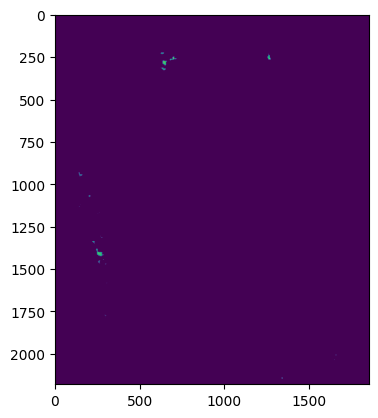

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 60051461 needed_generation: 121274529 difference: -61223067.87129395
colorado total_generation: 0 needed_generation: 70774379 difference: -70774379.44
idaho total_generation: 0 needed_generation: 12609890 difference: -12609890.47
montana total_generation: 17009298 needed_generation: 131012816 difference: -114003517.3936914
new_mexico total_generation: 1944007 needed_generation: 47690850 difference: -45746842.560058594
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 0 needed_generation: 26721766 difference: -26721766.89
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 55855770 needed_generation: 24931334 difference: 30924436.80183594
wyoming total_generation: 0 needed_generation: 102556313 difference: -102556313.33
dac_farm_env1


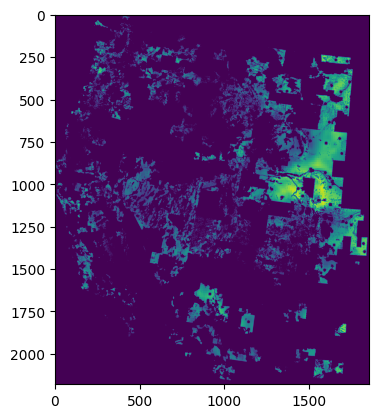

arizona total_generation: 2021275267 needed_generation: 27752747 difference: 1993522519.9123242
california total_generation: 1498649764 needed_generation: 121274529 difference: 1377375234.8784618
colorado total_generation: 3682096788 needed_generation: 70774379 difference: 3611322409.4601464
idaho total_generation: 894049551 needed_generation: 12609890 difference: 881439661.3484814
montana total_generation: 5096758067 needed_generation: 131012816 difference: 4965745251.77794
new_mexico total_generation: 1008463178 needed_generation: 47690850 difference: 960772328.5026855
nevada total_generation: 2495500175 needed_generation: 9780478 difference: 2485719697.1290917
oregon total_generation: 862368498 needed_generation: 26721766 difference: 835646731.8746485
utah total_generation: 900470022 needed_generation: 32885691 difference: 867584330.214541
washington total_generation: 1076306718 needed_generation: 24931334 difference: 1051375384.7992724
wyoming total_generation: 8956455787 needed_ge

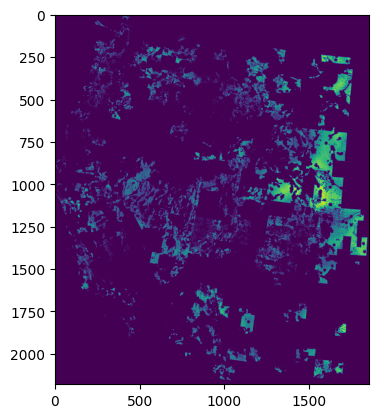

arizona total_generation: 1487831205 needed_generation: 27752747 difference: 1460078458.139619
california total_generation: 1183884521 needed_generation: 121274529 difference: 1062609992.066084
colorado total_generation: 3548589575 needed_generation: 70774379 difference: 3477815196.08063
idaho total_generation: 701093302 needed_generation: 12609890 difference: 688483412.326997
montana total_generation: 3024667406 needed_generation: 131012816 difference: 2893654589.977402
new_mexico total_generation: 998765139 needed_generation: 47690850 difference: 951074289.1113281
nevada total_generation: 2242065585 needed_generation: 9780478 difference: 2232285106.586123
oregon total_generation: 619458833 needed_generation: 26721766 difference: 592737066.8192285
utah total_generation: 839535314 needed_generation: 32885691 difference: 806649622.3312402
washington total_generation: 874436156 needed_generation: 24931334 difference: 849504821.9367236
wyoming total_generation: 6028460106 needed_generatio

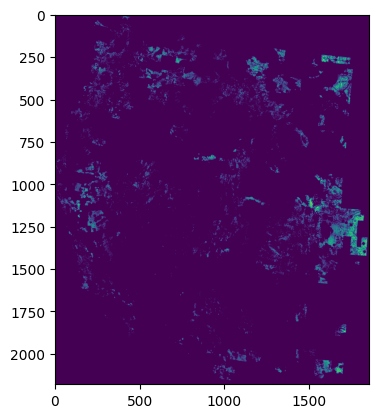

arizona total_generation: 203864568 needed_generation: 27752747 difference: 176111820.8136914
california total_generation: 844670714 needed_generation: 121274529 difference: 723396185.8010694
colorado total_generation: 2046247239 needed_generation: 70774379 difference: 1975472860.5282617
idaho total_generation: 303747799 needed_generation: 12609890 difference: 291137908.8058789
montana total_generation: 1514623397 needed_generation: 131012816 difference: 1383610581.302964
new_mexico total_generation: 424670951 needed_generation: 47690850 difference: 376980101.9707031
nevada total_generation: 133859539 needed_generation: 9780478 difference: 124079060.7766748
oregon total_generation: 379825249 needed_generation: 26721766 difference: 353103482.7000879
utah total_generation: 214643892 needed_generation: 32885691 difference: 181758200.67340332
washington total_generation: 630829098 needed_generation: 24931334 difference: 605897764.0342578
wyoming total_generation: 629422551 needed_generatio

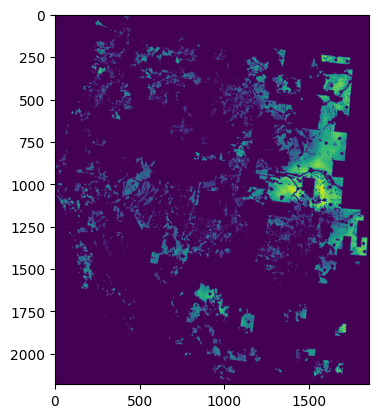

arizona total_generation: 1770666378 needed_generation: 27752747 difference: 1742913631.0070508
california total_generation: 1199746891 needed_generation: 121274529 difference: 1078472362.7147045
colorado total_generation: 3322552667 needed_generation: 70774379 difference: 3251778288.0333886
idaho total_generation: 731500766 needed_generation: 12609890 difference: 718890875.7455761
montana total_generation: 4617950941 needed_generation: 131012816 difference: 4486938125.56981
new_mexico total_generation: 829932269 needed_generation: 47690850 difference: 782241419.3525391
nevada total_generation: 1856807960 needed_generation: 9780478 difference: 1847027482.2777734
oregon total_generation: 676007599 needed_generation: 26721766 difference: 649285833.0912012
utah total_generation: 701731679 needed_generation: 32885691 difference: 668845987.5971093
washington total_generation: 895201745 needed_generation: 24931334 difference: 870270411.5515918
wyoming total_generation: 8316215998 needed_gene

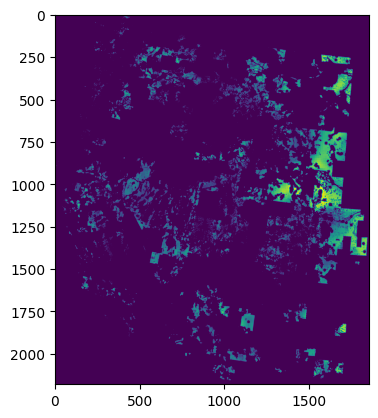

arizona total_generation: 1065767360 needed_generation: 27752747 difference: 1038014612.958955
california total_generation: 733710085 needed_generation: 121274529 difference: 612435555.9969312
colorado total_generation: 3118794500 needed_generation: 70774379 difference: 3048020121.1011376
idaho total_generation: 510711711 needed_generation: 12609890 difference: 498101821.28219724
montana total_generation: 2528044609 needed_generation: 131012816 difference: 2397031793.4383397
new_mexico total_generation: 809036311 needed_generation: 47690850 difference: 761345461.0671387
nevada total_generation: 1619737551 needed_generation: 9780478 difference: 1609957073.2240624
oregon total_generation: 343277702 needed_generation: 26721766 difference: 316555935.2091211
utah total_generation: 573221337 needed_generation: 32885691 difference: 540335645.6254296
washington total_generation: 591087347 needed_generation: 24931334 difference: 566156013.0366992
wyoming total_generation: 5120631265 needed_gene

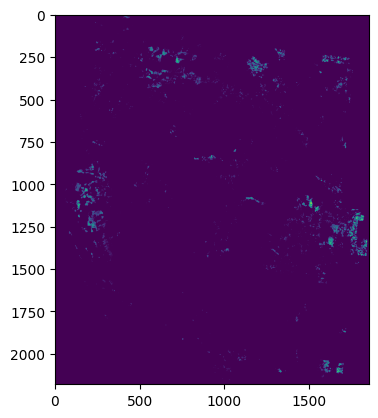

arizona total_generation: 19203499 needed_generation: 27752747 difference: -8549247.37649414
california total_generation: 435550828 needed_generation: 121274529 difference: 314276299.5684033
colorado total_generation: 631603144 needed_generation: 70774379 difference: 560828765.3178124
idaho total_generation: 99214889 needed_generation: 12609890 difference: 86604998.93637207
montana total_generation: 359339611 needed_generation: 131012816 difference: 228326795.58335936
new_mexico total_generation: 140709864 needed_generation: 47690850 difference: 93019014.76171875
nevada total_generation: 11588165 needed_generation: 9780478 difference: 1807686.9232812505
oregon total_generation: 55312032 needed_generation: 26721766 difference: 28590265.779433593
utah total_generation: 50407726 needed_generation: 32885691 difference: 17522034.14251953
washington total_generation: 245676598 needed_generation: 24931334 difference: 220745264.3159961
wyoming total_generation: 117894416 needed_generation: 102

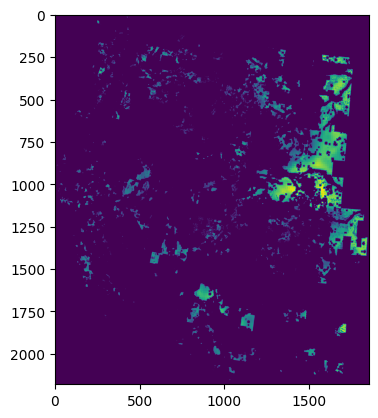

arizona total_generation: 1103609822 needed_generation: 27752747 difference: 1075857075.5566113
california total_generation: 400298969 needed_generation: 121274529 difference: 279024440.4760571
colorado total_generation: 2246883581 needed_generation: 70774379 difference: 2176109201.98688
idaho total_generation: 264226246 needed_generation: 12609890 difference: 251616355.95236328
montana total_generation: 3058922897 needed_generation: 131012816 difference: 2927910080.968247
new_mexico total_generation: 439852505 needed_generation: 47690850 difference: 392161655.97875977
nevada total_generation: 797860081 needed_generation: 9780478 difference: 788079602.3273339
oregon total_generation: 241965577 needed_generation: 26721766 difference: 215243810.2745508
utah total_generation: 287769722 needed_generation: 32885691 difference: 254884030.87176758
washington total_generation: 343892138 needed_generation: 24931334 difference: 318960804.58015627
wyoming total_generation: 5799663986 needed_gener

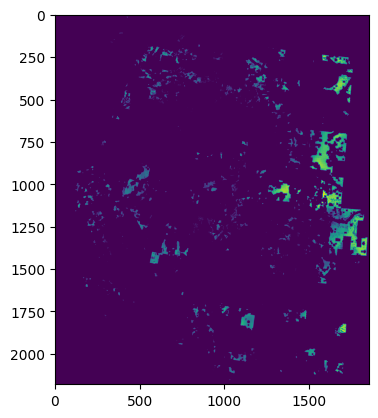

arizona total_generation: 468177039 needed_generation: 27752747 difference: 440424291.93380857
california total_generation: 192604763 needed_generation: 121274529 difference: 71330234.70677002
colorado total_generation: 2065052257 needed_generation: 70774379 difference: 1994277878.2207665
idaho total_generation: 124324711 needed_generation: 12609890 difference: 111714821.45773438
montana total_generation: 1234577373 needed_generation: 131012816 difference: 1103564557.469712
new_mexico total_generation: 421987914 needed_generation: 47690850 difference: 374297064.2416992
nevada total_generation: 653410700 needed_generation: 9780478 difference: 643630221.6464257
oregon total_generation: 141898084 needed_generation: 26721766 difference: 115176317.8575586
utah total_generation: 187861798 needed_generation: 32885691 difference: 154976106.90350586
washington total_generation: 248109712 needed_generation: 24931334 difference: 223178378.1819629
wyoming total_generation: 2656521223 needed_genera

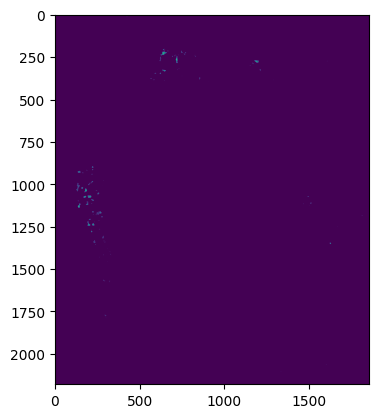

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 85820995 needed_generation: 121274529 difference: -35453534.11421387
colorado total_generation: 1655379 needed_generation: 70774379 difference: -69119000.20269531
idaho total_generation: 1368685 needed_generation: 12609890 difference: -11241204.920927735
montana total_generation: 9835189 needed_generation: 131012816 difference: -121177626.235
new_mexico total_generation: 136887 needed_generation: 47690850 difference: -47553962.95751953
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 0 needed_generation: 26721766 difference: -26721766.89
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 38972052 needed_generation: 24931334 difference: 14040718.148515627
wyoming total_generation: 1452672 needed_generation: 102556313 difference: -101103641.17179687
dac_farm_env1_10km


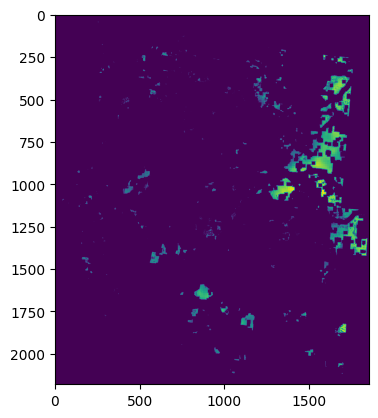

arizona total_generation: 654043128 needed_generation: 27752747 difference: 626290381.2509472
california total_generation: 66766774 needed_generation: 121274529 difference: -54507755.02595703
colorado total_generation: 1365448596 needed_generation: 70774379 difference: 1294674217.297915
idaho total_generation: 34026061 needed_generation: 12609890 difference: 21416170.566376954
montana total_generation: 1649279820 needed_generation: 131012816 difference: 1518267004.1705177
new_mexico total_generation: 249356855 needed_generation: 47690850 difference: 201666005.7553711
nevada total_generation: 343026465 needed_generation: 9780478 difference: 333245986.3524805
oregon total_generation: 56453251 needed_generation: 26721766 difference: 29731484.407851562
utah total_generation: 73729831 needed_generation: 32885691 difference: 40844139.59295899
washington total_generation: 70861916 needed_generation: 24931334 difference: 45930582.730302736
wyoming total_generation: 3423343706 needed_generation

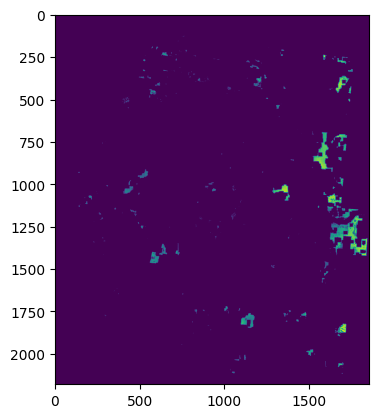

arizona total_generation: 206671489 needed_generation: 27752747 difference: 178918741.93649414
california total_generation: 25055589 needed_generation: 121274529 difference: -96218939.71919434
colorado total_generation: 1267673812 needed_generation: 70774379 difference: 1196899432.665957
idaho total_generation: 11584668 needed_generation: 12609890 difference: -1025221.8928515632
montana total_generation: 410882433 needed_generation: 131012816 difference: 279869617.81578124
new_mexico total_generation: 245008556 needed_generation: 47690850 difference: 197317706.4111328
nevada total_generation: 274928102 needed_generation: 9780478 difference: 265147624.19134766
oregon total_generation: 44076170 needed_generation: 26721766 difference: 17354403.54017578
utah total_generation: 31835212 needed_generation: 32885691 difference: -1050479.8098730482
washington total_generation: 50013283 needed_generation: 24931334 difference: 25081949.81770508
wyoming total_generation: 1172078979 needed_generati

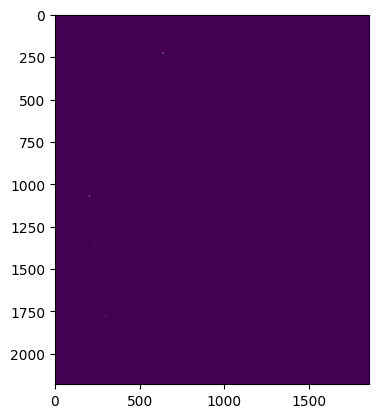

arizona total_generation: 0 needed_generation: 27752747 difference: -27752747.22
california total_generation: 3877273 needed_generation: 121274529 difference: -117397255.51765625
colorado total_generation: 0 needed_generation: 70774379 difference: -70774379.44
idaho total_generation: 0 needed_generation: 12609890 difference: -12609890.47
montana total_generation: 0 needed_generation: 131012816 difference: -131012816.11
new_mexico total_generation: 0 needed_generation: 47690850 difference: -47690850.0
nevada total_generation: 0 needed_generation: 9780478 difference: -9780478.69
oregon total_generation: 0 needed_generation: 26721766 difference: -26721766.89
utah total_generation: 0 needed_generation: 32885691 difference: -32885691.94
washington total_generation: 2314227 needed_generation: 24931334 difference: -22617106.436933592
wyoming total_generation: 0 needed_generation: 102556313 difference: -102556313.33


In [18]:
# open wind potential raster file
wind_array = rasterio.open(wind_120m_potential_path).read(1)
show(wind_array)

net_zero_dict = gcam_wind_dict
exclusion_combos = exclusion_combos_wind_120m

for power_density_mw in [6, 12, 18]:

    wind_array_power = wind_array*power_density_mw
    
    tech_type = f'Wind_120m'
    
    print(f'Analyzing {tech_type} for {power_density_mw} MW Power Density...')

    # for each analysis combination
    for analysis_name in exclusion_combos:
    
        # combine the wind potential raster with the additional exclusions
        exclusion_list = exclusion_combos[analysis_name]
        print(analysis_name)
        
        for exc in exclusion_list:
                
            exclusion_array = rasterio.open(exc).read(1)
            
            exclusion_array = np.where(exclusion_array==1, 1, 0)
            
            if exclusion_list[0] == exc:
                combined_exclusion = exclusion_array
            else:
                combined_exclusion += exclusion_array
    
        combined_exclusion = np.where(combined_exclusion >=1, 0, 1)
            
        final_raster = wind_array_power*combined_exclusion
        show(final_raster)
    
        # loop through each state
        for state in output_dict:
            state_id = state_settings_dict[state]['id_no']
            state_array = np.where(conus_array==state_id, 1, 0)
            state_array = np.where(state_array==0, 0, 1)
            
            state_raster = state_array*final_raster
    
            total_generation = (state_raster).sum()
            target_generation = net_zero_dict[state]['value']
    
            # calculate the amount of land required to meet generation goals
            state_raster_list = state_raster.flatten()
            state_raster_list = [i for i in state_raster_list if i != 0]
            state_raster_list.sort()
            
            total_km = 0
            total_gen = 0
            for i in state_raster_list[::-1]:
                if total_gen < target_generation:
                    if total_km == len(state_raster_list):
                        total_km = len(state_raster_list)
                    else:
                        total_km += 1
                        total_gen += i
                else:
                    pass
            print(state, f'total_generation: {int(total_generation)}', 
                          f'needed_generation: {int(target_generation)}', 
                          f'difference: {total_generation-target_generation}')
            
            output_dict[state][tech_type][power_density_mw][analysis_name]['total_generation'] = total_generation
            output_dict[state][tech_type][power_density_mw][analysis_name]['target_generation'] = target_generation

## Solar Analysis

### Calculate Solar Generation Availability by Scenario 

Analyzing Solar PV for 15 MW Power Density...
baseline


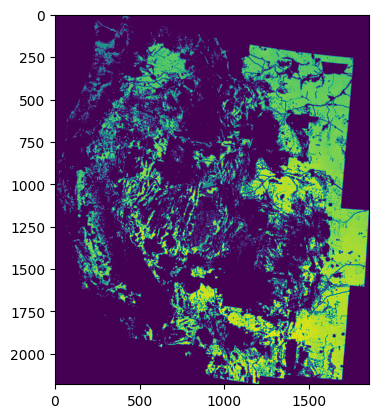

arizona total_generation: 3249800200 needed_generation: 48699201 difference: 3201100998.8324904
california total_generation: 1972581805 needed_generation: 115502531 difference: 1857079274.2009716
colorado total_generation: 4669422781 needed_generation: 49239752 difference: 4620183028.786807
idaho total_generation: 932779503 needed_generation: 1905583 difference: 930873920.3804102
montana total_generation: 5962625299 needed_generation: 16717511 difference: 5945907787.803955
new_mexico total_generation: 6455243242 needed_generation: 24131511 difference: 6431111731.34747
nevada total_generation: 2435790014 needed_generation: 42333837 difference: 2393456176.8710938
oregon total_generation: 1918903219 needed_generation: 8841840 difference: 1910061379.0489063
utah total_generation: 995573910 needed_generation: 116274044 difference: 879299865.8977637
washington total_generation: 1458125324 needed_generation: 6986026 difference: 1451139298.0187206
wyoming total_generation: 5095026061 needed_ge

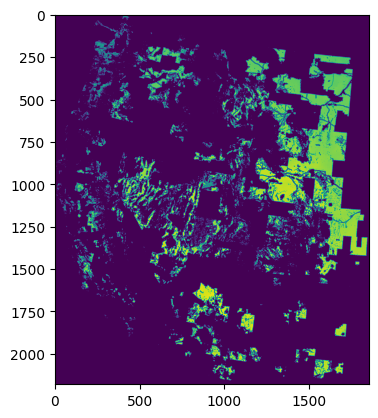

arizona total_generation: 1429191326 needed_generation: 48699201 difference: 1380492125.1874707
california total_generation: 708967082 needed_generation: 115502531 difference: 593464550.6957227
colorado total_generation: 2332644345 needed_generation: 49239752 difference: 2283404592.830996
idaho total_generation: 382410162 needed_generation: 1905583 difference: 380504579.2793359
montana total_generation: 3296613988 needed_generation: 16717511 difference: 3279896477.6660156
new_mexico total_generation: 752875835 needed_generation: 24131511 difference: 728744323.9487891
nevada total_generation: 1817462830 needed_generation: 42333837 difference: 1775128993.6484375
oregon total_generation: 512465278 needed_generation: 8841840 difference: 503623437.5010547
utah total_generation: 765026530 needed_generation: 116274044 difference: 648752486.3933692
washington total_generation: 763662951 needed_generation: 6986026 difference: 756676925.093916
wyoming total_generation: 4426065882 needed_generati

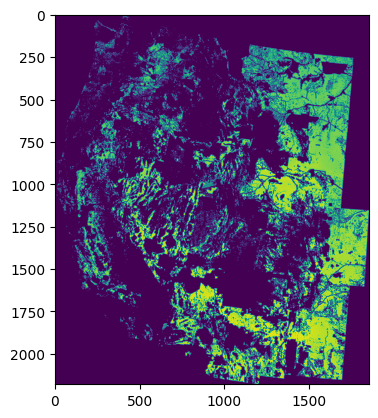

arizona total_generation: 3206059427 needed_generation: 48699201 difference: 3157360226.647432
california total_generation: 1652260389 needed_generation: 115502531 difference: 1536757857.9485302
colorado total_generation: 4217015254 needed_generation: 49239752 difference: 4167775502.115664
idaho total_generation: 907364640 needed_generation: 1905583 difference: 905459057.864541
montana total_generation: 5002105833 needed_generation: 16717511 difference: 4985388322.007446
new_mexico total_generation: 5668729970 needed_generation: 24131511 difference: 5644598459.585996
nevada total_generation: 2434825469 needed_generation: 42333837 difference: 2392491632.3251953
oregon total_generation: 1109877605 needed_generation: 8841840 difference: 1101035765.0486622
utah total_generation: 874332932 needed_generation: 116274044 difference: 758058888.2525
washington total_generation: 740031867 needed_generation: 6986026 difference: 733045840.8654004
wyoming total_generation: 5066255279 needed_generati

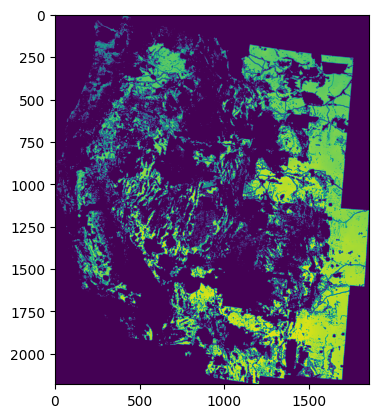

arizona total_generation: 3217227966 needed_generation: 48699201 difference: 3168528765.0788283
california total_generation: 1902666488 needed_generation: 115502531 difference: 1787163956.3903027
colorado total_generation: 4428855804 needed_generation: 49239752 difference: 4379616051.711612
idaho total_generation: 841767776 needed_generation: 1905583 difference: 839862193.7483301
montana total_generation: 5008575663 needed_generation: 16717511 difference: 4991858151.835327
new_mexico total_generation: 6445605028 needed_generation: 24131511 difference: 6421473516.994443
nevada total_generation: 2343333999 needed_generation: 42333837 difference: 2301000162.601074
oregon total_generation: 1769987351 needed_generation: 8841840 difference: 1761145511.2083302
utah total_generation: 790488254 needed_generation: 116274044 difference: 674214210.0847754
washington total_generation: 1404502680 needed_generation: 6986026 difference: 1397516654.2601757
wyoming total_generation: 5045509504 needed_ge

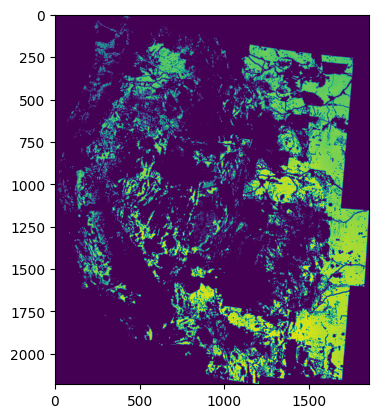

arizona total_generation: 2806485522 needed_generation: 48699201 difference: 2757786321.3080764
california total_generation: 1539953484 needed_generation: 115502531 difference: 1424450952.8331738
colorado total_generation: 4037513732 needed_generation: 49239752 difference: 3988273980.105166
idaho total_generation: 668529523 needed_generation: 1905583 difference: 666623940.2314844
montana total_generation: 4508586286 needed_generation: 16717511 difference: 4491868775.738525
new_mexico total_generation: 5598429522 needed_generation: 24131511 difference: 5574298010.94708
nevada total_generation: 1819667517 needed_generation: 42333837 difference: 1777333680.40625
oregon total_generation: 1434045669 needed_generation: 8841840 difference: 1425203829.0385303
utah total_generation: 595593580 needed_generation: 116274044 difference: 479319535.5291113
washington total_generation: 1214579649 needed_generation: 6986026 difference: 1207593622.3552685
wyoming total_generation: 4650580720 needed_gene

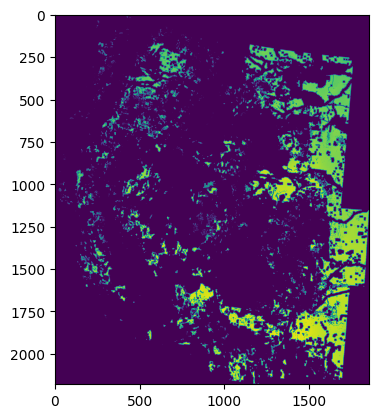

arizona total_generation: 1567460674 needed_generation: 48699201 difference: 1518761472.9438183
california total_generation: 589469742 needed_generation: 115502531 difference: 473967210.8635693
colorado total_generation: 2786688041 needed_generation: 49239752 difference: 2737448288.6525292
idaho total_generation: 245614043 needed_generation: 1905583 difference: 243708460.82413575
montana total_generation: 2784379886 needed_generation: 16717511 difference: 2767662375.071411
new_mexico total_generation: 3370167958 needed_generation: 24131511 difference: 3346036447.155576
nevada total_generation: 733157830 needed_generation: 42333837 difference: 690823993.564209
oregon total_generation: 580490519 needed_generation: 8841840 difference: 571648678.5575732
utah total_generation: 247834766 needed_generation: 116274044 difference: 131560721.70098633
washington total_generation: 607723975 needed_generation: 6986026 difference: 600737948.5564405
wyoming total_generation: 3103453329 needed_generat

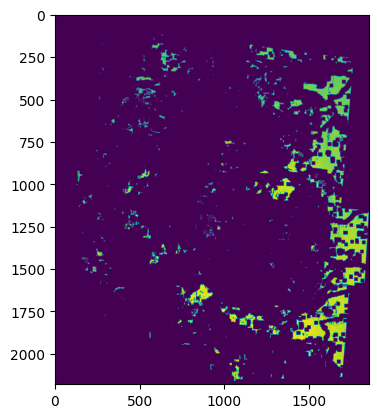

arizona total_generation: 763114036 needed_generation: 48699201 difference: 714414835.0251172
california total_generation: 138117652 needed_generation: 115502531 difference: 22615120.800703123
colorado total_generation: 1623115615 needed_generation: 49239752 difference: 1573875862.9530663
idaho total_generation: 50840426 needed_generation: 1905583 difference: 48934843.17887207
montana total_generation: 1361852995 needed_generation: 16717511 difference: 1345135484.5880127
new_mexico total_generation: 1880898250 needed_generation: 24131511 difference: 1856766739.3247657
nevada total_generation: 276362216 needed_generation: 42333837 difference: 234028379.4650879
oregon total_generation: 166482836 needed_generation: 8841840 difference: 157640996.16438475
utah total_generation: 65558935 needed_generation: 116274044 difference: -50715108.77142578
washington total_generation: 210230470 needed_generation: 6986026 difference: 203244444.0306836
wyoming total_generation: 1704893692 needed_generat

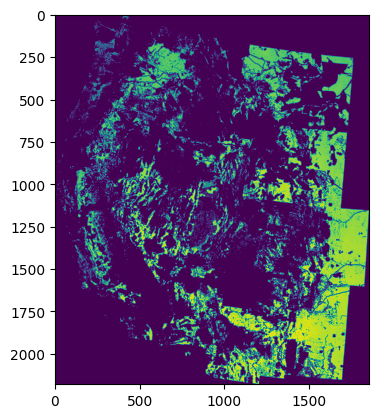

arizona total_generation: 2553681497 needed_generation: 48699201 difference: 2504982295.98459
california total_generation: 1653047937 needed_generation: 115502531 difference: 1537545406.0411816
colorado total_generation: 4277751869 needed_generation: 49239752 difference: 4228512117.5160546
idaho total_generation: 841051016 needed_generation: 1905583 difference: 839145433.2319727
montana total_generation: 3176651732 needed_generation: 16717511 difference: 3159934221.663208
new_mexico total_generation: 6365258629 needed_generation: 24131511 difference: 6341127118.296933
nevada total_generation: 2161831105 needed_generation: 42333837 difference: 2119497267.7548828
oregon total_generation: 1263874143 needed_generation: 8841840 difference: 1255032302.8825245
utah total_generation: 734487262 needed_generation: 116274044 difference: 618213217.8630958
washington total_generation: 1304173780 needed_generation: 6986026 difference: 1297187754.1753368
wyoming total_generation: 3483096840 needed_ge

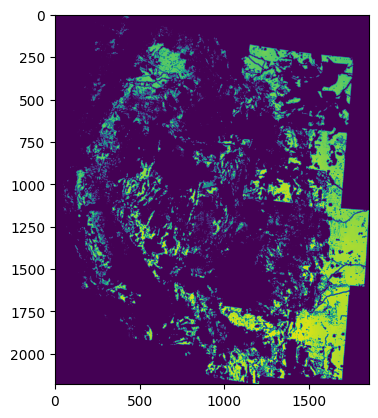

arizona total_generation: 1937046900 needed_generation: 48699201 difference: 1888347699.2450879
california total_generation: 1173701326 needed_generation: 115502531 difference: 1058198794.3773633
colorado total_generation: 3866702768 needed_generation: 49239752 difference: 3817463016.532168
idaho total_generation: 609850812 needed_generation: 1905583 difference: 607945229.1493311
montana total_generation: 2593496896 needed_generation: 16717511 difference: 2576779384.9658203
new_mexico total_generation: 5448382942 needed_generation: 24131511 difference: 5424251431.39874
nevada total_generation: 1628545502 needed_generation: 42333837 difference: 1586211664.7714844
oregon total_generation: 907471474 needed_generation: 8841840 difference: 898629634.3528613
utah total_generation: 479839946 needed_generation: 116274044 difference: 363565901.9646582
washington total_generation: 1056758194 needed_generation: 6986026 difference: 1049772168.1127149
wyoming total_generation: 2937064346 needed_gen

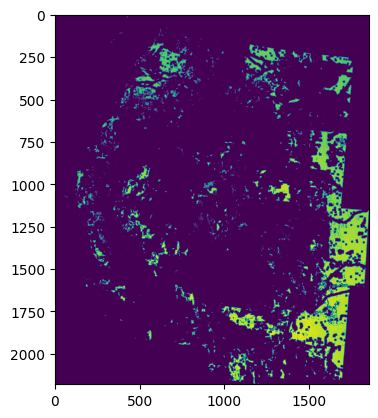

arizona total_generation: 850947351 needed_generation: 48699201 difference: 802248150.4047558
california total_generation: 385189360 needed_generation: 115502531 difference: 269686829.25041014
colorado total_generation: 2623751492 needed_generation: 49239752 difference: 2574511740.376162
idaho total_generation: 127290065 needed_generation: 1905583 difference: 125384482.35245605
montana total_generation: 1105541099 needed_generation: 16717511 difference: 1088823588.0303955
new_mexico total_generation: 3221869574 needed_generation: 24131511 difference: 3197738062.82208
nevada total_generation: 617123904 needed_generation: 42333837 difference: 574790067.6816406
oregon total_generation: 353910709 needed_generation: 8841840 difference: 345068868.5655078
utah total_generation: 153719450 needed_generation: 116274044 difference: 37445406.083310544
washington total_generation: 563355043 needed_generation: 6986026 difference: 556369016.823042
wyoming total_generation: 1478209769 needed_generatio

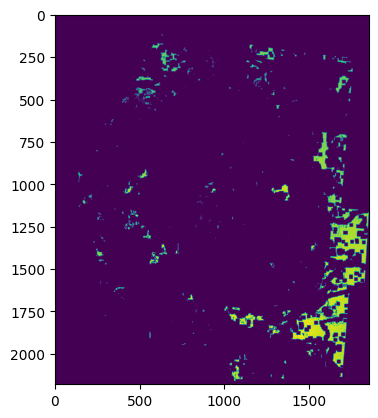

arizona total_generation: 330470915 needed_generation: 48699201 difference: 281771713.81540036
california total_generation: 87329821 needed_generation: 115502531 difference: -28172709.7547168
colorado total_generation: 1516240581 needed_generation: 49239752 difference: 1467000828.8441796
idaho total_generation: 11458004 needed_generation: 1905583 difference: 9552421.125039063
montana total_generation: 312095872 needed_generation: 16717511 difference: 295378360.8673096
new_mexico total_generation: 1824067216 needed_generation: 24131511 difference: 1799935705.528379
nevada total_generation: 231407019 needed_generation: 42333837 difference: 189073182.4765625
oregon total_generation: 99998456 needed_generation: 8841840 difference: 91156615.71211426
utah total_generation: 29174469 needed_generation: 116274044 difference: -87099575.10077149
washington total_generation: 202218680 needed_generation: 6986026 difference: 195232653.8378125
wyoming total_generation: 602716902 needed_generation: 21

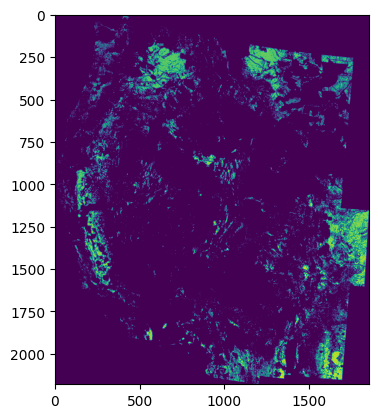

arizona total_generation: 530755493 needed_generation: 48699201 difference: 482056292.59835935
california total_generation: 1278114153 needed_generation: 115502531 difference: 1162611621.7595654
colorado total_generation: 2181338273 needed_generation: 49239752 difference: 2132098520.869326
idaho total_generation: 342423887 needed_generation: 1905583 difference: 340518304.2103662
montana total_generation: 1726237183 needed_generation: 16717511 difference: 1709519672.715454
new_mexico total_generation: 1640680086 needed_generation: 24131511 difference: 1616548575.0693946
nevada total_generation: 141701358 needed_generation: 42333837 difference: 99367521.60986328
oregon total_generation: 633788858 needed_generation: 8841840 difference: 624947018.1834277
utah total_generation: 192778430 needed_generation: 116274044 difference: 76504385.61456054
washington total_generation: 1088619274 needed_generation: 6986026 difference: 1081633248.1328564
wyoming total_generation: 234860057 needed_genera

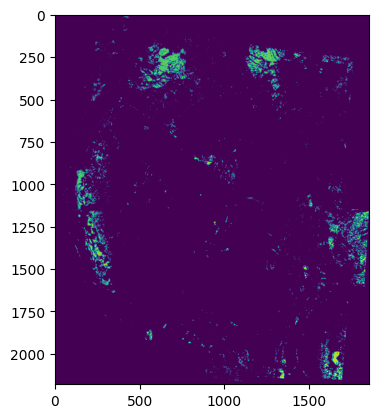

arizona total_generation: 62643349 needed_generation: 48699201 difference: 13944148.288056642
california total_generation: 776850425 needed_generation: 115502531 difference: 661347893.9366895
colorado total_generation: 650810883 needed_generation: 49239752 difference: 601571130.5812402
idaho total_generation: 109938371 needed_generation: 1905583 difference: 108032788.61832519
montana total_generation: 625158972 needed_generation: 16717511 difference: 608441461.2615967
new_mexico total_generation: 422174576 needed_generation: 24131511 difference: 398043065.3208594
nevada total_generation: 13033951 needed_generation: 42333837 difference: -29299885.327392578
oregon total_generation: 124600915 needed_generation: 8841840 difference: 115759075.34590332
utah total_generation: 36462886 needed_generation: 116274044 difference: -79811157.88275391
washington total_generation: 630090009 needed_generation: 6986026 difference: 623103983.1316358
wyoming total_generation: 41310628 needed_generation: 2

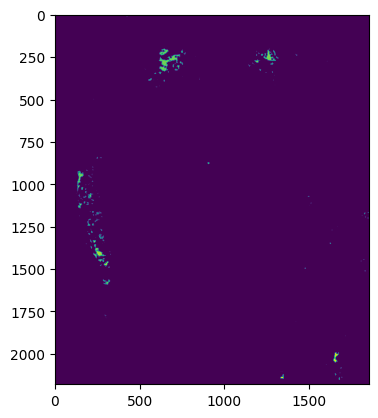

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 194304736 needed_generation: 115502531 difference: 78802204.82780273
colorado total_generation: 4294596 needed_generation: 49239752 difference: -44945156.28765625
idaho total_generation: 2290435 needed_generation: 1905583 difference: 384852.39334960934
montana total_generation: 71900816 needed_generation: 16717511 difference: 55183304.89929199
new_mexico total_generation: 39065158 needed_generation: 24131511 difference: 14933647.595029298
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 389416 needed_generation: 8841840 difference: -8452424.46305664
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 159533838 needed_generation: 6986026 difference: 152547812.29972658
wyoming total_generation: 805064 needed_generation: 21468980 difference: -20663916.532851562
env_3_10

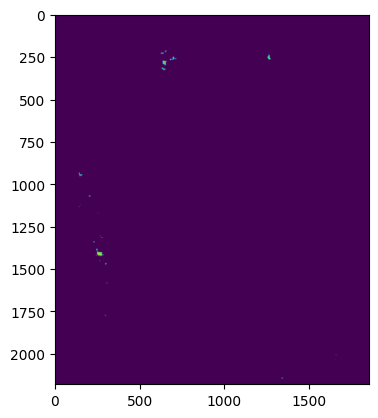

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 33757748 needed_generation: 115502531 difference: -81744783.03108399
colorado total_generation: 0 needed_generation: 49239752 difference: -49239752.44
idaho total_generation: 0 needed_generation: 1905583 difference: -1905583.04
montana total_generation: 9116912 needed_generation: 16717511 difference: -7600599.2138671875
new_mexico total_generation: 1054996 needed_generation: 24131511 difference: -23076515.200380858
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 0 needed_generation: 8841840 difference: -8841840.58
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 28645548 needed_generation: 6986026 difference: 21659521.642377928
wyoming total_generation: 0 needed_generation: 21468980 difference: -21468980.61
dac_farm_env1


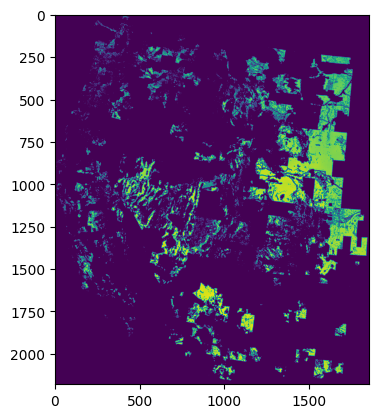

arizona total_generation: 1413829421 needed_generation: 48699201 difference: 1365130220.1178906
california total_generation: 621249580 needed_generation: 115502531 difference: 505747048.74870116
colorado total_generation: 2016149322 needed_generation: 49239752 difference: 1966909569.8720117
idaho total_generation: 352418397 needed_generation: 1905583 difference: 350512814.3727197
montana total_generation: 2283683590 needed_generation: 16717511 difference: 2266966079.598999
new_mexico total_generation: 641455137 needed_generation: 24131511 difference: 617323625.8958106
nevada total_generation: 1741868961 needed_generation: 42333837 difference: 1699535123.7961426
oregon total_generation: 249679277 needed_generation: 8841840 difference: 240837437.32405272
utah total_generation: 529677091 needed_generation: 116274044 difference: 413403046.44341797
washington total_generation: 382749483 needed_generation: 6986026 difference: 375763456.6826611
wyoming total_generation: 4361991699 needed_gene

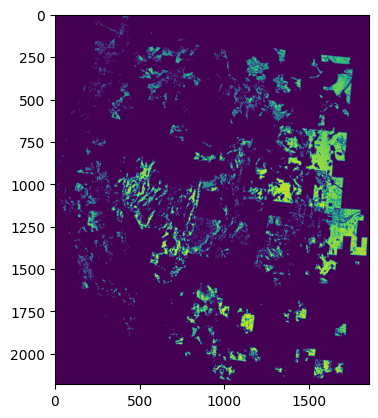

arizona total_generation: 1077130767 needed_generation: 48699201 difference: 1028431566.5351269
california total_generation: 524394849 needed_generation: 115502531 difference: 408892318.0034619
colorado total_generation: 1958230055 needed_generation: 49239752 difference: 1908990302.6137109
idaho total_generation: 352251243 needed_generation: 1905583 difference: 350345660.1588525
montana total_generation: 1389325884 needed_generation: 16717511 difference: 1372608373.0975342
new_mexico total_generation: 636834508 needed_generation: 24131511 difference: 612702997.3972754
nevada total_generation: 1592978715 needed_generation: 42333837 difference: 1550644877.9550781
oregon total_generation: 218013114 needed_generation: 8841840 difference: 209171274.0092334
utah total_generation: 495283628 needed_generation: 116274044 difference: 379009583.58086914
washington total_generation: 345856149 needed_generation: 6986026 difference: 338870122.3332959
wyoming total_generation: 2987466734 needed_gener

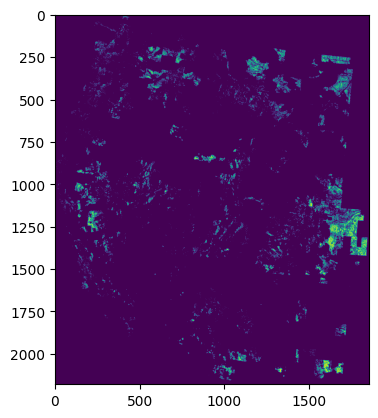

arizona total_generation: 161841402 needed_generation: 48699201 difference: 113142201.50583008
california total_generation: 410500451 needed_generation: 115502531 difference: 294997920.0395947
colorado total_generation: 1075447480 needed_generation: 49239752 difference: 1026207727.7626367
idaho total_generation: 158805745 needed_generation: 1905583 difference: 156900162.69547364
montana total_generation: 681206678 needed_generation: 16717511 difference: 664489167.3834229
new_mexico total_generation: 265992423 needed_generation: 24131511 difference: 241860911.71490234
nevada total_generation: 116997155 needed_generation: 42333837 difference: 74663318.49951172
oregon total_generation: 127351511 needed_generation: 8841840 difference: 118509671.29805176
utah total_generation: 125761842 needed_generation: 116274044 difference: 9487798.239072263
washington total_generation: 273188122 needed_generation: 6986026 difference: 266202095.53703126
wyoming total_generation: 219923327 needed_generati

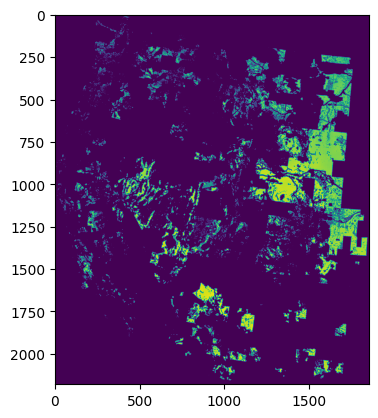

arizona total_generation: 1242890995 needed_generation: 48699201 difference: 1194191794.2536328
california total_generation: 496403155 needed_generation: 115502531 difference: 380900624.1863232
colorado total_generation: 1833605117 needed_generation: 49239752 difference: 1784365365.1198144
idaho total_generation: 271242986 needed_generation: 1905583 difference: 269337403.30338377
montana total_generation: 2054695084 needed_generation: 16717511 difference: 2037977573.6096191
new_mexico total_generation: 527066881 needed_generation: 24131511 difference: 502935370.4075293
nevada total_generation: 1332827758 needed_generation: 42333837 difference: 1290493921.4206543
oregon total_generation: 202091500 needed_generation: 8841840 difference: 193249660.3788623
utah total_generation: 404908222 needed_generation: 116274044 difference: 288634177.6250586
washington total_generation: 318643992 needed_generation: 6986026 difference: 311657966.24625975
wyoming total_generation: 4025181180 needed_gene

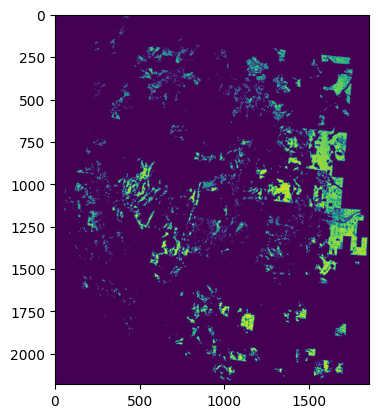

arizona total_generation: 797267711 needed_generation: 48699201 difference: 748568510.5939648
california total_generation: 356266815 needed_generation: 115502531 difference: 240764283.54240233
colorado total_generation: 1748017501 needed_generation: 49239752 difference: 1698777749.369082
idaho total_generation: 245669939 needed_generation: 1905583 difference: 243764356.32279298
montana total_generation: 1129909952 needed_generation: 16717511 difference: 1113192440.9381104
new_mexico total_generation: 514619310 needed_generation: 24131511 difference: 490487799.60186523
nevada total_generation: 1184183834 needed_generation: 42333837 difference: 1141849996.915039
oregon total_generation: 148393748 needed_generation: 8841840 difference: 139551908.07722655
utah total_generation: 327114467 needed_generation: 116274044 difference: 210840422.61895508
washington total_generation: 258123435 needed_generation: 6986026 difference: 251137408.37028322
wyoming total_generation: 2516147618 needed_gene

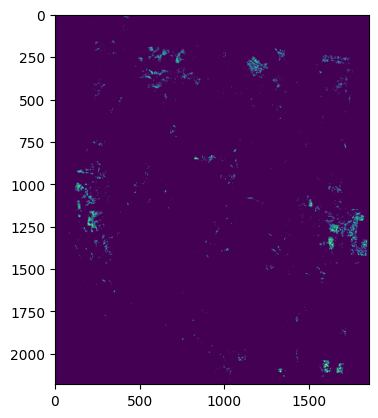

arizona total_generation: 16570051 needed_generation: 48699201 difference: -32129149.28640625
california total_generation: 245883833 needed_generation: 115502531 difference: 130381302.01469238
colorado total_generation: 329271457 needed_generation: 49239752 difference: 280031705.2247949
idaho total_generation: 53236663 needed_generation: 1905583 difference: 51331080.03373047
montana total_generation: 168092173 needed_generation: 16717511 difference: 151374662.50671387
new_mexico total_generation: 92201776 needed_generation: 24131511 difference: 68070265.1365332
nevada total_generation: 11533917 needed_generation: 42333837 difference: -30799919.87939453
oregon total_generation: 33429710 needed_generation: 8841840 difference: 24587869.519487306
utah total_generation: 21894441 needed_generation: 116274044 difference: -94379602.69720703
washington total_generation: 137686304 needed_generation: 6986026 difference: 130700277.56828125
wyoming total_generation: 37378431 needed_generation: 2146

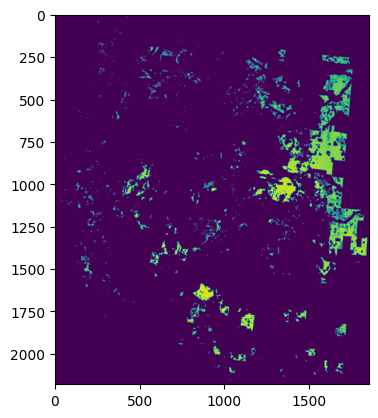

arizona total_generation: 753563180 needed_generation: 48699201 difference: 704863979.437959
california total_generation: 164865664 needed_generation: 115502531 difference: 49363132.39677246
colorado total_generation: 1245215063 needed_generation: 49239752 difference: 1195975311.3124413
idaho total_generation: 80253190 needed_generation: 1905583 difference: 78347607.25235839
montana total_generation: 1297608018 needed_generation: 16717511 difference: 1280890506.760254
new_mexico total_generation: 268541471 needed_generation: 24131511 difference: 244409960.08648437
nevada total_generation: 541962426 needed_generation: 42333837 difference: 499628589.13671875
oregon total_generation: 66541151 needed_generation: 8841840 difference: 57699310.91169922
utah total_generation: 173631904 needed_generation: 116274044 difference: 57357860.21539062
washington total_generation: 125713625 needed_generation: 6986026 difference: 118727598.42033203
wyoming total_generation: 2729409891 needed_generation:

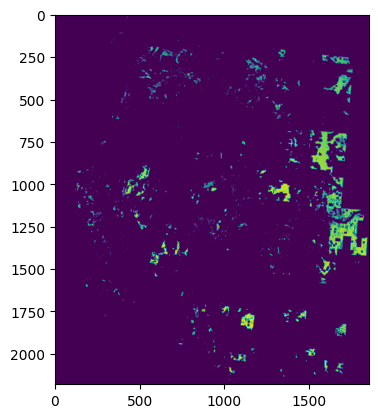

arizona total_generation: 348035099 needed_generation: 48699201 difference: 299335897.83883786
california total_generation: 95187935 needed_generation: 115502531 difference: -20314596.475297853
colorado total_generation: 1156799293 needed_generation: 49239752 difference: 1107559541.4137597
idaho total_generation: 49813118 needed_generation: 1905583 difference: 47907535.59342285
montana total_generation: 507912275 needed_generation: 16717511 difference: 491194764.5196533
new_mexico total_generation: 256484790 needed_generation: 24131511 difference: 232353279.25030273
nevada total_generation: 446128342 needed_generation: 42333837 difference: 403794505.1730957
oregon total_generation: 48047720 needed_generation: 8841840 difference: 39205879.63118164
utah total_generation: 110399345 needed_generation: 116274044 difference: -5874699.381777346
washington total_generation: 110139857 needed_generation: 6986026 difference: 103153830.43205078
wyoming total_generation: 1271336785 needed_generatio

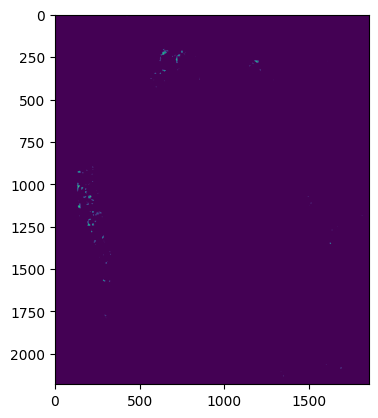

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 49522607 needed_generation: 115502531 difference: -65979924.1687793
colorado total_generation: 1038353 needed_generation: 49239752 difference: -48201399.37969726
idaho total_generation: 193818 needed_generation: 1905583 difference: -1711764.425498047
montana total_generation: 5163819 needed_generation: 16717511 difference: -11553691.946411133
new_mexico total_generation: 700841 needed_generation: 24131511 difference: -23430669.433779296
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 153023 needed_generation: 8841840 difference: -8688816.812910156
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 23355051 needed_generation: 6986026 difference: 16369024.962080078
wyoming total_generation: 406566 needed_generation: 21468980 difference: -21062414.57484375
dac_farm_en

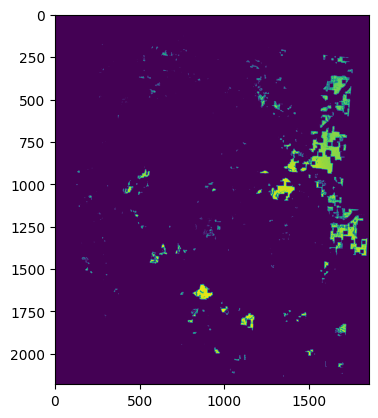

arizona total_generation: 424963119 needed_generation: 48699201 difference: 376263918.590791
california total_generation: 29334625 needed_generation: 115502531 difference: -86167906.15242188
colorado total_generation: 732271463 needed_generation: 49239752 difference: 683031711.1037011
idaho total_generation: 8774871 needed_generation: 1905583 difference: 6869288.665322266
montana total_generation: 673893663 needed_generation: 16717511 difference: 657176152.4450684
new_mexico total_generation: 132378505 needed_generation: 24131511 difference: 108246994.17095703
nevada total_generation: 209681641 needed_generation: 42333837 difference: 167347804.1965332
oregon total_generation: 13554331 needed_generation: 8841840 difference: 4712491.214433594
utah total_generation: 48088742 needed_generation: 116274044 difference: -68185302.31146485
washington total_generation: 27894526 needed_generation: 6986026 difference: 20908500.005415037
wyoming total_generation: 1564297451 needed_generation: 21468

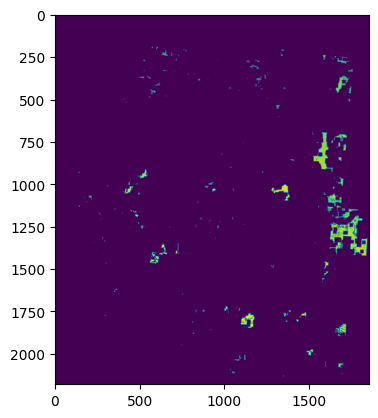

arizona total_generation: 144768664 needed_generation: 48699201 difference: 96069462.8046582
california total_generation: 12469261 needed_generation: 115502531 difference: -103033270.60066406
colorado total_generation: 680084722 needed_generation: 49239752 difference: 630844970.0197167
idaho total_generation: 3685528 needed_generation: 1905583 difference: 1779945.9053125
montana total_generation: 156698956 needed_generation: 16717511 difference: 139981445.41625977
new_mexico total_generation: 128668829 needed_generation: 24131511 difference: 104537318.0674414
nevada total_generation: 167945469 needed_generation: 42333837 difference: 125611631.91992188
oregon total_generation: 11506613 needed_generation: 8841840 difference: 2664773.227373047
utah total_generation: 22149006 needed_generation: 116274044 difference: -94125038.55414063
washington total_generation: 26234240 needed_generation: 6986026 difference: 19248213.962324217
wyoming total_generation: 541028197 needed_generation: 214689

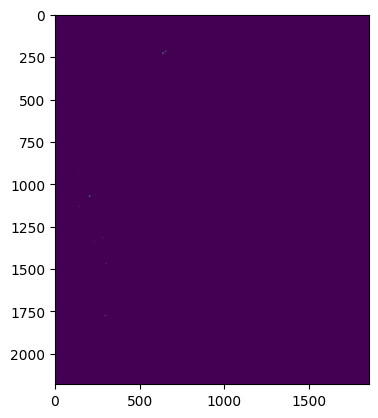

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 2374375 needed_generation: 115502531 difference: -113128156.66145508
colorado total_generation: 0 needed_generation: 49239752 difference: -49239752.44
idaho total_generation: 0 needed_generation: 1905583 difference: -1905583.04
montana total_generation: 0 needed_generation: 16717511 difference: -16717511.25
new_mexico total_generation: 0 needed_generation: 24131511 difference: -24131511.31
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 0 needed_generation: 8841840 difference: -8841840.58
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 1715654 needed_generation: 6986026 difference: -5270371.933671875
wyoming total_generation: 0 needed_generation: 21468980 difference: -21468980.61
Analyzing Solar PV for 30 MW Power Density...
baseline


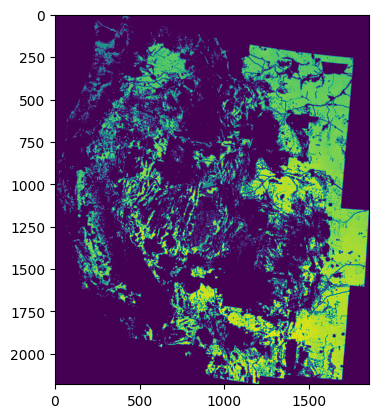

arizona total_generation: 6499600400 needed_generation: 48699201 difference: 6450901198.88498
california total_generation: 3945163611 needed_generation: 115502531 difference: 3829661080.0719433
colorado total_generation: 9338845562 needed_generation: 49239752 difference: 9289605810.013613
idaho total_generation: 1865559006 needed_generation: 1905583 difference: 1863653423.8008204
montana total_generation: 11925250598 needed_generation: 16717511 difference: 11908533086.85791
new_mexico total_generation: 12910486485 needed_generation: 24131511 difference: 12886354974.004942
nevada total_generation: 4871580028 needed_generation: 42333837 difference: 4829246190.9921875
oregon total_generation: 3837806439 needed_generation: 8841840 difference: 3828964598.6778126
utah total_generation: 1991147820 needed_generation: 116274044 difference: 1874873776.3555274
washington total_generation: 2916250649 needed_generation: 6986026 difference: 2909264622.7074413
wyoming total_generation: 10190052122 ne

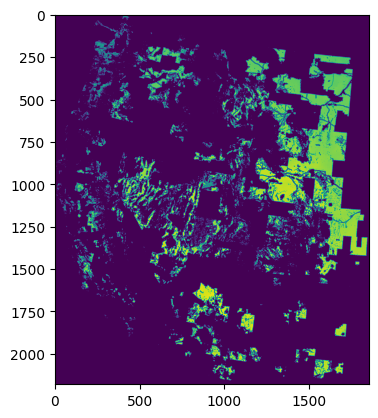

arizona total_generation: 2858382652 needed_generation: 48699201 difference: 2809683451.5949416
california total_generation: 1417934164 needed_generation: 115502531 difference: 1302431633.0614452
colorado total_generation: 4665288690 needed_generation: 49239752 difference: 4616048938.101993
idaho total_generation: 764820324 needed_generation: 1905583 difference: 762914741.5986719
montana total_generation: 6593227977 needed_generation: 16717511 difference: 6576510466.582031
new_mexico total_generation: 1505751670 needed_generation: 24131511 difference: 1481620159.2075782
nevada total_generation: 3634925661 needed_generation: 42333837 difference: 3592591824.546875
oregon total_generation: 1024930556 needed_generation: 8841840 difference: 1016088715.5821093
utah total_generation: 1530053061 needed_generation: 116274044 difference: 1413779017.3467383
washington total_generation: 1527325903 needed_generation: 6986026 difference: 1520339876.857832
wyoming total_generation: 8852131764 needed_

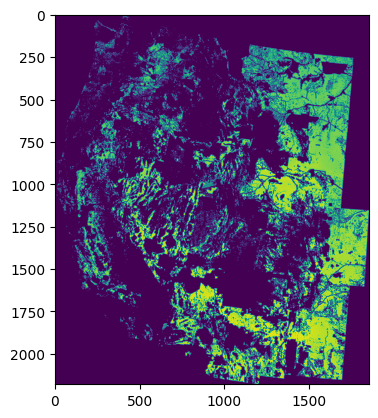

arizona total_generation: 6412118855 needed_generation: 48699201 difference: 6363419654.514863
california total_generation: 3304520779 needed_generation: 115502531 difference: 3189018247.5670605
colorado total_generation: 8434030509 needed_generation: 49239752 difference: 8384790756.671329
idaho total_generation: 1814729281 needed_generation: 1905583 difference: 1812823698.769082
montana total_generation: 10004211666 needed_generation: 16717511 difference: 9987494155.264893
new_mexico total_generation: 11337459941 needed_generation: 24131511 difference: 11313328430.481993
nevada total_generation: 4869650939 needed_generation: 42333837 difference: 4827317101.900391
oregon total_generation: 2219755211 needed_generation: 8841840 difference: 2210913370.6773243
utah total_generation: 1748665865 needed_generation: 116274044 difference: 1632391821.065
washington total_generation: 1480063735 needed_generation: 6986026 difference: 1473077708.4008007
wyoming total_generation: 10132510558 needed_

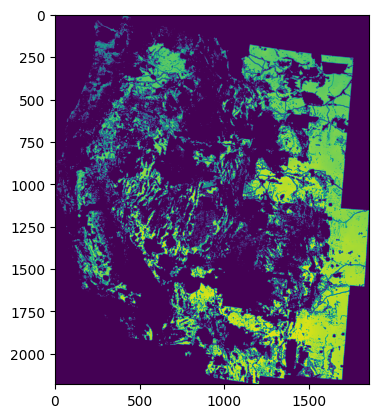

arizona total_generation: 6434455932 needed_generation: 48699201 difference: 6385756731.377656
california total_generation: 3805332976 needed_generation: 115502531 difference: 3689830444.4506054
colorado total_generation: 8857711608 needed_generation: 49239752 difference: 8808471855.863222
idaho total_generation: 1683535553 needed_generation: 1905583 difference: 1681629970.5366602
montana total_generation: 10017151326 needed_generation: 16717511 difference: 10000433814.920654
new_mexico total_generation: 12891210056 needed_generation: 24131511 difference: 12867078545.298887
nevada total_generation: 4686667999 needed_generation: 42333837 difference: 4644334162.452148
oregon total_generation: 3539974703 needed_generation: 8841840 difference: 3531132862.99666
utah total_generation: 1580976509 needed_generation: 116274044 difference: 1464702464.7295508
washington total_generation: 2809005361 needed_generation: 6986026 difference: 2802019335.1903515
wyoming total_generation: 10091019008 nee

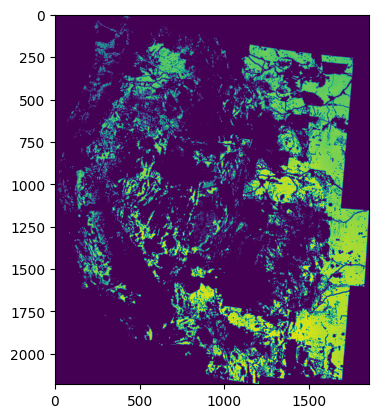

arizona total_generation: 5612971045 needed_generation: 48699201 difference: 5564271843.836152
california total_generation: 3079906969 needed_generation: 115502531 difference: 2964404437.3363476
colorado total_generation: 8075027465 needed_generation: 49239752 difference: 8025787712.650332
idaho total_generation: 1337059046 needed_generation: 1905583 difference: 1335153463.5029688
montana total_generation: 9017172573 needed_generation: 16717511 difference: 9000455062.72705
new_mexico total_generation: 11196859044 needed_generation: 24131511 difference: 11172727533.20416
nevada total_generation: 3639335035 needed_generation: 42333837 difference: 3597001198.0625
oregon total_generation: 2868091339 needed_generation: 8841840 difference: 2859249498.6570606
utah total_generation: 1191187160 needed_generation: 116274044 difference: 1074913115.6182227
washington total_generation: 2429159298 needed_generation: 6986026 difference: 2422173271.380537
wyoming total_generation: 9301161440 needed_ge

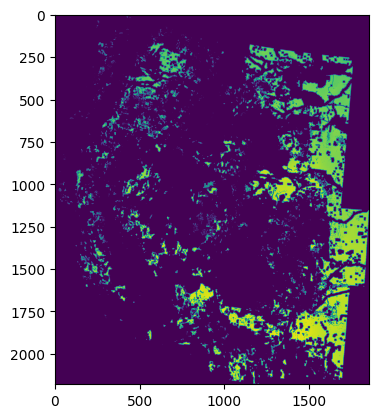

arizona total_generation: 3134921348 needed_generation: 48699201 difference: 3086222147.107637
california total_generation: 1178939485 needed_generation: 115502531 difference: 1063436953.3971387
colorado total_generation: 5573376082 needed_generation: 49239752 difference: 5524136329.745059
idaho total_generation: 491228087 needed_generation: 1905583 difference: 489322504.68827146
montana total_generation: 5568759772 needed_generation: 16717511 difference: 5552042261.392822
new_mexico total_generation: 6740335916 needed_generation: 24131511 difference: 6716204405.621152
nevada total_generation: 1466315661 needed_generation: 42333837 difference: 1423981824.378418
oregon total_generation: 1160981038 needed_generation: 8841840 difference: 1152139197.6951466
utah total_generation: 495669532 needed_generation: 116274044 difference: 379395487.96197265
washington total_generation: 1215447950 needed_generation: 6986026 difference: 1208461923.7828808
wyoming total_generation: 6206906658 needed_g

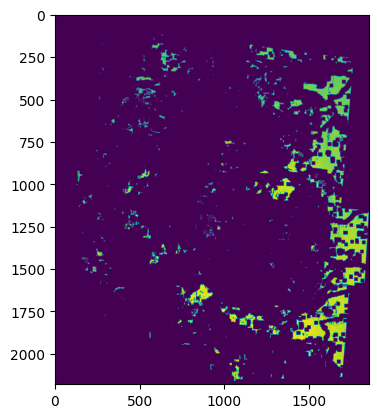

arizona total_generation: 1526228072 needed_generation: 48699201 difference: 1477528871.2702343
california total_generation: 276235304 needed_generation: 115502531 difference: 160732773.27140623
colorado total_generation: 3246231230 needed_generation: 49239752 difference: 3196991478.3461328
idaho total_generation: 101680852 needed_generation: 1905583 difference: 99775269.39774413
montana total_generation: 2723705991 needed_generation: 16717511 difference: 2706988480.4260254
new_mexico total_generation: 3761796501 needed_generation: 24131511 difference: 3737664989.9595313
nevada total_generation: 552724433 needed_generation: 42333837 difference: 510390596.1801758
oregon total_generation: 332965673 needed_generation: 8841840 difference: 324123832.90876955
utah total_generation: 131117871 needed_generation: 116274044 difference: 14843827.017148435
washington total_generation: 420460941 needed_generation: 6986026 difference: 413474914.7313672
wyoming total_generation: 3409787384 needed_gen

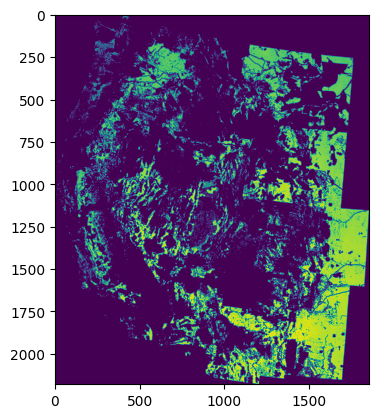

arizona total_generation: 5107362994 needed_generation: 48699201 difference: 5058663793.189179
california total_generation: 3306095875 needed_generation: 115502531 difference: 3190593343.752363
colorado total_generation: 8555503739 needed_generation: 49239752 difference: 8506263987.47211
idaho total_generation: 1682102032 needed_generation: 1905583 difference: 1680196449.5039454
montana total_generation: 6353303465 needed_generation: 16717511 difference: 6336585954.576416
new_mexico total_generation: 12730517259 needed_generation: 24131511 difference: 12706385747.903868
nevada total_generation: 4323662210 needed_generation: 42333837 difference: 4281328372.7597656
oregon total_generation: 2527748286 needed_generation: 8841840 difference: 2518906446.345049
utah total_generation: 1468974524 needed_generation: 116274044 difference: 1352700480.2861915
washington total_generation: 2608347561 needed_generation: 6986026 difference: 2601361535.0206738
wyoming total_generation: 6966193681 needed

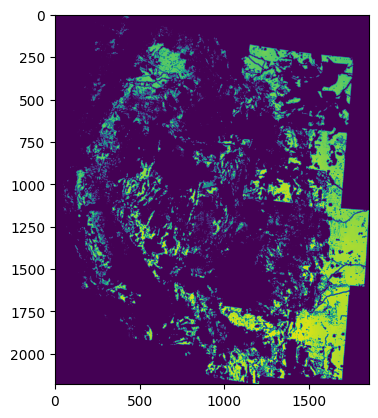

arizona total_generation: 3874093800 needed_generation: 48699201 difference: 3825394599.710176
california total_generation: 2347402652 needed_generation: 115502531 difference: 2231900120.4247265
colorado total_generation: 7733405537 needed_generation: 49239752 difference: 7684165785.504336
idaho total_generation: 1219701624 needed_generation: 1905583 difference: 1217796041.3386621
montana total_generation: 5186993792 needed_generation: 16717511 difference: 5170276281.181641
new_mexico total_generation: 10896765885 needed_generation: 24131511 difference: 10872634374.107481
nevada total_generation: 3257091004 needed_generation: 42333837 difference: 3214757166.7929688
oregon total_generation: 1814942949 needed_generation: 8841840 difference: 1806101109.2857227
utah total_generation: 959679893 needed_generation: 116274044 difference: 843405848.4893165
washington total_generation: 2113516389 needed_generation: 6986026 difference: 2106530362.8954296
wyoming total_generation: 5874128692 neede

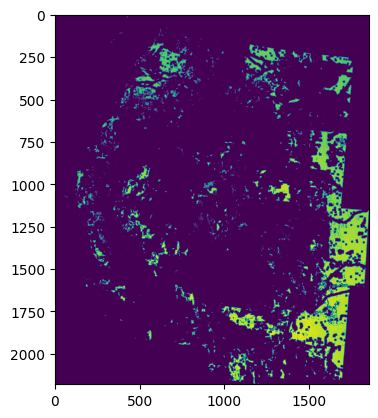

arizona total_generation: 1701894703 needed_generation: 48699201 difference: 1653195502.0295117
california total_generation: 770378721 needed_generation: 115502531 difference: 654876190.1708204
colorado total_generation: 5247502985 needed_generation: 49239752 difference: 5198263233.192325
idaho total_generation: 254580130 needed_generation: 1905583 difference: 252674547.74491212
montana total_generation: 2211082198 needed_generation: 16717511 difference: 2194364687.310791
new_mexico total_generation: 6443739148 needed_generation: 24131511 difference: 6419607636.95416
nevada total_generation: 1234247809 needed_generation: 42333837 difference: 1191913972.6132812
oregon total_generation: 707821418 needed_generation: 8841840 difference: 698979577.7110156
utah total_generation: 307438901 needed_generation: 116274044 difference: 191164856.7266211
washington total_generation: 1126710086 needed_generation: 6986026 difference: 1119724060.316084
wyoming total_generation: 2956419538 needed_genera

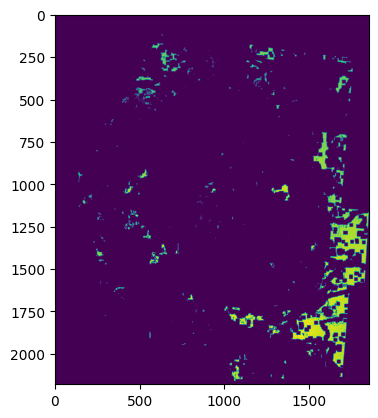

arizona total_generation: 660941830 needed_generation: 48699201 difference: 612242628.8508008
california total_generation: 174659643 needed_generation: 115502531 difference: 59157112.160566404
colorado total_generation: 3032481162 needed_generation: 49239752 difference: 2983241410.1283593
idaho total_generation: 22916008 needed_generation: 1905583 difference: 21010425.290078126
montana total_generation: 624191744 needed_generation: 16717511 difference: 607474232.9846191
new_mexico total_generation: 3648134433 needed_generation: 24131511 difference: 3624002922.366758
nevada total_generation: 462814039 needed_generation: 42333837 difference: 420480202.203125
oregon total_generation: 199996912 needed_generation: 8841840 difference: 191155072.0042285
utah total_generation: 58348938 needed_generation: 116274044 difference: -57925105.64154297
washington total_generation: 404437361 needed_generation: 6986026 difference: 397451334.345625
wyoming total_generation: 1205433805 needed_generation: 

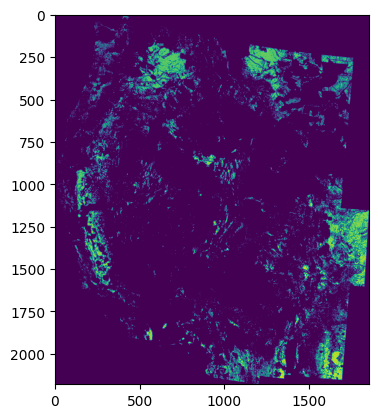

arizona total_generation: 1061510987 needed_generation: 48699201 difference: 1012811786.4167187
california total_generation: 2556228306 needed_generation: 115502531 difference: 2440725775.189131
colorado total_generation: 4362676546 needed_generation: 49239752 difference: 4313436794.178653
idaho total_generation: 684847774 needed_generation: 1905583 difference: 682942191.4607325
montana total_generation: 3452474367 needed_generation: 16717511 difference: 3435756856.680908
new_mexico total_generation: 3281360172 needed_generation: 24131511 difference: 3257228661.448789
nevada total_generation: 283402717 needed_generation: 42333837 difference: 241068880.46972656
oregon total_generation: 1267577717 needed_generation: 8841840 difference: 1258735876.9468555
utah total_generation: 385556860 needed_generation: 116274044 difference: 269282815.7891211
washington total_generation: 2177238549 needed_generation: 6986026 difference: 2170252522.935713
wyoming total_generation: 469720114 needed_gener

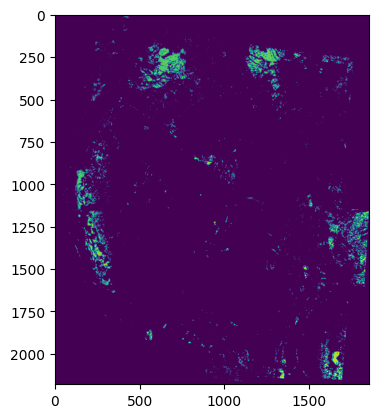

arizona total_generation: 125286699 needed_generation: 48699201 difference: 76587497.79611328
california total_generation: 1553700851 needed_generation: 115502531 difference: 1438198319.5433788
colorado total_generation: 1301621766 needed_generation: 49239752 difference: 1252382013.6024804
idaho total_generation: 219876743 needed_generation: 1905583 difference: 217971160.2766504
montana total_generation: 1250317945 needed_generation: 16717511 difference: 1233600433.7731934
new_mexico total_generation: 844349153 needed_generation: 24131511 difference: 820217641.9517188
nevada total_generation: 26067903 needed_generation: 42333837 difference: -16265933.404785156
oregon total_generation: 249201831 needed_generation: 8841840 difference: 240359991.27180663
utah total_generation: 72925773 needed_generation: 116274044 difference: -43348271.205507815
washington total_generation: 1260180019 needed_generation: 6986026 difference: 1253193992.9332714
wyoming total_generation: 82621257 needed_gener

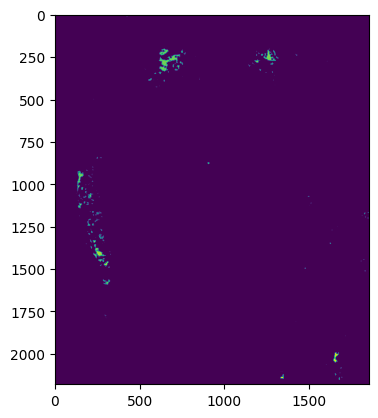

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 388609472 needed_generation: 115502531 difference: 273106941.32560545
colorado total_generation: 8589192 needed_generation: 49239752 difference: -40650560.1353125
idaho total_generation: 4580870 needed_generation: 1905583 difference: 2675287.8266992187
montana total_generation: 143801632 needed_generation: 16717511 difference: 127084121.04858398
new_mexico total_generation: 78130317 needed_generation: 24131511 difference: 53998806.50005859
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 778832 needed_generation: 8841840 difference: -8063008.346113281
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 319067677 needed_generation: 6986026 difference: 312081651.2694531
wyoming total_generation: 1610128 needed_generation: 21468980 difference: -19858852.455703124
env_3_

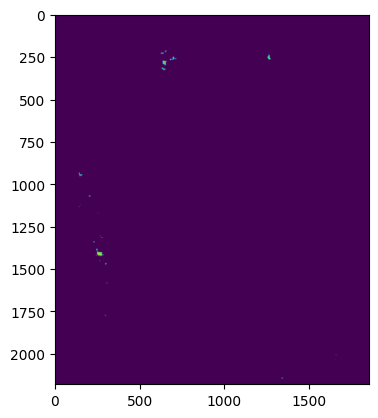

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 67515497 needed_generation: 115502531 difference: -47987034.39216797
colorado total_generation: 0 needed_generation: 49239752 difference: -49239752.44
idaho total_generation: 0 needed_generation: 1905583 difference: -1905583.04
montana total_generation: 18233824 needed_generation: 16717511 difference: 1516312.822265625
new_mexico total_generation: 2109992 needed_generation: 24131511 difference: -22021519.090761717
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 0 needed_generation: 8841840 difference: -8841840.58
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 57291096 needed_generation: 6986026 difference: 50305069.95475586
wyoming total_generation: 0 needed_generation: 21468980 difference: -21468980.61
dac_farm_env1


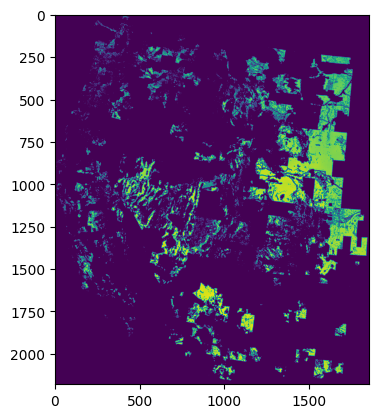

arizona total_generation: 2827658842 needed_generation: 48699201 difference: 2778959641.4557815
california total_generation: 1242499160 needed_generation: 115502531 difference: 1126996629.1674023
colorado total_generation: 4032298644 needed_generation: 49239752 difference: 3983058892.1840234
idaho total_generation: 704836794 needed_generation: 1905583 difference: 702931211.7854395
montana total_generation: 4567367181 needed_generation: 16717511 difference: 4550649670.447998
new_mexico total_generation: 1282910274 needed_generation: 24131511 difference: 1258778763.1016212
nevada total_generation: 3483737922 needed_generation: 42333837 difference: 3441404084.842285
oregon total_generation: 499358555 needed_generation: 8841840 difference: 490516715.2281055
utah total_generation: 1059354182 needed_generation: 116274044 difference: 943080137.446836
washington total_generation: 765498966 needed_generation: 6986026 difference: 758512940.0353223
wyoming total_generation: 8723983398 needed_gene

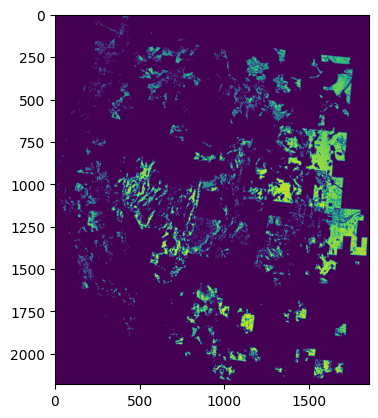

arizona total_generation: 2154261535 needed_generation: 48699201 difference: 2105562334.2902539
california total_generation: 1048789699 needed_generation: 115502531 difference: 933287167.6769239
colorado total_generation: 3916460110 needed_generation: 49239752 difference: 3867220357.667422
idaho total_generation: 704502486 needed_generation: 1905583 difference: 702596903.3577051
montana total_generation: 2778651768 needed_generation: 16717511 difference: 2761934257.4450684
new_mexico total_generation: 1273669017 needed_generation: 24131511 difference: 1249537506.1045508
nevada total_generation: 3185957430 needed_generation: 42333837 difference: 3143623593.1601562
oregon total_generation: 436026229 needed_generation: 8841840 difference: 427184388.5984668
utah total_generation: 990567256 needed_generation: 116274044 difference: 874293211.7217383
washington total_generation: 691712298 needed_generation: 6986026 difference: 684726271.3365918
wyoming total_generation: 5974933468 needed_gene

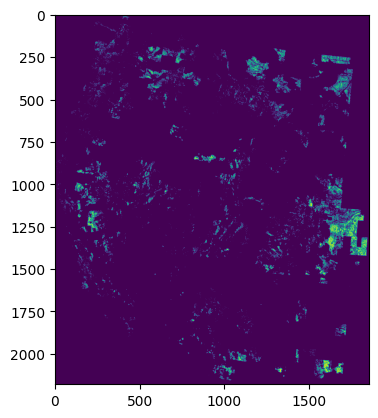

arizona total_generation: 323682805 needed_generation: 48699201 difference: 274983604.2316601
california total_generation: 821000903 needed_generation: 115502531 difference: 705498371.7491895
colorado total_generation: 2150894960 needed_generation: 49239752 difference: 2101655207.9652734
idaho total_generation: 317611491 needed_generation: 1905583 difference: 315705908.43094724
montana total_generation: 1362413357 needed_generation: 16717511 difference: 1345695846.0168457
new_mexico total_generation: 531984846 needed_generation: 24131511 difference: 507853334.7398047
nevada total_generation: 233994311 needed_generation: 42333837 difference: 191660474.24902344
oregon total_generation: 254703023 needed_generation: 8841840 difference: 245861183.1761035
utah total_generation: 251523685 needed_generation: 116274044 difference: 135249641.03814453
washington total_generation: 546376244 needed_generation: 6986026 difference: 539390217.7440625
wyoming total_generation: 439846655 needed_generati

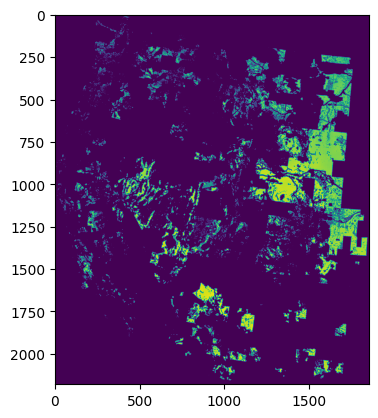

arizona total_generation: 2485781990 needed_generation: 48699201 difference: 2437082789.727266
california total_generation: 992806311 needed_generation: 115502531 difference: 877303780.0426465
colorado total_generation: 3667210235 needed_generation: 49239752 difference: 3617970482.679629
idaho total_generation: 542485972 needed_generation: 1905583 difference: 540580389.6467676
montana total_generation: 4109390169 needed_generation: 16717511 difference: 4092672658.4692383
new_mexico total_generation: 1054133763 needed_generation: 24131511 difference: 1030002252.1250587
nevada total_generation: 2665655517 needed_generation: 42333837 difference: 2623321680.0913086
oregon total_generation: 404183001 needed_generation: 8841840 difference: 395341161.3377246
utah total_generation: 809816444 needed_generation: 116274044 difference: 693542399.8101172
washington total_generation: 637287985 needed_generation: 6986026 difference: 630301959.1625196
wyoming total_generation: 8050362360 needed_genera

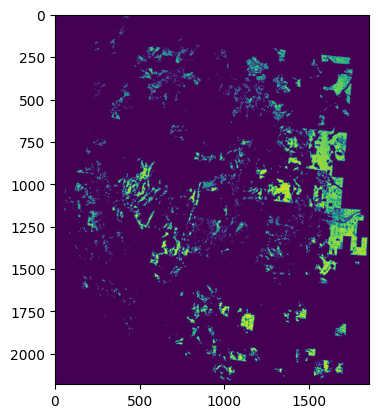

arizona total_generation: 1594535423 needed_generation: 48699201 difference: 1545836222.4079297
california total_generation: 712533630 needed_generation: 115502531 difference: 597031098.7548047
colorado total_generation: 3496035003 needed_generation: 49239752 difference: 3446795251.178164
idaho total_generation: 491339878 needed_generation: 1905583 difference: 489434295.6855859
montana total_generation: 2259819904 needed_generation: 16717511 difference: 2243102393.1262207
new_mexico total_generation: 1029238621 needed_generation: 24131511 difference: 1005107110.5137305
nevada total_generation: 2368367668 needed_generation: 42333837 difference: 2326033831.080078
oregon total_generation: 296787497 needed_generation: 8841840 difference: 287945656.73445314
utah total_generation: 654228934 needed_generation: 116274044 difference: 537954889.7979102
washington total_generation: 516246870 needed_generation: 6986026 difference: 509260843.4105664
wyoming total_generation: 5032295237 needed_gener

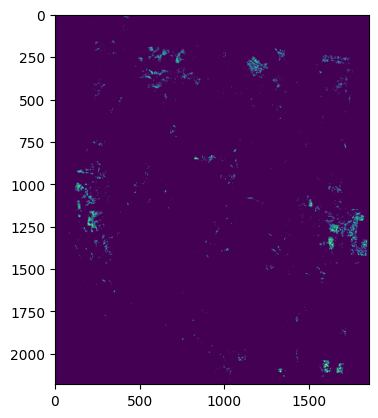

arizona total_generation: 33140103 needed_generation: 48699201 difference: -15559097.352812499
california total_generation: 491767667 needed_generation: 115502531 difference: 376265135.69938475
colorado total_generation: 658542915 needed_generation: 49239752 difference: 609303162.8895898
idaho total_generation: 106473326 needed_generation: 1905583 difference: 104567743.10746093
montana total_generation: 336184347 needed_generation: 16717511 difference: 319466836.26342773
new_mexico total_generation: 184403552 needed_generation: 24131511 difference: 160272041.5830664
nevada total_generation: 23067834 needed_generation: 42333837 difference: -19266002.508789062
oregon total_generation: 66859420 needed_generation: 8841840 difference: 58017579.61897461
utah total_generation: 43788883 needed_generation: 116274044 difference: -72485160.83441406
washington total_generation: 275372608 needed_generation: 6986026 difference: 268386581.8065625
wyoming total_generation: 74756863 needed_generation: 

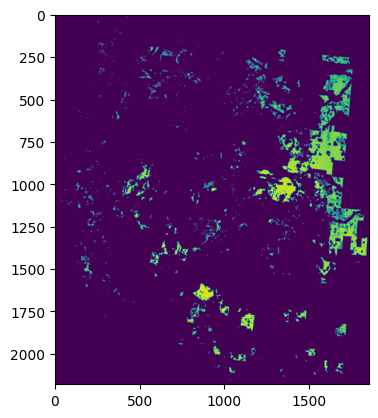

arizona total_generation: 1507126361 needed_generation: 48699201 difference: 1458427160.095918
california total_generation: 329731328 needed_generation: 115502531 difference: 214228796.4635449
colorado total_generation: 2490430127 needed_generation: 49239752 difference: 2441190375.0648828
idaho total_generation: 160506380 needed_generation: 1905583 difference: 158600797.5447168
montana total_generation: 2595216036 needed_generation: 16717511 difference: 2578498524.770508
new_mexico total_generation: 537082942 needed_generation: 24131511 difference: 512951431.48296875
nevada total_generation: 1083924852 needed_generation: 42333837 difference: 1041591015.5234375
oregon total_generation: 133082302 needed_generation: 8841840 difference: 124240462.40339844
utah total_generation: 347263809 needed_generation: 116274044 difference: 230989764.99078125
washington total_generation: 251427250 needed_generation: 6986026 difference: 244441223.51066408
wyoming total_generation: 5458819783 needed_gene

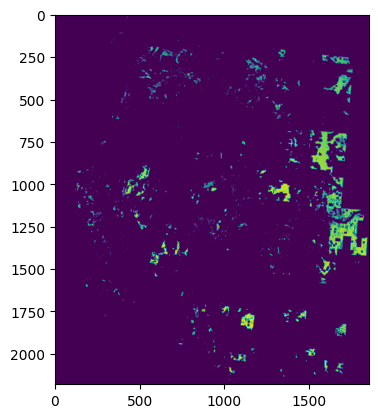

arizona total_generation: 696070198 needed_generation: 48699201 difference: 647370996.8976758
california total_generation: 190375870 needed_generation: 115502531 difference: 74873338.7194043
colorado total_generation: 2313598587 needed_generation: 49239752 difference: 2264358835.2675195
idaho total_generation: 99626237 needed_generation: 1905583 difference: 97720654.2268457
montana total_generation: 1015824551 needed_generation: 16717511 difference: 999107040.2893066
new_mexico total_generation: 512969581 needed_generation: 24131511 difference: 488838069.81060547
nevada total_generation: 892256684 needed_generation: 42333837 difference: 849922847.5961914
oregon total_generation: 96095440 needed_generation: 8841840 difference: 87253599.84236328
utah total_generation: 220798690 needed_generation: 116274044 difference: 104524645.79644531
washington total_generation: 220279714 needed_generation: 6986026 difference: 213293687.53410158
wyoming total_generation: 2542673570 needed_generation: 

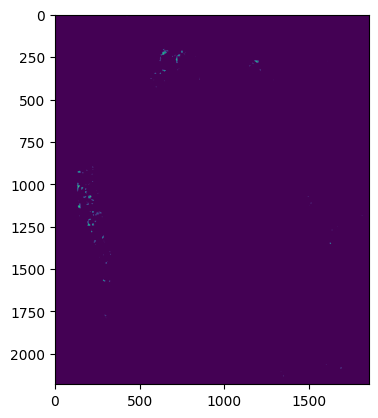

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 99045215 needed_generation: 115502531 difference: -16457316.667558596
colorado total_generation: 2076706 needed_generation: 49239752 difference: -47163046.31939453
idaho total_generation: 387637 needed_generation: 1905583 difference: -1517945.8109960938
montana total_generation: 10327638 needed_generation: 16717511 difference: -6389872.642822266
new_mexico total_generation: 1401683 needed_generation: 24131511 difference: -22729827.557558592
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 306047 needed_generation: 8841840 difference: -8535793.045820313
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 46710103 needed_generation: 6986026 difference: 39724076.594160154
wyoming total_generation: 813132 needed_generation: 21468980 difference: -20655848.5396875
dac_farm

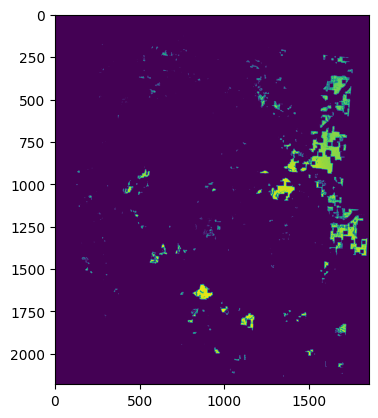

arizona total_generation: 849926239 needed_generation: 48699201 difference: 801227038.401582
california total_generation: 58669251 needed_generation: 115502531 difference: -56833280.63484375
colorado total_generation: 1464542927 needed_generation: 49239752 difference: 1415303174.6474023
idaho total_generation: 17549743 needed_generation: 1905583 difference: 15644160.370644532
montana total_generation: 1347787327 needed_generation: 16717511 difference: 1331069816.1401367
new_mexico total_generation: 264757010 needed_generation: 24131511 difference: 240625499.65191406
nevada total_generation: 419363282 needed_generation: 42333837 difference: 377029445.6430664
oregon total_generation: 27108663 needed_generation: 8841840 difference: 18266823.00886719
utah total_generation: 96177484 needed_generation: 116274044 difference: -20096560.06292969
washington total_generation: 55789053 needed_generation: 6986026 difference: 48803026.68083008
wyoming total_generation: 3128594903 needed_generation: 

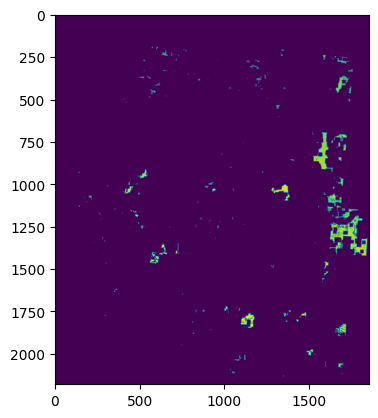

arizona total_generation: 289537328 needed_generation: 48699201 difference: 240838126.8293164
california total_generation: 24938522 needed_generation: 115502531 difference: -90564009.53132813
colorado total_generation: 1360169444 needed_generation: 49239752 difference: 1310929692.4794335
idaho total_generation: 7371057 needed_generation: 1905583 difference: 5465474.850625
montana total_generation: 313397913 needed_generation: 16717511 difference: 296680402.08251953
new_mexico total_generation: 257337658 needed_generation: 24131511 difference: 233206147.4448828
nevada total_generation: 335890938 needed_generation: 42333837 difference: 293557101.08984375
oregon total_generation: 23013227 needed_generation: 8841840 difference: 14171387.034746094
utah total_generation: 44298012 needed_generation: 116274044 difference: -71976032.54828125
washington total_generation: 52468481 needed_generation: 6986026 difference: 45482454.594648436
wyoming total_generation: 1082056394 needed_generation: 214

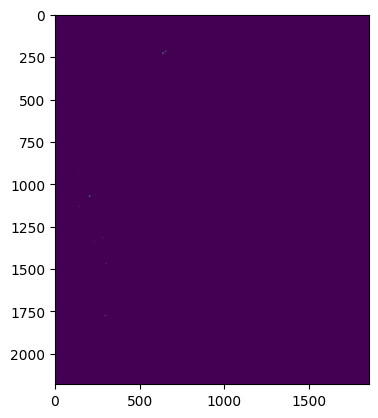

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 4748750 needed_generation: 115502531 difference: -110753781.65291016
colorado total_generation: 0 needed_generation: 49239752 difference: -49239752.44
idaho total_generation: 0 needed_generation: 1905583 difference: -1905583.04
montana total_generation: 0 needed_generation: 16717511 difference: -16717511.25
new_mexico total_generation: 0 needed_generation: 24131511 difference: -24131511.31
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 0 needed_generation: 8841840 difference: -8841840.58
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 3431309 needed_generation: 6986026 difference: -3554717.19734375
wyoming total_generation: 0 needed_generation: 21468980 difference: -21468980.61
Analyzing Solar PV for 45 MW Power Density...
baseline


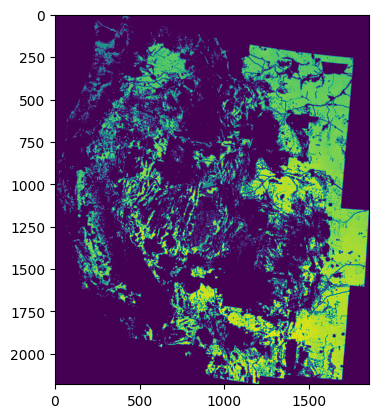

arizona total_generation: 9749400600 needed_generation: 48699201 difference: 9700701398.937471
california total_generation: 5917745417 needed_generation: 115502531 difference: 5802242885.942915
colorado total_generation: 14008268343 needed_generation: 49239752 difference: 13959028591.24042
idaho total_generation: 2798338510 needed_generation: 1905583 difference: 2796432927.2212305
montana total_generation: 17887875897 needed_generation: 16717511 difference: 17871158385.911865
new_mexico total_generation: 19365729727 needed_generation: 24131511 difference: 19341598216.66241
nevada total_generation: 7307370042 needed_generation: 42333837 difference: 7265036205.113281
oregon total_generation: 5756709658 needed_generation: 8841840 difference: 5747867818.306719
utah total_generation: 2986721731 needed_generation: 116274044 difference: 2870447686.813291
washington total_generation: 4374375974 needed_generation: 6986026 difference: 4367389947.396162
wyoming total_generation: 15285078183 neede

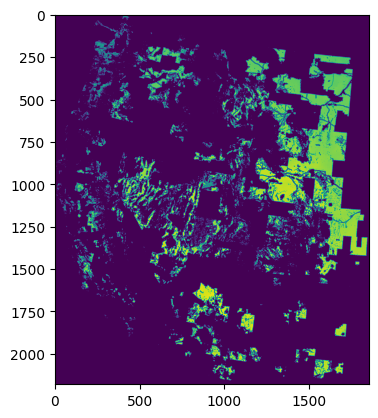

arizona total_generation: 4287573979 needed_generation: 48699201 difference: 4238874778.0024123
california total_generation: 2126901247 needed_generation: 115502531 difference: 2011398715.427168
colorado total_generation: 6997933035 needed_generation: 49239752 difference: 6948693283.372989
idaho total_generation: 1147230486 needed_generation: 1905583 difference: 1145324903.9180079
montana total_generation: 9889841966 needed_generation: 16717511 difference: 9873124455.498047
new_mexico total_generation: 2258627505 needed_generation: 24131511 difference: 2234495994.4663672
nevada total_generation: 5452388492 needed_generation: 42333837 difference: 5410054655.4453125
oregon total_generation: 1537395834 needed_generation: 8841840 difference: 1528553993.6631641
utah total_generation: 2295079592 needed_generation: 116274044 difference: 2178805548.3001075
washington total_generation: 2290988855 needed_generation: 6986026 difference: 2284002828.621748
wyoming total_generation: 13278197647 need

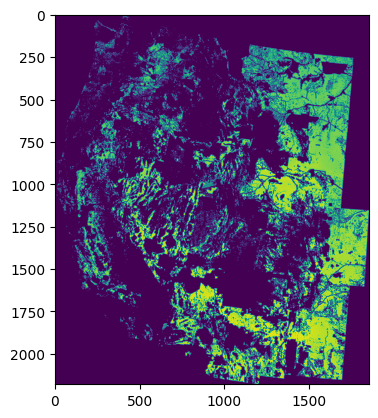

arizona total_generation: 9618178283 needed_generation: 48699201 difference: 9569479082.382296
california total_generation: 4956781168 needed_generation: 115502531 difference: 4841278637.185591
colorado total_generation: 12651045763 needed_generation: 49239752 difference: 12601806011.226992
idaho total_generation: 2722093922 needed_generation: 1905583 difference: 2720188339.673623
montana total_generation: 15006317499 needed_generation: 16717511 difference: 14989599988.522339
new_mexico total_generation: 17006189912 needed_generation: 24131511 difference: 16982058401.377989
nevada total_generation: 7304476408 needed_generation: 42333837 difference: 7262142571.475586
oregon total_generation: 3329632816 needed_generation: 8841840 difference: 3320790976.3059864
utah total_generation: 2622998798 needed_generation: 116274044 difference: 2506724753.8775
washington total_generation: 2220095602 needed_generation: 6986026 difference: 2213109575.936201
wyoming total_generation: 15198765838 neede

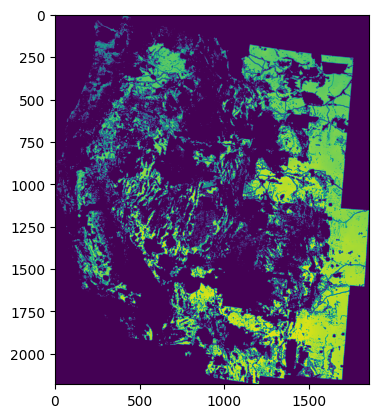

arizona total_generation: 9651683898 needed_generation: 48699201 difference: 9602984697.676485
california total_generation: 5707999464 needed_generation: 115502531 difference: 5592496932.510908
colorado total_generation: 13286567412 needed_generation: 49239752 difference: 13237327660.014833
idaho total_generation: 2525303330 needed_generation: 1905583 difference: 2523397747.3249903
montana total_generation: 15025726989 needed_generation: 16717511 difference: 15009009478.005981
new_mexico total_generation: 19336815084 needed_generation: 24131511 difference: 19312683573.60333
nevada total_generation: 7030001999 needed_generation: 42333837 difference: 6987668162.303223
oregon total_generation: 5309962055 needed_generation: 8841840 difference: 5301120214.78499
utah total_generation: 2371464763 needed_generation: 116274044 difference: 2255190719.374326
washington total_generation: 4213508042 needed_generation: 6986026 difference: 4206522016.1205273
wyoming total_generation: 15136528512 need

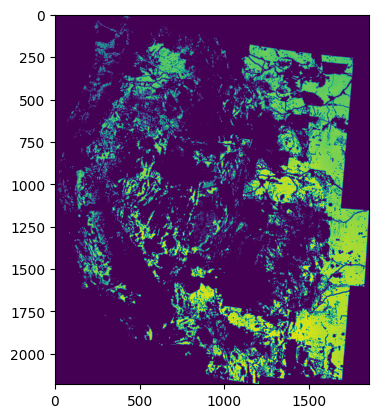

arizona total_generation: 8419456567 needed_generation: 48699201 difference: 8370757366.364228
california total_generation: 4619860453 needed_generation: 115502531 difference: 4504357921.839521
colorado total_generation: 12112541197 needed_generation: 49239752 difference: 12063301445.195498
idaho total_generation: 2005588569 needed_generation: 1905583 difference: 2003682986.7744532
montana total_generation: 13525758860 needed_generation: 16717511 difference: 13509041349.715576
new_mexico total_generation: 16795288566 needed_generation: 24131511 difference: 16771157055.46124
nevada total_generation: 5459002552 needed_generation: 42333837 difference: 5416668715.71875
oregon total_generation: 4302137008 needed_generation: 8841840 difference: 4293295168.275591
utah total_generation: 1786780740 needed_generation: 116274044 difference: 1670506695.707334
washington total_generation: 3643738947 needed_generation: 6986026 difference: 3636752920.4058056
wyoming total_generation: 13951742160 need

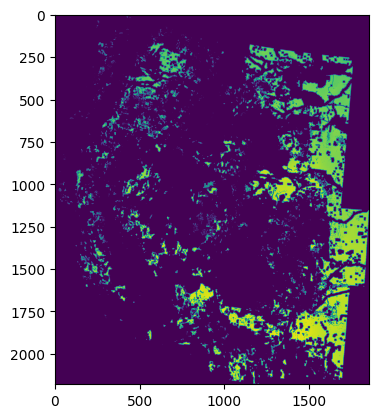

arizona total_generation: 4702382022 needed_generation: 48699201 difference: 4653682821.271455
california total_generation: 1768409227 needed_generation: 115502531 difference: 1652906695.930708
colorado total_generation: 8360064123 needed_generation: 49239752 difference: 8310824370.837588
idaho total_generation: 736842131 needed_generation: 1905583 difference: 734936548.5524073
montana total_generation: 8353139658 needed_generation: 16717511 difference: 8336422147.714233
new_mexico total_generation: 10110503875 needed_generation: 24131511 difference: 10086372364.08673
nevada total_generation: 2199473492 needed_generation: 42333837 difference: 2157139655.192627
oregon total_generation: 1741471557 needed_generation: 8841840 difference: 1732629716.8327198
utah total_generation: 743504298 needed_generation: 116274044 difference: 627230254.222959
washington total_generation: 1823171925 needed_generation: 6986026 difference: 1816185899.0093212
wyoming total_generation: 9310359987 needed_gene

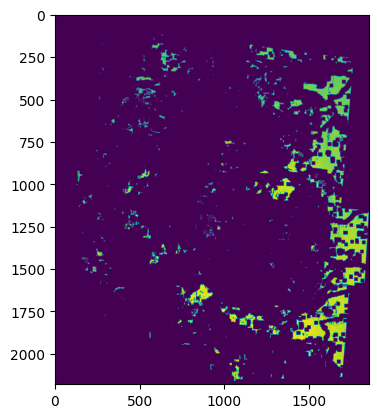

arizona total_generation: 2289342108 needed_generation: 48699201 difference: 2240642907.515352
california total_generation: 414352957 needed_generation: 115502531 difference: 298850425.74210936
colorado total_generation: 4869346846 needed_generation: 49239752 difference: 4820107093.7392
idaho total_generation: 152521278 needed_generation: 1905583 difference: 150615695.61661622
montana total_generation: 4085558987 needed_generation: 16717511 difference: 4068841476.264038
new_mexico total_generation: 5642694751 needed_generation: 24131511 difference: 5618563240.594296
nevada total_generation: 829086650 needed_generation: 42333837 difference: 786752812.8952637
oregon total_generation: 499448510 needed_generation: 8841840 difference: 490606669.6531543
utah total_generation: 196676807 needed_generation: 116274044 difference: 80402762.80572265
washington total_generation: 630691412 needed_generation: 6986026 difference: 623705385.4320508
wyoming total_generation: 5114681076 needed_generation

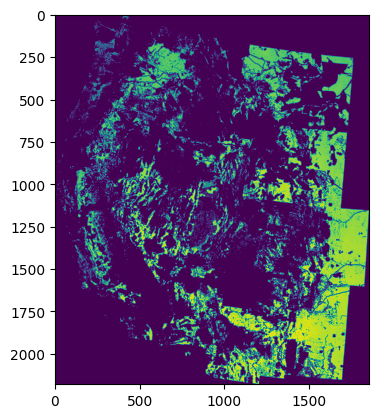

arizona total_generation: 7661044491 needed_generation: 48699201 difference: 7612345290.393769
california total_generation: 4959143813 needed_generation: 115502531 difference: 4843641281.463545
colorado total_generation: 12833255609 needed_generation: 49239752 difference: 12784015857.428164
idaho total_generation: 2523153048 needed_generation: 1905583 difference: 2521247465.775918
montana total_generation: 9529955198 needed_generation: 16717511 difference: 9513237687.489624
new_mexico total_generation: 19095775888 needed_generation: 24131511 difference: 19071644377.5108
nevada total_generation: 6485493315 needed_generation: 42333837 difference: 6443159477.764648
oregon total_generation: 3791622430 needed_generation: 8841840 difference: 3782780589.8075733
utah total_generation: 2203461787 needed_generation: 116274044 difference: 2087187742.7092872
washington total_generation: 3912521342 needed_generation: 6986026 difference: 3905535315.8660107
wyoming total_generation: 10449290522 neede

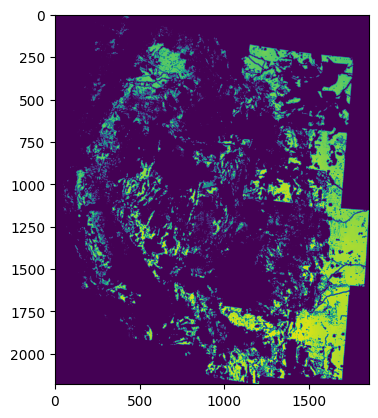

arizona total_generation: 5811140701 needed_generation: 48699201 difference: 5762441500.175263
california total_generation: 3521103978 needed_generation: 115502531 difference: 3405601446.47209
colorado total_generation: 11600108306 needed_generation: 49239752 difference: 11550868554.476503
idaho total_generation: 1829552436 needed_generation: 1905583 difference: 1827646853.5279932
montana total_generation: 7780490688 needed_generation: 16717511 difference: 7763773177.397461
new_mexico total_generation: 16345148828 needed_generation: 24131511 difference: 16321017316.816221
nevada total_generation: 4885636506 needed_generation: 42333837 difference: 4843302668.814453
oregon total_generation: 2722414424 needed_generation: 8841840 difference: 2713572584.218584
utah total_generation: 1439519839 needed_generation: 116274044 difference: 1323245795.0139747
washington total_generation: 3170274584 needed_generation: 6986026 difference: 3163288557.6781445
wyoming total_generation: 8811193039 neede

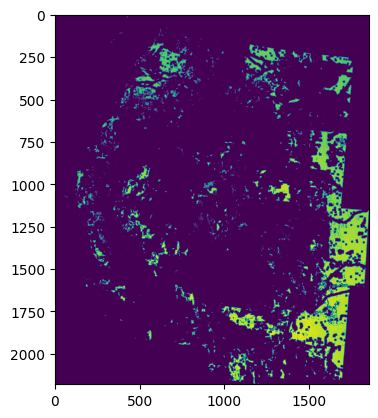

arizona total_generation: 2552842054 needed_generation: 48699201 difference: 2504142853.654268
california total_generation: 1155568082 needed_generation: 115502531 difference: 1040065551.0912305
colorado total_generation: 7871254478 needed_generation: 49239752 difference: 7822014726.008487
idaho total_generation: 381870196 needed_generation: 1905583 difference: 379964613.13736814
montana total_generation: 3316623297 needed_generation: 16717511 difference: 3299905786.5911865
new_mexico total_generation: 9665608722 needed_generation: 24131511 difference: 9641477211.08624
nevada total_generation: 1851371714 needed_generation: 42333837 difference: 1809037877.5449219
oregon total_generation: 1061732127 needed_generation: 8841840 difference: 1052890286.8565234
utah total_generation: 461158351 needed_generation: 116274044 difference: 344884307.36993164
washington total_generation: 1690065130 needed_generation: 6986026 difference: 1683079103.809126
wyoming total_generation: 4434629307 needed_g

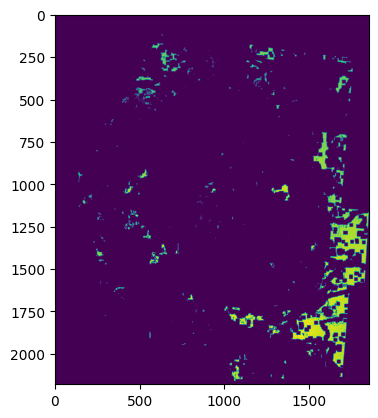

arizona total_generation: 991412745 needed_generation: 48699201 difference: 942713543.8862011
california total_generation: 261989465 needed_generation: 115502531 difference: 146486934.0758496
colorado total_generation: 4548721743 needed_generation: 49239752 difference: 4499481991.4125395
idaho total_generation: 34374012 needed_generation: 1905583 difference: 32468429.45511719
montana total_generation: 936287616 needed_generation: 16717511 difference: 919570105.1019287
new_mexico total_generation: 5472201650 needed_generation: 24131511 difference: 5448070139.205136
nevada total_generation: 694221059 needed_generation: 42333837 difference: 651887221.9296875
oregon total_generation: 299995368 needed_generation: 8841840 difference: 291153528.2963428
utah total_generation: 87523408 needed_generation: 116274044 difference: -28750636.182314456
washington total_generation: 606656041 needed_generation: 6986026 difference: 599670014.8534375
wyoming total_generation: 1808150708 needed_generation:

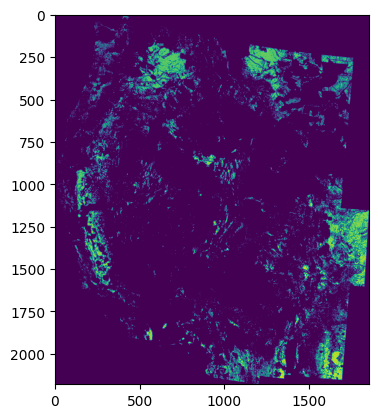

arizona total_generation: 1592266481 needed_generation: 48699201 difference: 1543567280.235078
california total_generation: 3834342460 needed_generation: 115502531 difference: 3718839928.618696
colorado total_generation: 6544014819 needed_generation: 49239752 difference: 6494775067.487979
idaho total_generation: 1027271661 needed_generation: 1905583 difference: 1025366078.7110987
montana total_generation: 5178711551 needed_generation: 16717511 difference: 5161994040.646362
new_mexico total_generation: 4922040259 needed_generation: 24131511 difference: 4897908747.828183
nevada total_generation: 425104076 needed_generation: 42333837 difference: 382770239.32958984
oregon total_generation: 1901366576 needed_generation: 8841840 difference: 1892524735.7102833
utah total_generation: 578335290 needed_generation: 116274044 difference: 462061245.96368164
washington total_generation: 3265857824 needed_generation: 6986026 difference: 3258871797.7385693
wyoming total_generation: 704580171 needed_ge

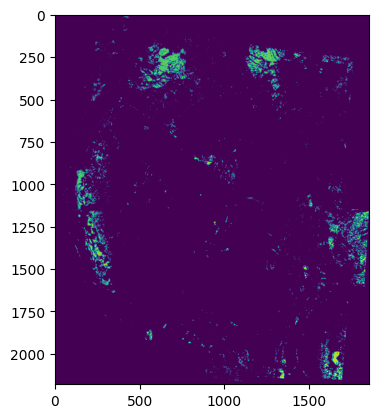

arizona total_generation: 187930048 needed_generation: 48699201 difference: 139230847.30416992
california total_generation: 2330551276 needed_generation: 115502531 difference: 2215048745.1500683
colorado total_generation: 1952432649 needed_generation: 49239752 difference: 1903192896.6237206
idaho total_generation: 329815114 needed_generation: 1905583 difference: 327909531.93497556
montana total_generation: 1875476917 needed_generation: 16717511 difference: 1858759406.28479
new_mexico total_generation: 1266523729 needed_generation: 24131511 difference: 1242392218.5825782
nevada total_generation: 39101855 needed_generation: 42333837 difference: -3231981.4821777344
oregon total_generation: 373802747 needed_generation: 8841840 difference: 364960907.19771
utah total_generation: 109388660 needed_generation: 116274044 difference: -6885384.528261721
washington total_generation: 1890270029 needed_generation: 6986026 difference: 1883284002.7349072
wyoming total_generation: 123931886 needed_gener

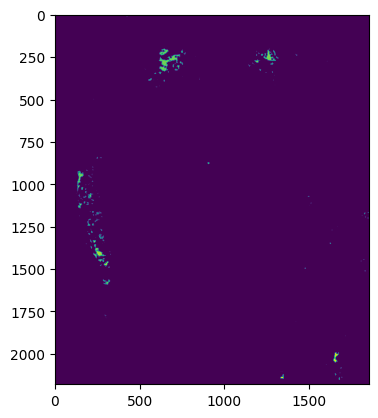

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 582914209 needed_generation: 115502531 difference: 467411677.8234082
colorado total_generation: 12883788 needed_generation: 49239752 difference: -36355963.98296875
idaho total_generation: 6871306 needed_generation: 1905583 difference: 4965723.260048828
montana total_generation: 215702448 needed_generation: 16717511 difference: 198984937.19787598
new_mexico total_generation: 117195476 needed_generation: 24131511 difference: 93063965.40508789
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 1168248 needed_generation: 8841840 difference: -7673592.229169922
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 478601516 needed_generation: 6986026 difference: 471615490.2391797
wyoming total_generation: 2415192 needed_generation: 21468980 difference: -19053788.378554687
env_

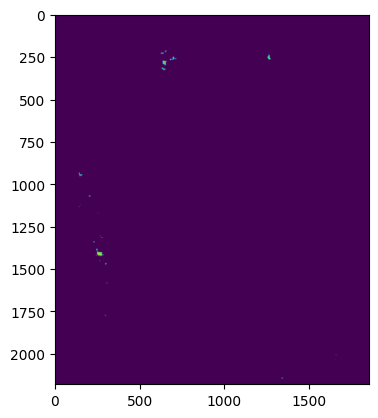

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 101273245 needed_generation: 115502531 difference: -14229285.753251955
colorado total_generation: 0 needed_generation: 49239752 difference: -49239752.44
idaho total_generation: 0 needed_generation: 1905583 difference: -1905583.04
montana total_generation: 27350736 needed_generation: 16717511 difference: 10633224.858398438
new_mexico total_generation: 3164988 needed_generation: 24131511 difference: -20966522.981142577
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 0 needed_generation: 8841840 difference: -8841840.58
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 85936644 needed_generation: 6986026 difference: 78950618.26713379
wyoming total_generation: 0 needed_generation: 21468980 difference: -21468980.61
dac_farm_env1


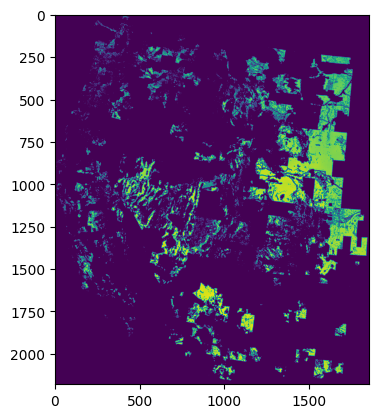

arizona total_generation: 4241488264 needed_generation: 48699201 difference: 4192789062.793672
california total_generation: 1863748741 needed_generation: 115502531 difference: 1748246209.5861034
colorado total_generation: 6048447966 needed_generation: 49239752 difference: 5999208214.496036
idaho total_generation: 1057255192 needed_generation: 1905583 difference: 1055349609.1981592
montana total_generation: 6851050772 needed_generation: 16717511 difference: 6834333261.296997
new_mexico total_generation: 1924365411 needed_generation: 24131511 difference: 1900233900.3074317
nevada total_generation: 5225606883 needed_generation: 42333837 difference: 5183273045.888428
oregon total_generation: 749037833 needed_generation: 8841840 difference: 740195993.1321582
utah total_generation: 1589031273 needed_generation: 116274044 difference: 1472757228.450254
washington total_generation: 1148248450 needed_generation: 6986026 difference: 1141262423.3879833
wyoming total_generation: 13085975097 needed_

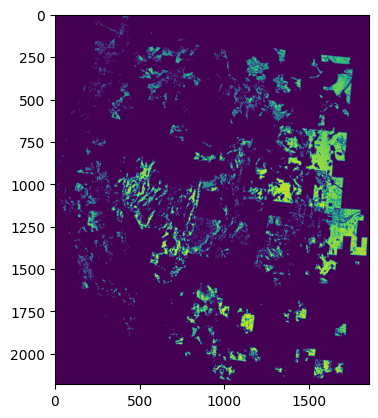

arizona total_generation: 3231392303 needed_generation: 48699201 difference: 3182693102.045381
california total_generation: 1573184549 needed_generation: 115502531 difference: 1457682017.3503857
colorado total_generation: 5874690165 needed_generation: 49239752 difference: 5825450412.721133
idaho total_generation: 1056753729 needed_generation: 1905583 difference: 1054848146.5565577
montana total_generation: 4167977653 needed_generation: 16717511 difference: 4151260141.7926025
new_mexico total_generation: 1910503526 needed_generation: 24131511 difference: 1886372014.8118262
nevada total_generation: 4778936145 needed_generation: 42333837 difference: 4736602308.365234
oregon total_generation: 654039343 needed_generation: 8841840 difference: 645197503.1877002
utah total_generation: 1485850884 needed_generation: 116274044 difference: 1369576839.8626075
washington total_generation: 1037568447 needed_generation: 6986026 difference: 1030582420.3398877
wyoming total_generation: 8962400202 needed

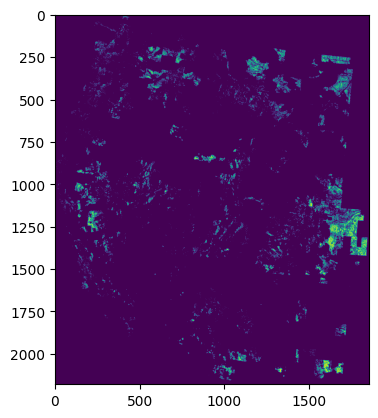

arizona total_generation: 485524208 needed_generation: 48699201 difference: 436825006.9574902
california total_generation: 1231501355 needed_generation: 115502531 difference: 1115998823.458784
colorado total_generation: 3226342440 needed_generation: 49239752 difference: 3177102688.16791
idaho total_generation: 476417237 needed_generation: 1905583 difference: 474511654.1664209
montana total_generation: 2043620035 needed_generation: 16717511 difference: 2026902524.6502686
new_mexico total_generation: 797977269 needed_generation: 24131511 difference: 773845757.7647071
nevada total_generation: 350991467 needed_generation: 42333837 difference: 308657629.99853516
oregon total_generation: 382054535 needed_generation: 8841840 difference: 373212695.0541553
utah total_generation: 377285528 needed_generation: 116274044 difference: 261011483.8372168
washington total_generation: 819564366 needed_generation: 6986026 difference: 812578339.9510938
wyoming total_generation: 659769983 needed_generation:

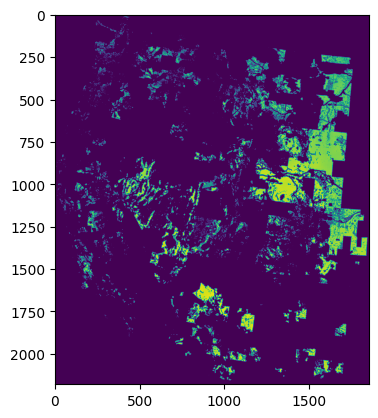

arizona total_generation: 3728672986 needed_generation: 48699201 difference: 3679973785.2008986
california total_generation: 1489209467 needed_generation: 115502531 difference: 1373706935.8989697
colorado total_generation: 5500815352 needed_generation: 49239752 difference: 5451575600.239444
idaho total_generation: 813728959 needed_generation: 1905583 difference: 811823375.9901514
montana total_generation: 6164085254 needed_generation: 16717511 difference: 6147367743.328857
new_mexico total_generation: 1581200645 needed_generation: 24131511 difference: 1557069133.842588
nevada total_generation: 3998483276 needed_generation: 42333837 difference: 3956149438.761963
oregon total_generation: 606274502 needed_generation: 8841840 difference: 597432662.2965869
utah total_generation: 1214724666 needed_generation: 116274044 difference: 1098450621.9951758
washington total_generation: 955931978 needed_generation: 6986026 difference: 948945952.0787793
wyoming total_generation: 12075543541 needed_gen

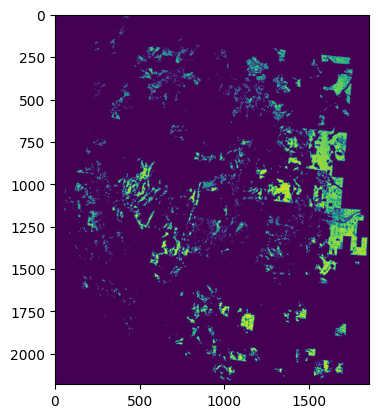

arizona total_generation: 2391803135 needed_generation: 48699201 difference: 2343103934.2218947
california total_generation: 1068800445 needed_generation: 115502531 difference: 953297913.9672071
colorado total_generation: 5244052505 needed_generation: 49239752 difference: 5194812752.9872465
idaho total_generation: 737009818 needed_generation: 1905583 difference: 735104235.048379
montana total_generation: 3389729856 needed_generation: 16717511 difference: 3373012345.314331
new_mexico total_generation: 1543857932 needed_generation: 24131511 difference: 1519726421.4255958
nevada total_generation: 3552551502 needed_generation: 42333837 difference: 3510217665.245117
oregon total_generation: 445181245 needed_generation: 8841840 difference: 436339405.3916797
utah total_generation: 981343401 needed_generation: 116274044 difference: 865069356.9768653
washington total_generation: 774370305 needed_generation: 6986026 difference: 767384278.4508497
wyoming total_generation: 7548442856 needed_genera

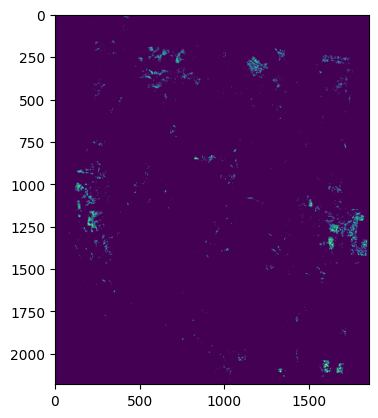

arizona total_generation: 49710155 needed_generation: 48699201 difference: 1010954.5807812512
california total_generation: 737651501 needed_generation: 115502531 difference: 622148969.3840772
colorado total_generation: 987814372 needed_generation: 49239752 difference: 938574620.5543847
idaho total_generation: 159709989 needed_generation: 1905583 difference: 157804406.1811914
montana total_generation: 504276521 needed_generation: 16717511 difference: 487559010.0201416
new_mexico total_generation: 276605329 needed_generation: 24131511 difference: 252473818.0295996
nevada total_generation: 34601752 needed_generation: 42333837 difference: -7732085.138183594
oregon total_generation: 100289130 needed_generation: 8841840 difference: 91447289.71846192
utah total_generation: 65683325 needed_generation: 116274044 difference: -50590718.971621096
washington total_generation: 413058912 needed_generation: 6986026 difference: 406072886.04484373
wyoming total_generation: 112135294 needed_generation: 2

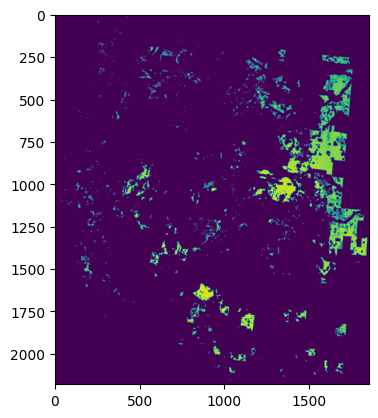

arizona total_generation: 2260689541 needed_generation: 48699201 difference: 2211990340.753877
california total_generation: 494596992 needed_generation: 115502531 difference: 379094460.53031737
colorado total_generation: 3735645191 needed_generation: 49239752 difference: 3686405438.817324
idaho total_generation: 240759570 needed_generation: 1905583 difference: 238853987.8370752
montana total_generation: 3892824054 needed_generation: 16717511 difference: 3876106542.7807617
new_mexico total_generation: 805624414 needed_generation: 24131511 difference: 781492902.8794532
nevada total_generation: 1625887279 needed_generation: 42333837 difference: 1583553441.9101562
oregon total_generation: 199623454 needed_generation: 8841840 difference: 190781613.89509764
utah total_generation: 520895714 needed_generation: 116274044 difference: 404621669.7661719
washington total_generation: 377140875 needed_generation: 6986026 difference: 370154848.6009961
wyoming total_generation: 8188229675 needed_genera

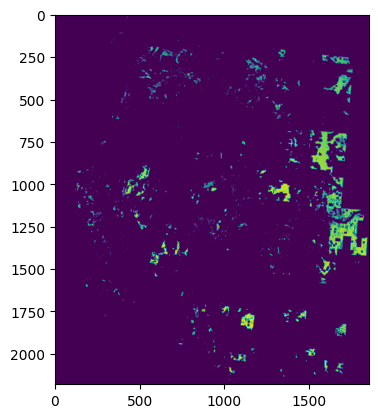

arizona total_generation: 1044105297 needed_generation: 48699201 difference: 995406095.9565136
california total_generation: 285563805 needed_generation: 115502531 difference: 170061273.91410643
colorado total_generation: 3470397881 needed_generation: 49239752 difference: 3421158129.1212792
idaho total_generation: 149439355 needed_generation: 1905583 difference: 147533772.86026856
montana total_generation: 1523736827 needed_generation: 16717511 difference: 1507019316.05896
new_mexico total_generation: 769454371 needed_generation: 24131511 difference: 745322860.3709083
nevada total_generation: 1338385027 needed_generation: 42333837 difference: 1296051190.019287
oregon total_generation: 144143160 needed_generation: 8841840 difference: 135301320.0535449
utah total_generation: 331198035 needed_generation: 116274044 difference: 214923990.97466797
washington total_generation: 330419571 needed_generation: 6986026 difference: 323433544.6361523
wyoming total_generation: 3814010356 needed_generat

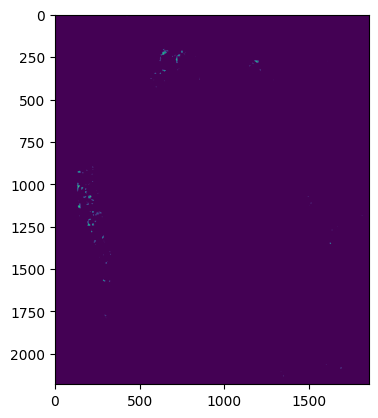

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 148567822 needed_generation: 115502531 difference: 33065290.833662108
colorado total_generation: 3115059 needed_generation: 49239752 difference: -46124693.259091794
idaho total_generation: 581455 needed_generation: 1905583 difference: -1324127.1964941407
montana total_generation: 15491457 needed_generation: 16717511 difference: -1226053.3392333984
new_mexico total_generation: 2102525 needed_generation: 24131511 difference: -22028985.68133789
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 459071 needed_generation: 8841840 difference: -8382769.278730469
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 70065154 needed_generation: 6986026 difference: 63079128.22624023
wyoming total_generation: 1219698 needed_generation: 21468980 difference: -20249282.50453125
dac_fa

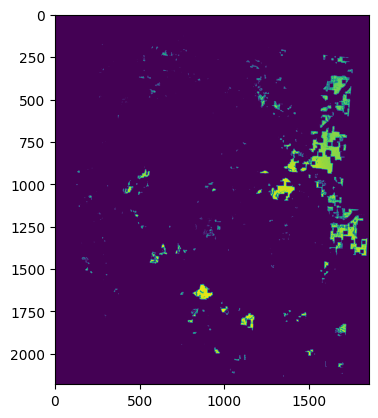

arizona total_generation: 1274889359 needed_generation: 48699201 difference: 1226190158.212373
california total_generation: 88003876 needed_generation: 115502531 difference: -27498655.117265627
colorado total_generation: 2196814390 needed_generation: 49239752 difference: 2147574638.1911035
idaho total_generation: 26324615 needed_generation: 1905583 difference: 24419032.075966798
montana total_generation: 2021680991 needed_generation: 16717511 difference: 2004963479.835205
new_mexico total_generation: 397135516 needed_generation: 24131511 difference: 373004005.1328711
nevada total_generation: 629044924 needed_generation: 42333837 difference: 586711087.0895996
oregon total_generation: 40662995 needed_generation: 8841840 difference: 31821154.803300783
utah total_generation: 144266226 needed_generation: 116274044 difference: 27992182.185605466
washington total_generation: 83683580 needed_generation: 6986026 difference: 76697553.35624512
wyoming total_generation: 4692892354 needed_generatio

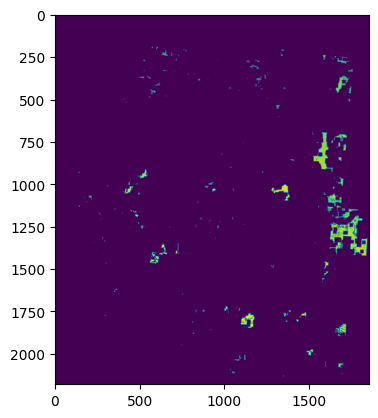

arizona total_generation: 434305992 needed_generation: 48699201 difference: 385606790.8539746
california total_generation: 37407783 needed_generation: 115502531 difference: -78094748.46199219
colorado total_generation: 2040254167 needed_generation: 49239752 difference: 1991014414.9391503
idaho total_generation: 11056586 needed_generation: 1905583 difference: 9151003.7959375
montana total_generation: 470096869 needed_generation: 16717511 difference: 453379358.7487793
new_mexico total_generation: 386006488 needed_generation: 24131511 difference: 361874976.8223242
nevada total_generation: 503836407 needed_generation: 42333837 difference: 461502570.2597656
oregon total_generation: 34519841 needed_generation: 8841840 difference: 25678000.842119142
utah total_generation: 66447018 needed_generation: 116274044 difference: -49827026.54242188
washington total_generation: 78702721 needed_generation: 6986026 difference: 71716695.22697265
wyoming total_generation: 1623084591 needed_generation: 2146

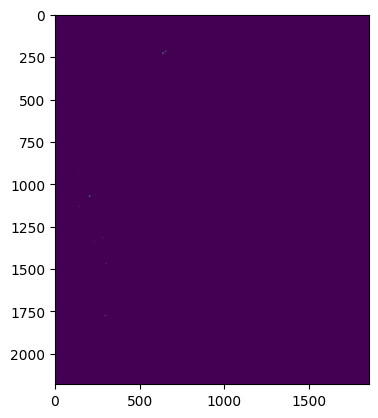

arizona total_generation: 0 needed_generation: 48699201 difference: -48699201.22
california total_generation: 7123125 needed_generation: 115502531 difference: -108379406.64436524
colorado total_generation: 0 needed_generation: 49239752 difference: -49239752.44
idaho total_generation: 0 needed_generation: 1905583 difference: -1905583.04
montana total_generation: 0 needed_generation: 16717511 difference: -16717511.25
new_mexico total_generation: 0 needed_generation: 24131511 difference: -24131511.31
nevada total_generation: 0 needed_generation: 42333837 difference: -42333837.25
oregon total_generation: 0 needed_generation: 8841840 difference: -8841840.58
utah total_generation: 0 needed_generation: 116274044 difference: -116274044.56
washington total_generation: 5146964 needed_generation: 6986026 difference: -1839062.461015625
wyoming total_generation: 0 needed_generation: 21468980 difference: -21468980.61


In [19]:
# open solar potential raster file
solar_array = rasterio.open(solar_potential_path).read(1)

net_zero_dict = gcam_solar_dict
    
for power_density_mw in [15, 30, 45]:

    solar_array_power = solar_array*power_density_mw
    
    tech_type = 'Solar PV'
    print(f'Analyzing {tech_type} for {power_density_mw} MW Power Density...')

    # for each analysis combination
    for analysis_name in exclusion_combos:
    
        # combine the wind potential raster with the additional exclusions
        exclusion_list = exclusion_combos[analysis_name]
        print(analysis_name)
        
        for exc in exclusion_list:
                
            exclusion_array = rasterio.open(exc).read(1)
            
            exclusion_array = np.where(exclusion_array==1, 1, 0)
            
            if exclusion_list[0] == exc:
                combined_exclusion = exclusion_array
            else:
                combined_exclusion += exclusion_array
    
        combined_exclusion = np.where(combined_exclusion >=1, 0, 1)
            
        final_raster = solar_array_power*combined_exclusion
        show(final_raster)
    
        # loop through each state
        for state in output_dict:
            state_id = state_settings_dict[state]['id_no']
            state_array = np.where(conus_array==state_id, 1, 0)
            state_array = np.where(state_array==0, 0, 1)
            
            state_raster = state_array*final_raster
    
            total_generation = (state_raster).sum()
            target_generation = net_zero_dict[state]['value']
    
            # calculate the amount of land required to meet generation goals
            state_raster_list = state_raster.flatten()
            state_raster_list = [i for i in state_raster_list if i != 0]
            state_raster_list.sort()
            
            total_km = 0
            total_gen = 0
            for i in state_raster_list[::-1]:
                if total_gen < target_generation:
                    if total_km == len(state_raster_list):
                        total_km = len(state_raster_list)
                    else:
                        total_km += 1
                        total_gen += i
                else:
                    pass
            print(state, f'total_generation: {int(total_generation)}', 
                          f'needed_generation: {int(target_generation)}', 
                          f'difference: {total_generation-target_generation}',
                 ),            
            output_dict[state][tech_type][power_density_mw][analysis_name]['total_generation'] = total_generation
            output_dict[state][tech_type][power_density_mw][analysis_name]['target_generation'] = target_generation


#### Create Output DataFrame

In [23]:
# convert dictionary to dataframe
result_df = pd.DataFrame.from_dict({(i,j,k, l): output_dict[i][j][k][l] 
                           for i in output_dict.keys() 
                           for j in output_dict[i].keys()
                           for k in output_dict[i][j].keys()
                           for l in output_dict[i][j][k].keys()},
                       orient='index')

result_df = result_df.reset_index().rename(columns={'level_0':'region_name', 
                                                    'level_1':'technology',
                                                    'level_2':'power_density_mw', 
                                                    'level_3': 'case'})
result_df = result_df.rename(columns={'total_generation': 'total_generation_mwh', 'target_generation':'target_generation_mwh'})
result_df['gcam_trading_region'] = result_df.region_name.map(gcam_trading_regions)
result_df.to_csv(os.path.join(output_dir, 'capacity_factor_analysis_2050.csv'), index=False)
result_df

,region_name,technology,power_density_mw,case,total_generation_mwh,target_generation_mwh,gcam_trading_region
0,arizona,Wind_120m,6,baseline,1.483581e+09,27752747.22,SW Grid
1,arizona,Wind_120m,6,dac,6.785346e+08,27752747.22,SW Grid
2,arizona,Wind_120m,6,farmland,1.472422e+09,27752747.22,SW Grid
3,arizona,Wind_120m,6,env_1,1.475175e+09,27752747.22,SW Grid
4,arizona,Wind_120m,6,env_1_1km,1.291385e+09,27752747.22,SW Grid
...,...,...,...,...,...,...,...
1777,wyoming,Solar PV,45,dac_farm_env2_5km,3.814010e+09,21468980.61,SW Grid
1778,wyoming,Solar PV,45,dac_farm_env3_5km,1.219698e+06,21468980.61,SW Grid
1779,wyoming,Solar PV,45,dac_farm_env1_10km,4.692892e+09,21468980.61,SW Grid
1780,wyoming,Solar PV,45,dac_farm_env2_10km,1.623085e+09,21468980.61,SW Grid
